# Recreate figures from Smith and Kitzman, 2023

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pysam
import scipy.stats as ss
import seaborn as sns
import matplotlib
import matplotlib.patches as patches
from sklearn.metrics import roc_curve, precision_recall_curve, auc, f1_score, matthews_corrcoef
import random
import itertools

In [4]:
from collections import defaultdict

In [5]:
%load_ext autoreload
%autoreload 2

In [398]:
pd.options.display.max_columns=2000

In [6]:
import altair as alt
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [7]:
import splanl.post_processing as pp
import splanl.plots as sp
import splanl.coords as cds

In [8]:
matplotlib.rc_file_defaults()
plt.rcParams[ 'pdf.fonttype' ] = 42
plt.rcParams[ 'ps.fonttype' ] = 42
plt.rcParams[ 'font.sans-serif' ] = "Arial"
plt.rcParams[ 'font.family' ] = "sans-serif"
plt.rcParams[ 'xtick.labelsize' ] = 14
plt.rcParams[ 'ytick.labelsize' ] = 14
plt.rcParams[ 'axes.labelsize' ] = 16

In [9]:
hg19 = cds.SeqrefDict( '../data.back/hg19.fa' )

In [10]:
github_colors = '3182bd6baed69ecae1c6dbefe6550dfd8d3cfdae6bfdd0a231a35474c476a1d99bc7e9c0756bb19e9ac8bcbddcdadaeb636363969696bdbdbdd9d9d9'

In [11]:
light_colors = [ '#' + github_colors[i:i+6] for i in range( 0, len( github_colors ), 6 ) ]

In [12]:
grays = [ '.7', '.7', '.7', '.7' ]

In [14]:
back_df = pd.read_table( '../data/background_set/random_500k_scored.2023-0905.txt',
                          dtype = { 'chrom': object } )

/var/folders/r6/x8gz8gvd109_mbz6dbq7d3zc0000gr/T/ipykernel_13455/297116286.py:1: DtypeWarning: Columns (22) have mixed types. Specify dtype option on import or set low_memory=False.
  back_df = pd.read_table( '../data/background_set/random_500k_scored.2023-0905.txt',


In [15]:
# update score columns to be more dscriptive
Lcoldest='HAL_chgPER_abs,S-Cap_sens_min_r,MMSplice_chgPERlogit_abs,SQUIRLS_score_not,SPANR_chgZPER_abs,SpliceAI_DS_maxm,Pangolin_max_abs,ConSpliceML'.split(',')
Lcolsrc='hal_chgPER_abs,scap_sens_min_r,mmsplice_chgPERlogit_abs,squirls_score_not,spanr_chgZPER_abs,DS_maxm,pang_max_abs,conspliceml'.split(',')
for cn in Lcoldest: 
    if cn in back_df.columns:
        del back_df[cn]
back_df = back_df.rename(columns = dict(zip(Lcolsrc,Lcoldest)))

In [16]:
back_df.columns

Index(['gene_name', 'chrom', 'hg19_pos', 'ref', 'alt', 'varlist', 'gene_id',
       'transcript_id', 'strand', 'exon', 'variant_cat', 'exon_start',
       'exon_end', 'mmsplice_chgPERlogit', 'mmsplice_pathogen', 'mmsplice_eff',
       'in_mmsplice', 'mmsplice_chgPERlogit_not', 'mmsplice_pathogen_not',
       'mmsplice_eff_not', 'MMSplice_chgPERlogit_abs', 'squirls_score',
       'squirls_sdv', 'squirls_transcript_id', 'in_squirls',
       'SQUIRLS_score_not', 'scap_type', 'scap_raw', 'scap_sens',
       'scap_raw_dom', 'scap_sens_dom', 'scap_raw_rec', 'scap_sens_rec',
       'scap_raw_max', 'scap_sens_min', 'S-Cap_sens_min_r', 'DS_AGm', 'DS_ALm',
       'DS_DGm', 'DS_DLm', 'DP_AGm', 'DP_ALm', 'DP_DGm', 'DP_DLm',
       'SpliceAI_DS_maxm', 'DS_maxm_type', 'POS_maxm', 'DS_AG', 'DS_AL',
       'DS_DG', 'DS_DL', 'DP_AG', 'DP_AL', 'DP_DG', 'DP_DL', 'DS_max',
       'DS_max_type', 'POS_max', 'pang_incr', 'pang_incr_pos', 'pang_decr',
       'pang_decr_pos', 'pang_max', 'pang_max_type', 'pang

In [17]:
back_df.shape

(500000, 99)

In [18]:
cats = [ 'Deep Exon',
         'Exon Near Junction',
         'Proximal Intron',         
         'Intron Near Junction',
         'Essential Splice' ]

In [19]:
pred_cols = [ 'HAL_chgPER_abs',
              'S-Cap_sens_min_r',
              'MMSplice_chgPERlogit_abs',
              'SQUIRLS_score_not',
              'SPANR_chgZPER_abs',
              'SpliceAI_DS_maxm', 
              'Pangolin_max_abs',
              'ConSpliceML',
               ]

In [20]:
pred_cols_raw = [ 'hal_chgPER',
              'scap_sens_min_r',
              'mmsplice_chgPERlogit',
              'squirls_score_not',
              'spanr_chgZPER',
              'DS_maxm', 
              'pang_max',
              'conspliceml'
               ]

In [21]:
thresh_dict = { 'HAL_chgPER_abs': ( 5, 'ge' ),
                'S-Cap_sens_min_r': ( .05, 'ge' ),
                'MMSplice_chgPERlogit_abs': ( 2, 'ge' ),
                'SQUIRLS_score_not': ( 0.011977, 'ge' ),
                'SPANR_chgZPER_abs': ( 2.5, 'ge' ),
                'SpliceAI_DS_maxm': ( .2, 'ge' ),
                'Pangolin_max_abs': ( .2, 'ge' ),
                'ConSpliceML': ( .5, 'ge' ) }

In [22]:
data_files = ! ls ../data/scored_data/

In [23]:
data_files

['brca1_findlay_scored.2023-0215.txt',
 'fas_ex6_snvs_scored.2023-0215.txt',
 'mlh1_final_scored.2023-0215.txt',
 'pou1f1_snvs_scored.2023-0410.txt',
 'random_500k_scored.2023-0216.txt',
 'ron_ex11_scored.2023-0215.txt',
 'wt1_ex9_scored.2023-0410.txt']

In [25]:
data_dict = { file.split( '_' )[ 0 ].upper(): pd.read_table( '../data/scored_data/' + file,
                                                                                dtype = { 'chrom': object } )
              for file in data_files if file != 'zOld' and 'random' not in file }

In [26]:
data_dict.keys()

dict_keys(['BRCA1', 'FAS', 'MLH1', 'POU1F1', 'RON', 'WT1'])

In [27]:
data_dict[ 'MLH1' ][ 'HALWT_chgPER' ] = data_dict[ 'MLH1' ].hal_chgPER_90
data_dict[ 'FAS' ][ 'HALWT_chgPER' ] = data_dict[ 'FAS' ].hal_chgPER_50
data_dict[ 'RON' ][ 'HALWT_chgPER' ] = data_dict[ 'RON' ].hal_chgPER_60
data_dict[ 'BRCA1' ][ 'HALWT_chgPER' ] = data_dict[ 'BRCA1' ].hal_chgPER_80
data_dict[ 'WT1' ][ 'HALWT_chgPER' ] = data_dict[ 'WT1' ].hal_chgPER_60
data_dict[ 'POU1F1' ][ 'HALWT_chgPER' ] = data_dict[ 'POU1F1' ].hal_chgPER_alpha_90

In [28]:
for dset in data_dict:
    
    df = data_dict[dset]  
    
    df[ 'HAL_chgPER' ] = df.HALWT_chgPER
    df[ 'HALWT_chgPER_abs' ] = df.HALWT_chgPER.abs()
    df[ 'HAL_chgPER_abs' ] = df.HALWT_chgPER_abs
    df[ 'S-Cap_sens_min_r' ] = df.scap_sens_min_r
    df[ 'MMSplice_chgPERlogit_abs' ] = df.mmsplice_chgPERlogit_abs
    df[ 'SQUIRLS_score_not' ] = df.squirls_score_not
    df[ 'SPANR_chgZPER_abs' ] = df.spanr_chgZPER_abs
    df[ 'SpliceAI_DS_maxm' ] = df.DS_maxm
    df[ 'Pangolin_max_abs' ] = df.pang_max_abs
    df[ 'ConSpliceML' ] = df.conspliceml
    
    df[ 'all_scored_scap_ex' ] = df[ [ col for col in pred_cols if 'S-Cap' not in col ] ].notnull().all( axis = 1 )
    df[ 'all_scored_scap_int' ] = ~( df.exon ) & ( df[ [ col for col in pred_cols if 'S-Cap' not in col and 'HAL' not in col ] ].notnull().all( axis = 1 ) )
    df[ 'all_scored_scap_all' ] = df[ [ col for col in pred_cols if 'S-Cap' not in col and 'HAL' not in col ] ].notnull().all( axis = 1 )

In [29]:
# flag patient variants, specific to WT1 dataset
FS_vars = [ 'c.1447+6:T>A', 'c.1447+5:G>A', 'c.1447+5:G>T', 'c.1447+4:C>T', 'c.1447+3:G>T', 'c.1447+2:T>C', 'c.1447+1:G>A', 'c.1447+1:G>C'  ]
OTDSD_vars = [ 'c.1447+3:G>A', 'c.1437:A>G' ]

data_dict[ 'WT1' ][ 'patient_var' ] = [ 'FS' if var in FS_vars else 'OTDSD' if var in OTDSD_vars else ''
                                        for var in data_dict[ 'WT1' ].hgvs_var ] 

In [30]:
data_dict = { name: pp.get_transcriptome_per( back_df,
                                              data_dict[ name ],
                                              pred_cols )
              for name in data_dict }

In [31]:
data_dict[ 'Transcriptome' ] = back_df

In [32]:
for i,col in enumerate( pred_cols ):
    
    for name in data_dict:
        
        if name == 'Transcriptome':
            next
            
        if name == 'FAS':
            
            data_dict[ name ][ col + '_corr' ] = data_dict[ name ][ pred_cols_raw[ i ] ]
            
        else:
            
            data_dict[ name ][ col + '_corr' ] = data_dict[ name ][ col ]

In [33]:
pred_cols_corr = [ col + '_corr' for col in pred_cols ] 

In [34]:
cat_translate = { 'Deep Exon': 'Deep Exonic',
                  'Proximal Intron': 'Deep Intronic',
                  'Exon Near Junction': 'Exonic Near SS',
                  'Intron Near Junction': 'Intronic Near SS',
                  'Essential Splice': 'Canonical' }

In [35]:
data_dict[ 'BRCA1' ].measured = -data_dict[ 'BRCA1' ].measured

# Background

In [36]:
len( pred_cols )

8

# Methods

### Saturation mutagenesis datasets

In [149]:
len( data_dict[ 'FAS' ] ) + len( data_dict[ 'POU1F1' ] ) + len( data_dict[ 'RON' ] ) + len( data_dict[ 'BRCA1' ] ) + len( data_dict[ 'WT1' ] )

3616

In [37]:
data_dict_intmed = { 'POU1F1': pd.read_csv( '../data/exclude_intermediates/supp_tbl.2021-0420.txt',
                                            dtype = { 'chrom': object } ),
                     'WT1': pd.read_table( '../data/exclude_intermediates/wt1_ex9_by_var_effects_snvs_wide-2022-1018.txt' ,
                                            dtype = { 'chrom': object } ), }

In [38]:
# BRCA1 has 69 intermediate variants
sum( data_dict_intmed[ name ].intmed.sum() for name in data_dict_intmed ) + 69

121

In [39]:
#FAS has no introns
#WT1 are all less than 100 bp
#BRCA1 only has short introns
#RON has short introns - already truncated since we are going halfway into the introns only
len( data_dict_intmed[ 'POU1F1' ].loc[ ~data_dict_intmed[ 'POU1F1' ].intmed ] ) - len( data_dict[ 'POU1F1' ] )

93

### Manual curation of clinical MLH1 variants

In [40]:
#counts number of papers
len( set( [ ref
            for ref_col in [ col for col in data_dict[ 'MLH1' ] if col.startswith( 'ref_' ) and 'name' not in col ]
            for ref in data_dict[ 'MLH1' ][ ref_col ] 
            if isinstance( ref, float ) and not np.isnan( ref ) ] ) )

77

In [41]:
( ( data_dict[ 'MLH1' ].sdv_count > 0 ) & ( data_dict[ 'MLH1' ].neut_count > 0 ) ).sum()

8

In [42]:
len( data_dict[ 'MLH1' ] )

296

In [43]:
#lines of evidence
data_dict[ 'MLH1' ][ [ col for col in data_dict[ 'MLH1' ] if col.startswith( 'ref_' ) and 'name' not in col ] ].notnull().sum( axis = 1 ).sum() / len( data_dict[ 'MLH1' ] )

1.7736486486486487

In [44]:
data_dict[ 'MLH1' ].sdv_fc2.sum()

160

# Results

### A validation set of variants and splice effects

In [45]:
len( data_dict[ 'POU1F1' ] ) + len( data_dict[ 'WT1' ] ) + len( data_dict[ 'FAS' ] ) + len( data_dict[ 'RON' ] )

2230

In [46]:
len( data_dict[ 'BRCA1' ] )

1386

In [47]:
len( data_dict[ 'MLH1' ] )

296

In [48]:
sum( len( data_dict[ name ] ) for name in data_dict if name != 'Transcriptome' )

3912

In [49]:
sum( len( data_dict[ name ].exon_num.unique() ) for name in data_dict if name != 'Transcriptome' )

33

In [50]:
prop = { cat: [ 100*( ( df.variant_cat == cat_translate[ cat ] ).sum() / len( df ) ) for df in data_dict.values() ]
         for cat in cats }

prop_df = pd.DataFrame( prop, index = list( data_dict.keys() ) )

In [51]:
prop_df

,Deep Exon,Exon Near Junction,Proximal Intron,Intron Near Junction,Essential Splice
BRCA1,25.685426,7.720058,24.891775,33.189033,8.513709
FAS,68.253968,31.746032,0.000000,0.000000,0.000000
MLH1,36.486486,20.945946,4.054054,10.810811,27.702703
POU1F1,32.412327,8.820404,49.521785,7.332625,1.912859
RON,55.351171,7.859532,28.929766,6.187291,1.672241
WT1,37.848606,14.940239,34.661355,8.964143,3.585657
Transcriptome,37.691400,5.816800,50.544600,4.781200,1.166000


In [52]:
count = { cat: [ ( df.variant_cat == cat_translate[ cat ] ).sum() for df in data_dict.values() ]
         for cat in cats }

count_df = pd.DataFrame( count, index = list( data_dict.keys() ) )

In [53]:
count_df

,Deep Exon,Exon Near Junction,Proximal Intron,Intron Near Junction,Essential Splice
BRCA1,356,107,345,460,118
FAS,129,60,0,0,0
MLH1,108,62,12,32,82
POU1F1,305,83,466,69,18
RON,331,47,173,37,10
WT1,190,75,174,45,18
Transcriptome,188457,29084,252723,23906,5830


In [54]:
ordered_data = [ 'FAS', 'POU1F1', 'RON', 'WT1', 'BRCA1', 'MLH1', 'Transcriptome' ]

In [55]:
prop_df = prop_df.reindex( ordered_data )

In [56]:
count_df = count_df.reindex( ordered_data )

In [57]:
prop_df

,Deep Exon,Exon Near Junction,Proximal Intron,Intron Near Junction,Essential Splice
FAS,68.253968,31.746032,0.000000,0.000000,0.000000
POU1F1,32.412327,8.820404,49.521785,7.332625,1.912859
RON,55.351171,7.859532,28.929766,6.187291,1.672241
WT1,37.848606,14.940239,34.661355,8.964143,3.585657
BRCA1,25.685426,7.720058,24.891775,33.189033,8.513709
MLH1,36.486486,20.945946,4.054054,10.810811,27.702703
Transcriptome,37.691400,5.816800,50.544600,4.781200,1.166000


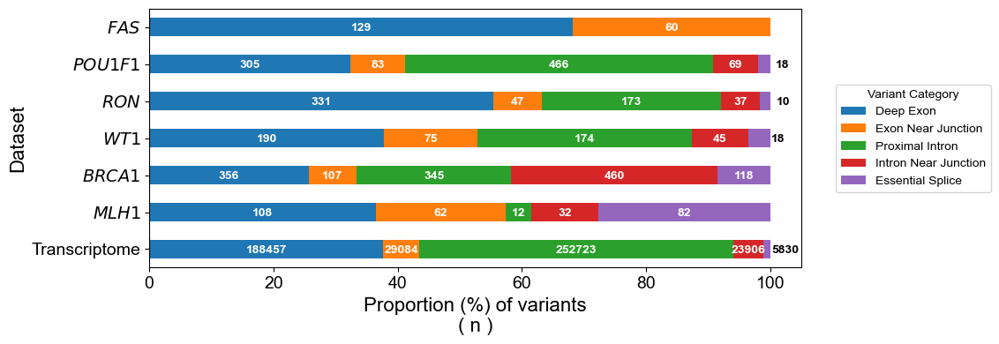

In [58]:
prop_df.iloc[::-1].reset_index().plot( x = 'index', 
                                       y = cats, 
                                       kind = 'barh', 
                                       stacked = True,
                                       figsize = ( 12, 4 ) )

for i in range( len( prop_df ) ):
    
    color = 'white'
    prop_sum = 0
    
    for cat in cats:
        
        propval = prop_df.iloc[::-1].reset_index().iloc[ i ][ cat ]
        
        printval = count_df.iloc[::-1].reset_index().iloc[ i ][ cat ]
    
        if printval == 0:
            
            continue
            
        xval = prop_sum + propval / 2
        
        if prop_sum > 95:

            xval += 3
            color = 'black'
        
        prop_sum += propval

        plt.text( xval, i - .1, str( printval ), 
                  color = color, 
                  fontweight = 'bold',
                  ha = 'center' )

plt.ylabel( 'Dataset' )
plt.xlabel( 'Proportion (%) of variants\n( n )' )

plt.yticks( np.arange( len( ordered_data ) ),
            [ '$\it{%s}$' % name if name != 'Transcriptome' else name for name in ordered_data[ ::- 1 ] ] )

plt.legend( title = 'Variant Category',
            loc = 'center right',
            bbox_to_anchor = ( 1.3, .5 ) )

plt.tight_layout()

plt.savefig( '../plots/cat_proportions_bar.pdf' )

plt.show()

In [59]:
m_ann = pd.read_table( '../data/annots/gencode.v38lift37.MANESelect.mlh1.txt' )

In [60]:
#gets counts of exons
m_ex_per_trans = m_ann.EXON_START.apply( lambda x: len( x.split( ',' ) ) )

In [61]:
## of splice sites
#take # of exons per trans and subtract two ( first & last exon )
#count number of internal exons and multiply by two (acceptor, donor)
#finally, add two splice sites per transcript to account for one ss from each exterior exon
m_ss = 2*( m_ex_per_trans - 2 ).sum() + 2*len( m_ex_per_trans )

In [62]:
#gets a list of integer exon start sites
m_starts = m_ann.EXON_START.apply( lambda x: x.split( ',' ) ).apply( lambda x: [ int( y ) for y in x ] )

In [63]:
#gets a list of integer exon end sites
m_ends = m_ann.EXON_END.apply( lambda x: x.split( ',' ) ).apply( lambda x: [ int( y ) for y in x ] )

In [64]:
#all of the exons are long enough to have deep exonic positions
sum( ( e - s ) < 20 for s_l,e_l in zip( m_starts, m_ends ) for s,e in zip( s_l, e_l ) )

0

In [65]:
sum( e - s for s_l,e_l in zip( m_starts, m_ends ) for s,e in zip( s_l, e_l ) )

2494

In [66]:
#take the list of starts and ends
#for each exon, count # of bp
#sum # of bp across exons
#subtract 10 for each ss to account for SSEX
m_ex = sum( e - s for s_l,e_l in zip( m_starts, m_ends ) for s,e in zip( s_l, e_l ) ) - 10*m_ss

In [67]:
#counts number of introns shorter than 200 bp ( or else DINT will overlap )
#offsets start sites to count distance from s1-e0 and so on
m_short_int = sum( ( s - e ) < 200 for s_l,e_l in zip( m_starts, m_ends ) for s,e in zip( s_l[ 1: ], e_l ) )

In [68]:
m_short_int

1

In [69]:
#counts number of intronic bp for the short introns
m_short_int_sum = sum( s - e for s_l,e_l in zip( m_starts, m_ends ) for s,e in zip( s_l[ 1: ], e_l ) if ( s - e ) < 200 )

In [70]:
#counts total number of intronic bases
#for each intron < 200 bp, subtract two splice sites ( donor, acceptor )
#then muliply remaining ss by 90 
#finally add the number of bases contributed by the short introns
m_intron = ( m_ss - 2*m_short_int )*90 + m_short_int_sum

In [71]:
b_ann = pd.read_table( '../data/annots/gencode.v38lift37.MANESelect.brca1.txt' )

In [72]:
b_starts = b_ann.EXON_START.apply( lambda x: x.split( ',' ) ).apply( lambda x: [ int( y ) for y in x ] )

In [73]:
b_ends = b_ann.EXON_END.apply( lambda x: x.split( ',' ) ).apply( lambda x: [ int( y ) for y in x ] )

In [74]:
b_short_int = sum( ( s - e ) < 200 for s_l,e_l in zip( b_starts, b_ends ) for s,e in zip( s_l[ 1: ], e_l ) )

In [75]:
b_short_int

0

In [76]:
brca_syn_ct = pd.read_table( '../data/annots/brca1_findlay_aa_subs.2023-0215.txt' )

In [77]:
brca_syn_ct = brca_syn_ct.loc[ brca_syn_ct.exon_num.notnull() ].copy()

In [78]:
{ cat: ( ( brca_syn_ct.variant_cat == cat ) & ( brca_syn_ct.syn ) ).sum() 
  for cat in brca_syn_ct.variant_cat.unique() }

{'Exonic Near SS': 107, 'Deep Exonic': 356}

In [79]:
#CAN is #splicesites*2*3
#SSINT is #splicesites*8*3
#DINT is #splicesites*90*3 assuming there is 100 bp on each side (careful with RON!)
#SSEX is #splicesites*10*3
#DEX is ( len( exon ) - 10*#splicesites )*3 
#ron is a 147 bp exon - so 127*3 DEX
#ron has 80 bp (half is 40 bp) btw exon 11&12 and 77 bp (half is 44 bp) btw exon 10&11 - so 30*3 + 34*3 
#fas is a 63 bp exon - so 43*3 DEX
#pou1f1 is a 150 bp exon - so 130*3 DEX
#brca1 3-5 have 54 + 78 + 89 bp exon - so 161*3 DEX
#brca1 15-18 have 311 + 88 + 78 + 41 bp exon - so 438*3 DEX
#brca1 19-22 have 84 + 55 + 74 + 61 bp exon - so 194*3 DEX
#brca1 surveyed exons have 161 + 438 + 194 bp DEX - so 793*3 DEX total
#wt1 is a 93 bp exon - so 73 DEX
#
#use 100 genes as reference for genome

tot_pos = { 'Deep Exon': [ 43*3, 110*3, 127*3, 64*3, 356, m_ex*3, ],
            'Proximal Intron': [ 180*3, 180*3, 30*3 + 34*3, 60*3, 22*90*3, m_intron*3, ],
            'Exon Near Junction': [ 20*3, 30*3, 20*3, 27*3, 107, m_ss*10*3, ],
            'Intron Near Junction': [ 16*3, 24*3, 16*3, 8*2*3, 22*8*3, m_ss*8*3, ],
            'Essential Splice': [ 4*3, 6*3, 4*3, 6*3, 44*3, m_ss*2*3, ] }

tot_pos_df = pd.DataFrame( tot_pos, index = [ name for name in ordered_data if name != 'Transcriptome' ] )

In [80]:
tot_pos_df

,Deep Exon,Proximal Intron,Exon Near Junction,Intron Near Junction,Essential Splice
FAS,129,540,60,48,12
POU1F1,330,540,90,72,18
RON,381,192,60,48,12
WT1,192,180,81,48,18
BRCA1,356,5940,107,528,132
MLH1,6402,9624,1080,864,216


In [81]:
count_df

,Deep Exon,Exon Near Junction,Proximal Intron,Intron Near Junction,Essential Splice
FAS,129,60,0,0,0
POU1F1,305,83,466,69,18
RON,331,47,173,37,10
WT1,190,75,174,45,18
BRCA1,356,107,345,460,118
MLH1,108,62,12,32,82
Transcriptome,188457,29084,252723,23906,5830


In [82]:
pos_prop_df = 100*( count_df.loc[ [ name for name in ordered_data if name != 'Transcriptome' ] ] / tot_pos_df )

In [83]:
pos_prop_df

,Deep Exon,Essential Splice,Exon Near Junction,Intron Near Junction,Proximal Intron
FAS,100.000000,0.000000,100.000000,0.000000,0.000000
POU1F1,92.424242,100.000000,92.222222,95.833333,86.296296
RON,86.876640,83.333333,78.333333,77.083333,90.104167
WT1,98.958333,100.000000,92.592593,93.750000,96.666667
BRCA1,100.000000,89.393939,100.000000,87.121212,5.808081
MLH1,1.686973,37.962963,5.740741,3.703704,0.124688


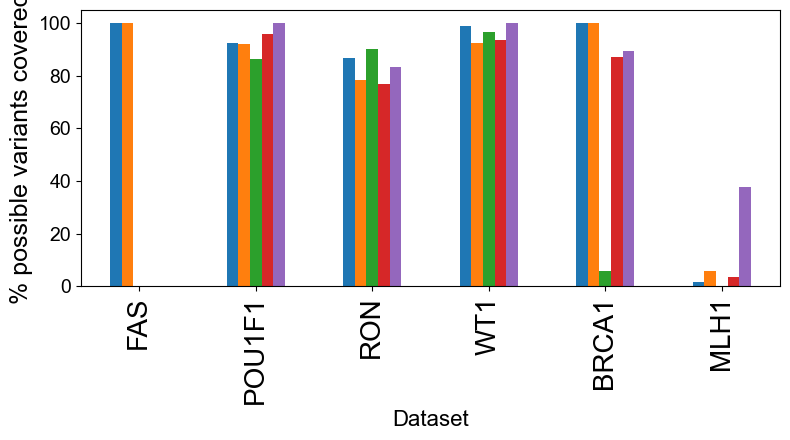

In [84]:
pos_prop_df.reset_index().plot( x = 'index', 
                                y = cats, 
                                kind = 'bar', 
                                figsize = ( 8, 4.5 ),
                                legend = False )

plt.xlabel( 'Dataset',
            fontsize = 16 )
plt.ylabel( '% possible variants covered',
            fontsize = 18 )

plt.xticks( np.arange( len( pos_prop_df ) ),
            [ '%s' % name for name in ordered_data if name != 'Transcriptome'  ],
           fontsize = 20 )

#plt.legend( title = 'Variant category',
            #loc = 'center right',
            #bbox_to_anchor = ( 1.6, .5 ) )

plt.tight_layout()

plt.savefig( '../plots/cat_proportions_of_tot_bar.pdf' )

plt.show()

In [85]:
{ name: len( data_dict[ name ] )  for name in data_dict if name != 'Transcriptome' }

{'BRCA1': 1386, 'FAS': 189, 'MLH1': 296, 'POU1F1': 941, 'RON': 598, 'WT1': 502}

In [86]:
{ name: len( data_dict[ name ].exon_num.unique() )  for name in data_dict if name != 'Transcriptome' }

{'BRCA1': 11, 'FAS': 1, 'MLH1': 18, 'POU1F1': 1, 'RON': 1, 'WT1': 1}

In [87]:
#no reverse strand here bc the ref, alt is relative to transcribed strand for now
pou1f1_sat = sp.saturate_variants( data_dict[ 'POU1F1' ],
                                   hg19['chr3'],
                                  'hg19_pos',
                                   'exon_num', )[ 2 ]

In [88]:
fas_sat = sp.saturate_variants( data_dict[ 'FAS' ],
                                hg19['chr10'],
                                'hg19_pos',
                                'exon_num', )[ 6 ]

In [89]:
ron_sat = sp.saturate_variants( data_dict[ 'RON' ],
                                 hg19['chr3'],
                                'hg19_pos',
                                'exon_num',
                                rev_strand = True )[ 11 ]

In [416]:
wt1_sat = sp.saturate_variants( data_dict[ 'WT1' ],
                                 hg19['chr3'],
                                'hg19_pos',
                                'exon_num',
                                rev_strand = True )[ 9 ]

In [91]:
mpsa_sat_dict = { 'POU1F1': pou1f1_sat,
                  'FAS': fas_sat,
                  'RON': ron_sat,
                  'WT1': wt1_sat }

In [92]:
{ col: min( float( data_dict[ name ][ col ].min() ) for name in data_dict ) 
  for col in pred_cols }

{'HAL_chgPER_abs': 0.0,
 'S-Cap_sens_min_r': 0.0,
 'MMSplice_chgPERlogit_abs': 1.0323740000969373e-07,
 'SQUIRLS_score_not': 0.0055182013905033,
 'SPANR_chgZPER_abs': 0.0,
 'SpliceAI_DS_maxm': 0.0,
 'Pangolin_max_abs': 0.0,
 'ConSpliceML': 0.0}

In [93]:
{ col: max( float( data_dict[ name ][ col ].max() ) for name in data_dict ) 
  for col in pred_cols }

{'HAL_chgPER_abs': 90.0,
 'S-Cap_sens_min_r': 1.0,
 'MMSplice_chgPERlogit_abs': 7.504506649588071,
 'SQUIRLS_score_not': 0.999999913554597,
 'SPANR_chgZPER_abs': 5.814,
 'SpliceAI_DS_maxm': 1.0,
 'Pangolin_max_abs': 0.92,
 'ConSpliceML': 1.0}

In [94]:
ylim =  [ ( -1, 91 ),
          ( -.1, 1.1 ),
          ( -.1, 7.2 ),
          ( -.1, 1.1 ),
          ( -.1, 5.1 ),
          ( -.1, 1.1 ),
          ( -.1, 1.1 ),
          ( -.1, 1.1 ) ]

In [95]:
{ col: min( float( data_dict[ name ][ col ].min() ) for name in data_dict ) 
  for col in pred_cols_corr }

{'HAL_chgPER_abs_corr': -50.0,
 'S-Cap_sens_min_r_corr': 0.0,
 'MMSplice_chgPERlogit_abs_corr': -2.139718782902015,
 'SQUIRLS_score_not_corr': 0.0055182013905033,
 'SPANR_chgZPER_abs_corr': -3.002,
 'SpliceAI_DS_maxm_corr': 0.0,
 'Pangolin_max_abs_corr': -0.37,
 'ConSpliceML_corr': 0.0}

In [96]:
{ col: max( float( data_dict[ name ][ col ].max() ) for name in data_dict ) 
  for col in pred_cols_corr }

{'HAL_chgPER_abs_corr': 90.0,
 'S-Cap_sens_min_r_corr': 1.0,
 'MMSplice_chgPERlogit_abs_corr': 7.504506649588071,
 'SQUIRLS_score_not_corr': 0.999999913554597,
 'SPANR_chgZPER_abs_corr': 5.814,
 'SpliceAI_DS_maxm_corr': 1.0,
 'Pangolin_max_abs_corr': 0.92,
 'ConSpliceML_corr': 1.0}

In [97]:
ylim_corr =  [ ( -55, 55 ),
              ( -.1, 1.1 ),
              ( -2.5, 2.5 ),
              ( -.1, 1.1 ),
              ( -3.3, 5.9 ),
              ( -.1, 1.1 ),
              ( -.5, .5 ),
              ( -.1, 1.1 ) ]

In [98]:
ylab = [ 'HAL', 'S-Cap', 'MMSplice', 'SQUIRLS', 'SPANR', 'SpliceAI', 'Pangolin', 'ConSpliceML' ]

In [99]:
{ name: data_dict[ name ][ 'measured' ].min() for name in data_dict if name != 'MLH1' and name != 'Transcriptome' }

{'BRCA1': -1.00686242236853,
 'FAS': -6.715,
 'POU1F1': 0.2263844804648838,
 'RON': 1.0411138080001323,
 'WT1': 0.2698708950365868}

In [103]:
{ name: data_dict[ name ][ 'measured' ].max() for name in data_dict if name != 'MLH1' and name != 'Transcriptome' }

{'BRCA1': 5.65079506276544,
 'FAS': 1.456,
 'POU1F1': 376.0536512970425,
 'RON': 149.40884841490987,
 'WT1': 251.4665100867536}

In [104]:
data_dict[ 'FAS' ].EnrichmentScore.min()

-6.715

In [105]:
data_dict[ 'FAS' ].EnrichmentScore.max()

1.456

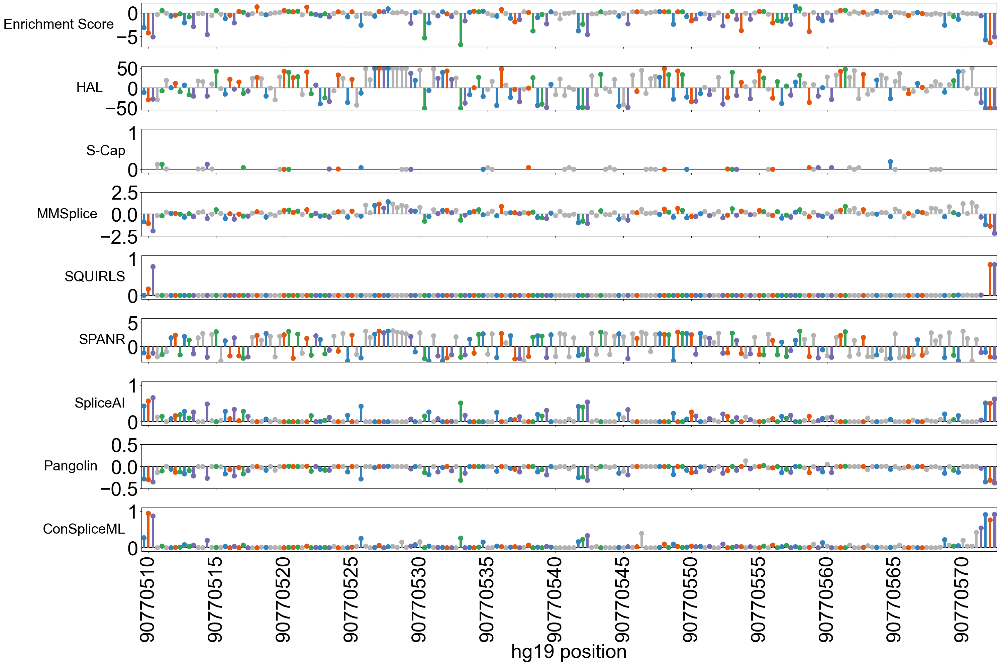

In [106]:
sp.sat_lollipop_subplots_wrapper( data_dict[ 'FAS' ],
                                  [ 'EnrichmentScore' ] + pred_cols_corr,
                                  'hg19_pos',
                                  grays,
                                  fig_size = ( 30, 20 ),
                                  share_y = False,
                                  legend = False,
                                  darken_bars = [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ],
                                  y_ax_lim = [ ( -7.2, 2.1 ) ] + ylim_corr,
                                  y_ax_title = [ 'Enrichment Score' ] + ylab, 
                                  y_label_fontsize = 30,
                                  y_label_rotation = 0,
                                  x_ax_title = 'hg19 position',
                                  hlines = [ ( 0, 'black', 'solid' ) for i in range( len( pred_cols_corr ) + 1 ) ],
                                  tick_spacing = 5,
                                  savefile = '../plots/fas_tracks.pdf'
                                 )

In [107]:
ron_isos = [ 'AE inclusion (%)', 'AE skipping (%)', 'full IR (%)', 'first IR (%)', 'second IR (%)', 'other (%)' ]

In [108]:
ron_sat.loc[ ron_sat.DS_maxm.isnull(), 'pos' ] = [ -hg19 for hg19 in ron_sat.loc[ ron_sat.DS_maxm.isnull() ].hg19_pos ]

In [109]:
{ iso: ( ron_sat[ iso ].min(), ron_sat[ iso ].max() ) for iso in ron_isos }

{'AE inclusion (%)': (0.21, 88.13),
 'AE skipping (%)': (0.07, 94.62),
 'full IR (%)': (3.66, 53.72),
 'first IR (%)': (0.03, 21.2),
 'second IR (%)': (0.04, 6.27),
 'other (%)': (0.1, 7.96)}

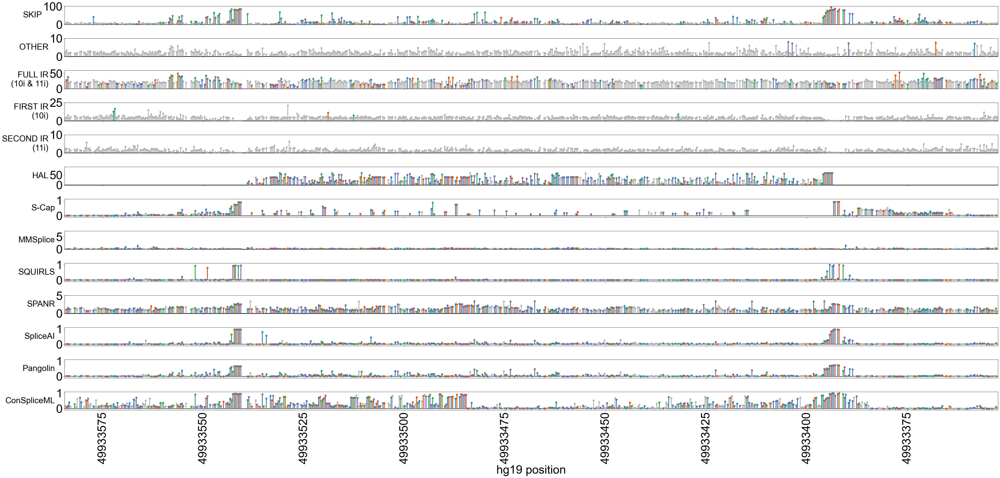

In [110]:
sp.sat_lollipop_subplots_wrapper( ron_sat.rename( columns = { 'ref': 'ref_c',
                                                     'alt': 'alt_c',
                                                     'ref_c': 'ref',
                                                     'alt_c': 'alt' } ),
                                 [ 'AE skipping (%)', 'other (%)', 'full IR (%)', 'first IR (%)', 'second IR (%)' ] + pred_cols,
                                 'hg19_pos',
                                  grays,
                                  fig_size = ( 50, 24 ),
                                  linewidth = 3,
                                  lollipop_size = 6,
                                  share_y = False,
                                  legend = False,
                                  darken_bars = [ ( 'SKIP_sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ),
                                                  ( 'OTHER_sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ),
                                                  ( 'FULLIR_sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ),
                                                  ( 'FIRSTIR_sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ),
                                                  ( 'SECONDIR_sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ] \
                                                + [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ]*len( ylim ),
                                  y_ax_lim = [ ( -.1, 100 ), ( -.1, 10 ), ( 0, 60 ), ( -.1, 25 ), ( -.1, 10 ) ] + ylim,
                                  y_ax_title = [ 'SKIP', 'OTHER', 'FULL IR\n(10i & 11i)', 'FIRST IR\n(10i)', 'SECOND IR\n(11i)' ] + ylab,
                                  y_label_fontsize = 30,
                                  y_label_rotation = 0,
                                  x_ax_title = 'hg19 position',
                                  tick_spacing = 25,
                                  hlines = [ ( 0, 'black', 'solid' ) for i in range( len( pred_cols ) + 5 ) ],
                                  savefile = '../plots/ron_tracks.pdf'
                     )

In [111]:
wt1_sat[ 'pos' ] = wt1_sat.hg19_pos - 32412079 - 2*( wt1_sat.hg19_pos - wt1_sat.hg19_pos.min() )

In [112]:
wt1_isos = [ 'wmean_KTS_+_ratio_log2', 'wmean_SKIP_100', 'wmean_OTHER_100',   ]

In [113]:
{ iso: ( wt1_sat[ iso ].min(), wt1_sat[ iso ].max() ) for iso in wt1_isos }

{'wmean_KTS_+_ratio_log2': (-2.8067884736085853, 2.9809134279864784),
 'wmean_SKIP_100': (5.21005428369129, 74.94919252404281),
 'wmean_OTHER_100': (0.0, 35.8226439244275)}

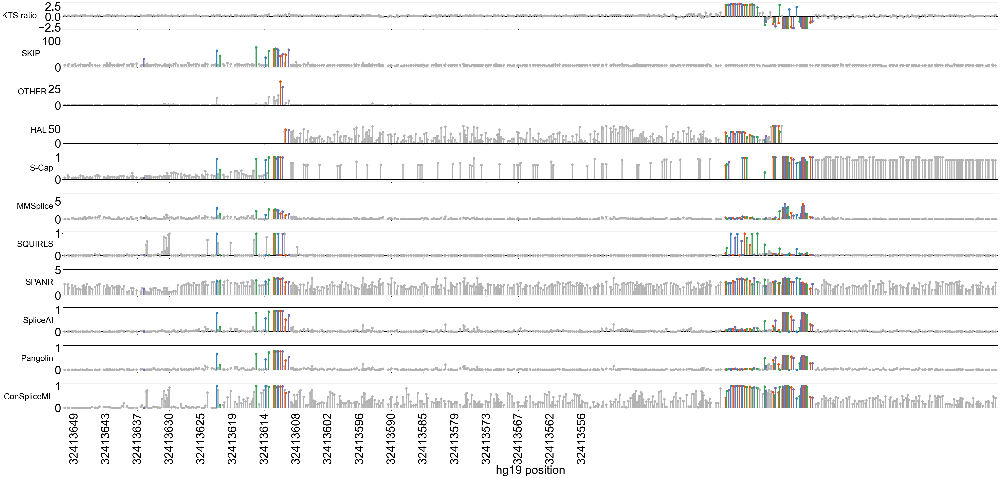

In [114]:
sp.sat_lollipop_subplots_wrapper( wt1_sat.rename( columns = { 'ref': 'ref_c',
                                                     'alt': 'alt_c',
                                                     'ref_c': 'ref',
                                                     'alt_c': 'alt' } ),
                                 wt1_isos + pred_cols,
                                 'hg19_pos',
                                  grays,
                                  fig_size = ( 50, 24 ),
                                  linewidth = 4,
                                  lollipop_size = 8,
                                  share_y = False,
                                  legend = False,
                                  darken_bars = [ ( 'KTS_+_ratio_log2_sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ),
                                                  ( 'SKIP_sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ),
                                                  ( 'OTHER_sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ), ] \
                                                + [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ]*len( ylim ),
                                  y_ax_lim = [ ( -3, 3.3 ), ( 0, 100 ), ( -.1, 40 ) ] + ylim,
                                  y_ax_title = [ 'KTS ratio', 'SKIP', 'OTHER', ] + ylab,
                                  y_label_fontsize = 30,
                                  y_label_rotation = 0,
                                  x_ax_title = 'hg19 position',
                                  hlines = [ ( 0, 'black', 'solid' ) for col in wt1_isos + pred_cols ],
                                  tick_spacing = 10,                         
                                  savefile = '../plots/wt1_tracks.pdf'
                     )

In [115]:
pou1f1_sat[ 'ref_c' ] = [ cds.rev_complement( r ) for r in pou1f1_sat.ref ]

In [116]:
pou1f1_sat[ 'alt_c' ] = [ cds.rev_complement( a ) for a in pou1f1_sat.alt ]

In [117]:
#plots get messed up without the vector position included
pou1f1_sat[ 'pos' ] = pou1f1_sat.hg19_pos - 87321025 - 2*( pou1f1_sat.hg19_pos - pou1f1_sat.hg19_pos.min() )

In [118]:
pou1f1_sat[ 'hgvs_pos' ] = cds.pos_to_hgvspos( pou1f1_sat.pos,
                                                      ( 1038, 1450 ),
                                                      [ ( 1123,1272 ), ],
                                                      [ ( 143, 292 ), ] )

In [119]:
pou1f1_isos = [ 'wmean_SKIP', 'wmean_BETA', 'wmean_OTHER' ]

In [120]:
{ iso: pou1f1_sat[ iso ].max() for iso in pou1f1_isos }

{'wmean_SKIP': 71.95174254618112,
 'wmean_BETA': 38.832199546485256,
 'wmean_OTHER': 45.55312877335038}

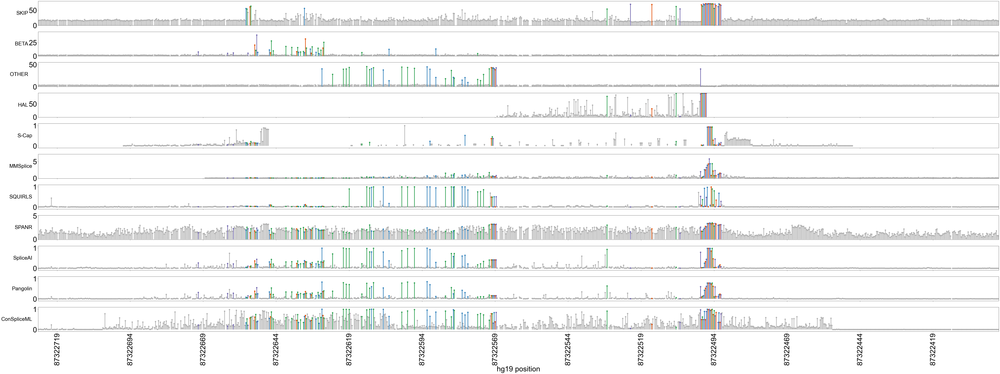

In [121]:
sp.sat_lollipop_subplots_wrapper( pou1f1_sat.rename( columns = { 'ref': 'ref_c',
                                                                  'alt': 'alt_c',
                                                                  'ref_c': 'ref',
                                                                  'alt_c': 'alt' } ),
                                [ 'wmean_SKIP', 'wmean_BETA', 'wmean_OTHER' ] + pred_cols,
                                'hg19_pos',
                                grays,
                                fig_size = ( 80, 30 ),
                                linewidth = 3.5,
                                lollipop_size = 7,
                                share_y = False,
                                legend = False,
                                darken_bars = [ ( 'SKIP_sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ),
                                                  ( 'BETA_sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ),
                                                  ( 'OTHER_sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ] \
                                                + [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ]*len( ylim ),
                                y_ax_lim = [ ( -.1, 80 ), ( -.1, 45 ), ( -.1, 55 ) ] + ylim,
                                y_ax_title = [ 'SKIP', 'BETA', 'OTHER' ] + ylab,
                                y_label_fontsize = 30,
                                y_label_rotation = 0,
                                x_ax_title = 'hg19 position',
                                tick_spacing = 25,
                                savefile = '../plots/pou1f1_tracks.pdf'
                           )

In [122]:
brca_by_ex = sp.saturate_variants( data_dict[ 'BRCA1' ],
                                    hg19['chr17'],
                                    'hg19_pos',
                                    'exon_num',
                                    rev_strand = True,
                                 )

In [123]:
for ex in brca_by_ex:    
    brca_by_ex[ ex ].pos = -brca_by_ex[ ex ].hg19_pos

In [124]:
{ 'function': ( data_dict[ 'BRCA1' ][ 'function.score.mean' ].min(), data_dict[ 'BRCA1' ][ 'function.score.mean' ].max() ),
  'rna': ( data_dict[ 'BRCA1' ][ 'mean.rna.score' ].min(), data_dict[ 'BRCA1' ][ 'mean.rna.score' ].max() ) }

{'function': (-5.65079506276544, 1.00686242236853),
 'rna': (-4.63892078614309, 1.50727813749618)}

3


/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


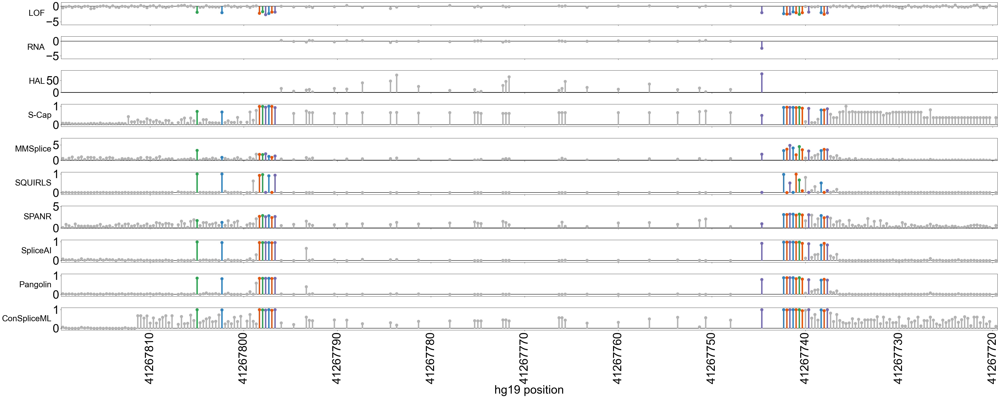

4


/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


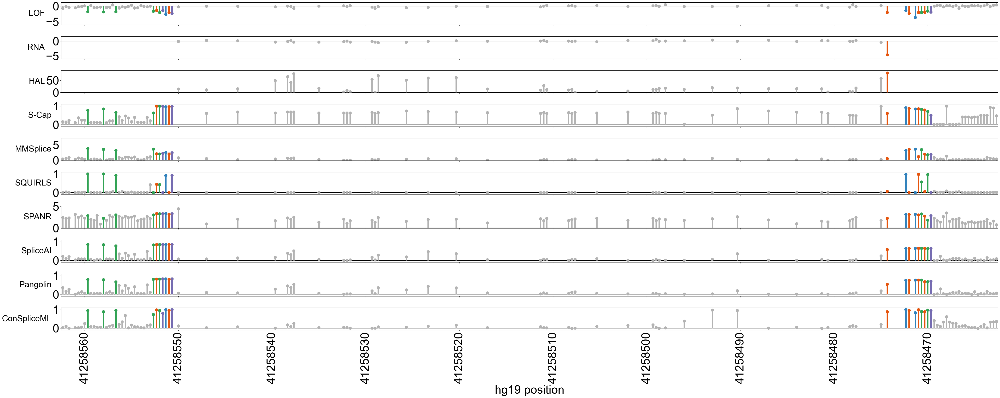

5


/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


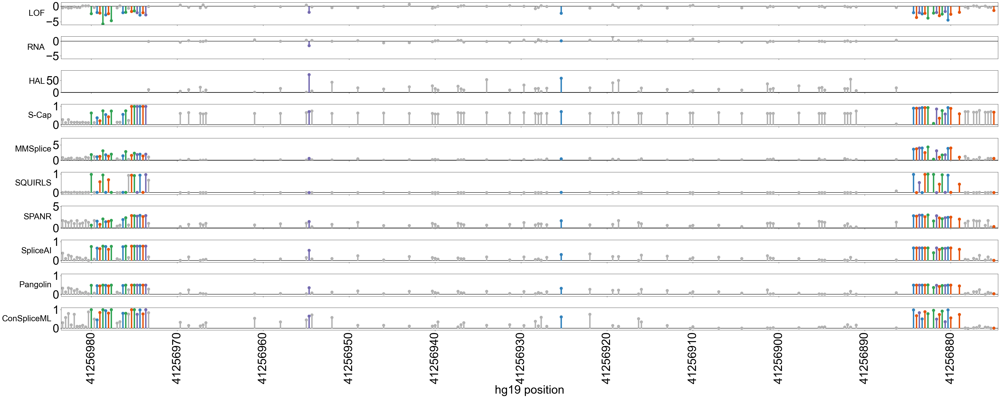

15


/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


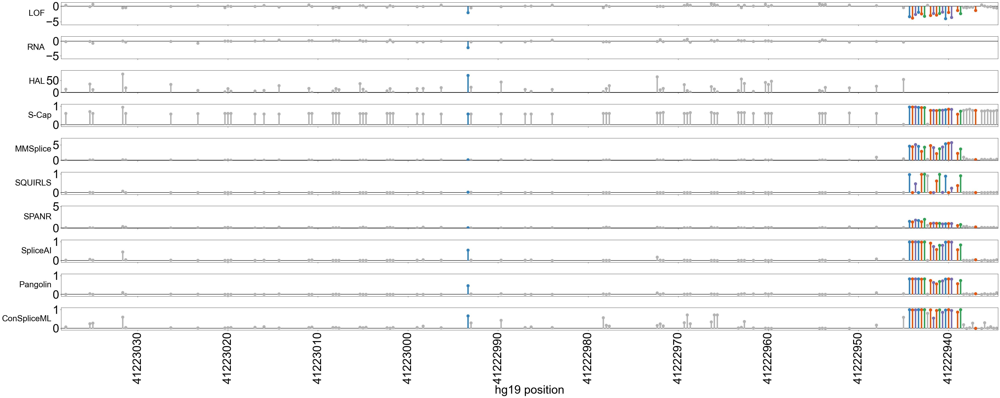

16


/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


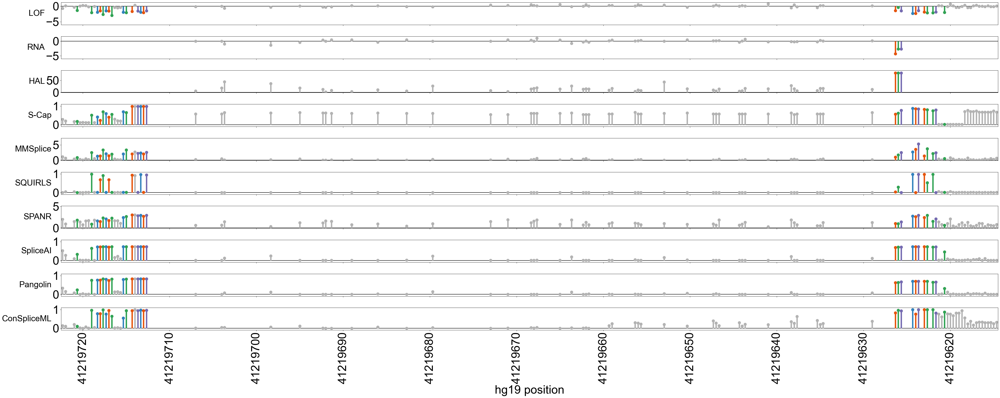

17


/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


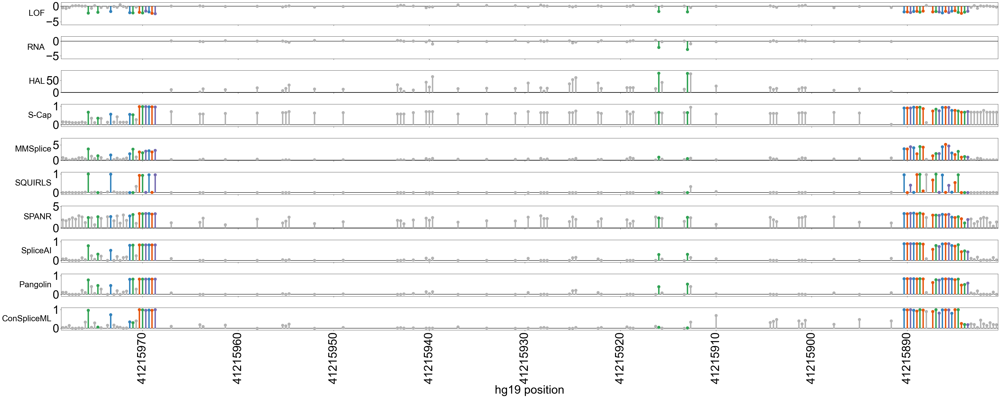

18


/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


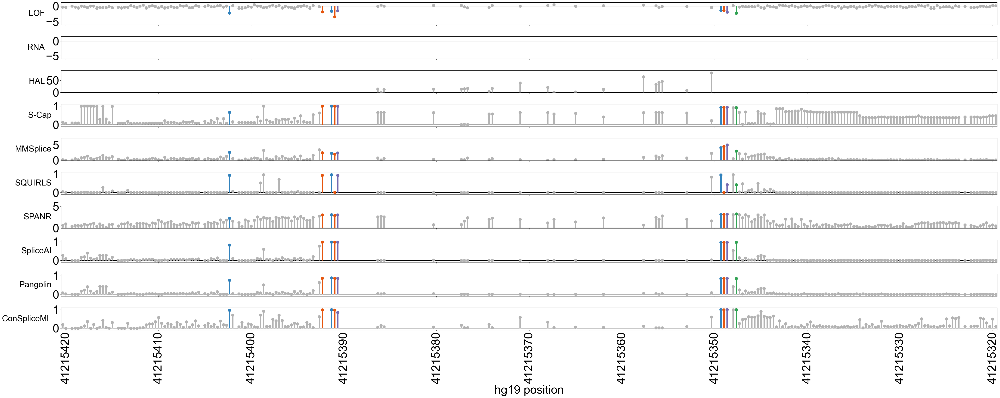

19


/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


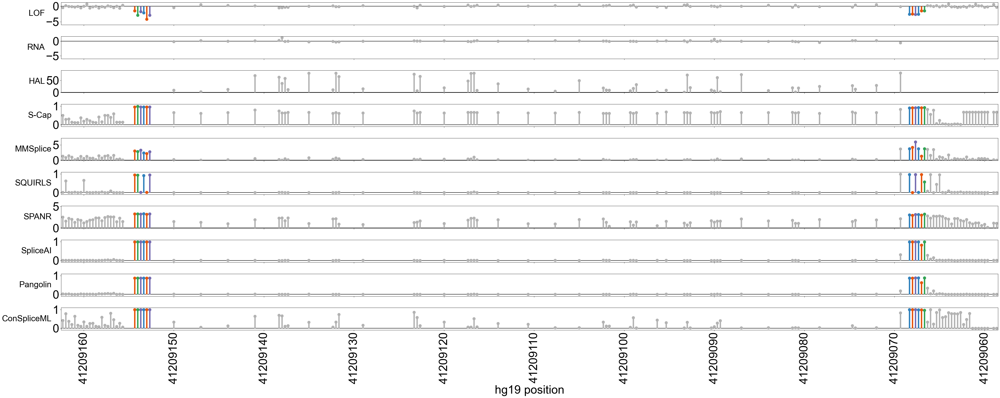

20


/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


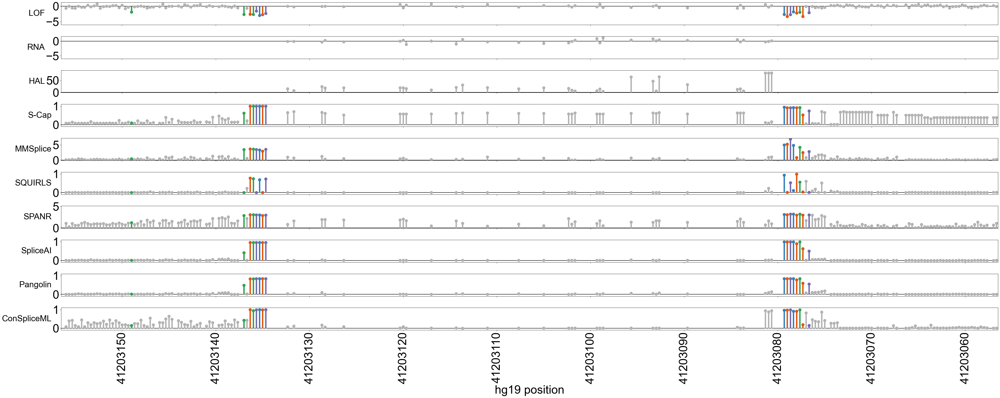

21


/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


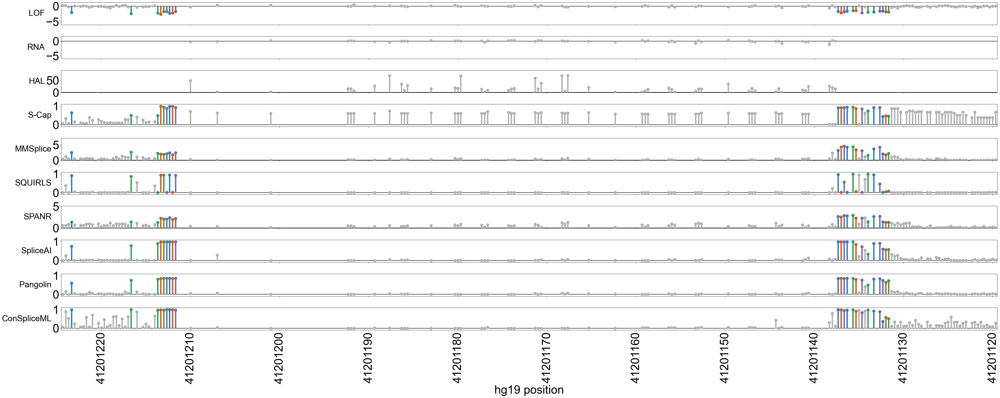

22


/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


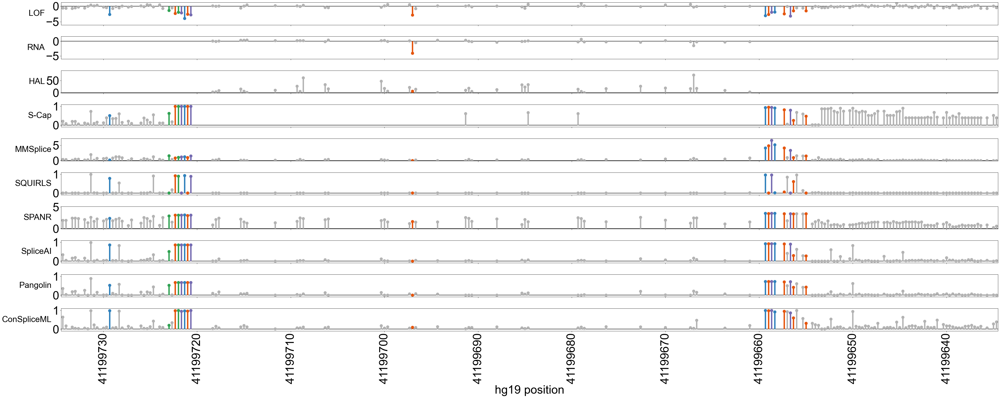

In [125]:
for ex in brca_by_ex.keys():
    
    print( ex )
    
    sp.sat_lollipop_subplots_wrapper( brca_by_ex[ ex ].rename( columns = { 'ref': 'ref_c',
                                                             'alt': 'alt_c',
                                                             'ref_c': 'ref',
                                                             'alt_c': 'alt' } ),
                                     [ 'function.score.mean', 'mean.rna.score' ] + pred_cols,
                                     'hg19_pos',
                                     grays,
                                     fig_size = ( 50, 20 ),
                                     share_y = False,
                                     legend = False,
                                     darken_bars = [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ],
                                     y_ax_lim = [ ( -6, 1.2 ), ( -6, 1.6 ) ] + ylim,
                                     y_ax_title = [ 'LOF', 'RNA' ] + ylab,
                                     y_label_fontsize = 30,
                                     y_label_rotation = 0,
                                     x_ax_title = 'hg19 position',
                                     hlines = [ ( 0, 'black', 'solid' ) for col in [ 'measured', 'measured_rna' ] + pred_cols ],
                                     tick_spacing = 10,
                                     savefile = '../plots/brca_tracks_exon%s.pdf' % str( ex )
                            )

In [126]:
mlh1_by_ex = sp.saturate_variants( data_dict[ 'MLH1' ],
                                hg19['chr3'],
                                'hg19_pos',
                                'exon_num' )

In [127]:
#possible out of targetted
100*( sum( len( data_dict[ name ] ) for name in mpsa_sat_dict ) 
      / sum( len( mpsa_sat_dict[ name ] ) for name in mpsa_sat_dict ) )

80.91436865021771

In [128]:
{ name: 100*( data_dict[ name ].sdv_fc2.sum() / len( data_dict[ name ] ) ) 
  for name in data_dict if name != 'Transcriptome' and name != 'MLH1' }

{'BRCA1': 16.08946608946609,
 'FAS': 60.84656084656085,
 'POU1F1': 10.201912858660998,
 'RON': 68.39464882943143,
 'WT1': 11.354581673306772}

In [129]:
per_sdv = pd.Series( [ 100*( data_dict[ name ].sdv_fc2.sum() / len( data_dict[ name ] ) ) 
                       for name in ordered_data if name != 'Transcriptome' ],
                       index = [ name for name in ordered_data if name != 'Transcriptome' ] )

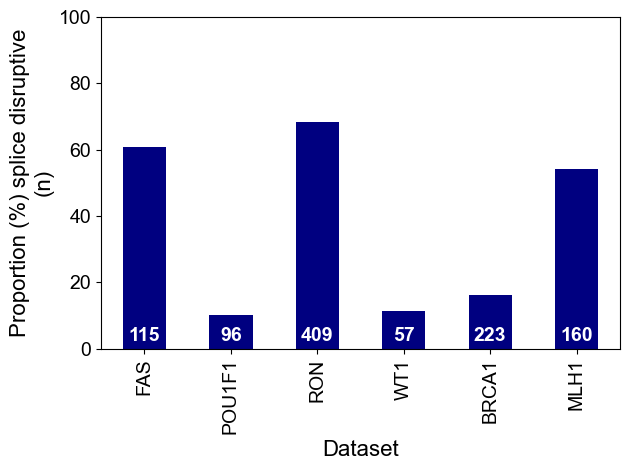

In [130]:
per_sdv.plot.bar( color = 'navy' )

for i,name in enumerate( per_sdv.index ):

    plt.text( i, 
              2.5, 
              str( int( data_dict[ name ].sdv_fc2.sum() ) ),
              fontsize = 14,
              fontweight = 'heavy',
              color = 'white', 
              ha = 'center' 
        )

plt.ylim( ( 0, 100 ) )

plt.ylabel( 'Proportion (%) splice disruptive\n(n)' )

plt.xlabel( 'Dataset' )

plt.tight_layout()

plt.savefig( '../plots/prop_sdv.pdf' )

plt.show()

In [131]:
100*( count_df.loc[ 'MLH1' ][ [ col for col in count_df ] ].sum() 
     / tot_pos_df.loc[ 'MLH1' ][ [ col for col in tot_pos_df ] ].sum() )

1.6276256461013965

In [132]:
100*( ( ( data_dict[ 'MLH1' ].variant_cat != 'Deep Intronic' ) \
        & ( data_dict[ 'MLH1' ].variant_cat != 'Deep Exonic' ) ).sum() / len( data_dict[ 'MLH1' ] ) )

59.45945945945946

In [133]:
squirls_varcat = pd.read_table( '../data/squirls_specific/squirls_varcat.txt' )

In [134]:
{ cat: 100*( ( squirls_varcat.variant_cat == cat ).sum() / ( squirls_varcat.variant_cat != '' ).sum() )
  for cat in squirls_varcat.variant_cat.unique() if isinstance( cat, str ) }

{'Exonic Near SS': 94.62869502523432, 'Deep Exonic': 5.070896419130016}

In [135]:
#from S-Cap Fig 1c - counts of pathogenic variants by region in their training data
can = 5835 + 7044 + 2279
all_v = 5835 + 7044 + 1419 + 317 + 2279 + 165

print( can )

print( all_v )

100*( can / all_v )

15158
17059


88.85632217597748

### Comparing bioinformatic predictions with MPSA measured effects

In [136]:
len( pred_cols )

8

In [137]:
for df in data_dict.values():
    df[ 'all_scored' ] = df[ pred_cols ].notnull().all( axis = 1 )

In [138]:
100*( sum( data_dict[ name ].all_scored_scap_all.sum() 
          for name in data_dict if name != 'Transcriptome' ) / sum( len( data_dict[ name ] )
                                                                    for name in data_dict if name != 'Transcriptome' ) )

93.1237218813906

In [139]:
corr_df = pd.concat( [ data_dict[ name ][ pred_cols + pred_cols_raw ].copy()
                       for name in data_dict if name != 'Transcriptome' ],
                     ignore_index = True )

In [140]:
def get_pairwise_corr( corr_tbl,
                       corr_cols ):
    
    tbl = corr_tbl.copy()
    
    pearson_out = np.empty( ( len( corr_cols ), len( corr_cols ) ) )
    spearman_out = np.empty( ( len( corr_cols ), len( corr_cols ) ) )
    
    np.fill_diagonal( pearson_out, np.nan )
    np.fill_diagonal( spearman_out,  np.nan )
    
    combos = list( itertools.combinations( corr_cols, 2 ) )
    indices = list( itertools.combinations( np.arange( len( corr_cols ) ), 2 ) )
    
    for pair,idx in zip( combos, indices ):
        
        tbl_nomiss = tbl.loc[ ( tbl[ pair[ 0 ] ].notnull() ) & ( tbl[ pair[ 1 ] ].notnull() ) ].copy()
        
        pearson_out[ idx[ 1 ], idx[ 0 ] ] = ss.pearsonr( tbl_nomiss[ pair[ 0 ] ], tbl_nomiss[ pair[ 1 ] ] )[ 0 ]
        #pearson_out[ idx[ 1 ], idx[ 0 ] ] = pearson_out[ idx[ 0 ], idx[ 1 ] ]
        pearson_out[ idx[ 0 ], idx[ 1 ] ] = np.nan
        
        spearman_out[ idx[ 1 ], idx[ 0 ] ] = ss.spearmanr( tbl_nomiss[ pair[ 0 ] ], tbl_nomiss[ pair[ 1 ] ] )[ 0 ]
        #spearman_out[ idx[ 1 ], idx[ 0 ] ] = spearman_out[ idx[ 0 ], idx[ 1 ] ]
        spearman_out[ idx[ 0 ], idx[ 1 ] ] = np.nan
        
    pear = pd.DataFrame( pearson_out, columns = corr_cols, index = corr_cols )
    spear = pd.DataFrame( spearman_out, columns = corr_cols, index = corr_cols )
        
    return pear, spear

In [141]:
pear_abs, spear_abs = get_pairwise_corr( corr_df,
                                         pred_cols )

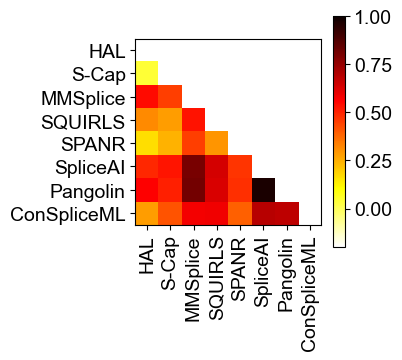

In [142]:
sp.correlation_heat_map( pear_abs,
                         color = 'hot_r',
                         hmin = -.2,
                         hmax = 1,
                         ytick_labels = [ col.split( '_' )[ 0 ] for col in pred_cols ],
                          xtick_labels = [ col.split( '_' )[ 0 ] for col in pred_cols ],
                          savefile = '../plots/predict_heat_map.pdf' 
                        )

In [143]:
pear_abs.min().min()

0.042166257436138305

In [144]:
pear_abs.median().median()

0.5796771410155099

In [145]:
pear_abs.max().max()

0.9685819239526038

In [146]:
pear_abs

,HAL_chgPER_abs,S-Cap_sens_min_r,MMSplice_chgPERlogit_abs,SQUIRLS_score_not,SPANR_chgZPER_abs,SpliceAI_DS_maxm,Pangolin_max_abs,ConSpliceML
HAL_chgPER_abs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
S-Cap_sens_min_r,0.042166,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MMSplice_chgPERlogit_abs,0.543126,0.451299,NaN,NaN,NaN,NaN,NaN,NaN
SQUIRLS_score_not,0.314411,0.281922,0.530094,NaN,NaN,NaN,NaN,NaN
SPANR_chgZPER_abs,0.161777,0.244099,0.450753,0.294973,NaN,NaN,NaN,NaN
SpliceAI_DS_maxm,0.489134,0.522666,0.799886,0.636794,0.469248,NaN,NaN,NaN
Pangolin_max_abs,0.560795,0.506109,0.810355,0.625006,0.479228,0.968582,NaN,NaN
ConSpliceML,0.279561,0.411666,0.579677,0.584041,0.390495,0.688047,0.68078,NaN


In [147]:
pear_abs_500k, spear_abs_500k = get_pairwise_corr( data_dict[ 'Transcriptome' ],
                                                   pred_cols )

In [148]:
pear_abs_500k.min().min()

-0.06809652218236625

In [149]:
pear_abs_500k.median().median()

0.6031073815257921

In [150]:
pear_abs_500k.max().max()

0.9330877648217875

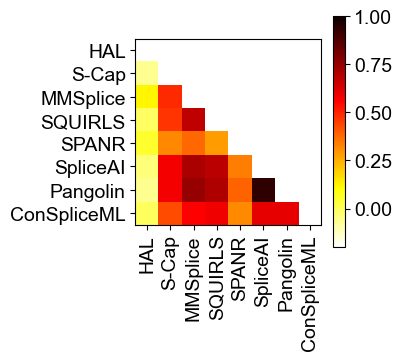

In [151]:
sp.correlation_heat_map( pear_abs_500k,
                          color = 'hot_r',
                         hmin = -.2,
                         hmax = 1,
                         ytick_labels = [ col.split( '_' )[ 0 ] for col in pred_cols ],
                          xtick_labels = [ col.split( '_' )[ 0 ] for col in pred_cols ],
                          savefile = '../plots/predict_heat_map_500k.pdf' 
                        )

In [152]:
corr_ex_df = pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].exon ][ pred_cols + pred_cols_raw ].copy()
                       for name in data_dict if name != 'Transcriptome' ],
                     ignore_index = True )

In [153]:
pear_abs_ex, spear_abs_ex = get_pairwise_corr( corr_ex_df,
                                               pred_cols )

In [154]:
pear_abs_ex.median().median()

0.4254007633100589

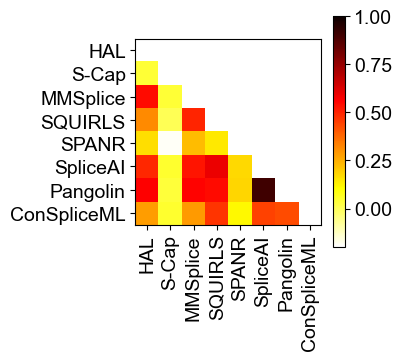

In [155]:
sp.correlation_heat_map( pear_abs_ex,
                          color = 'hot_r',
                         hmin = -.2,
                         hmax = 1,
                         ytick_labels = [ col.split( '_' )[ 0 ] for col in pred_cols ],
                          xtick_labels = [ col.split( '_' )[ 0 ] for col in pred_cols ],
                          savefile = '../plots/predict_heat_map_ex.pdf' 
                        )

In [156]:
pear_abs_500k_ex, spear_abs_500k_ex = get_pairwise_corr( data_dict[ 'Transcriptome' ].loc[ data_dict[ 'Transcriptome' ].exon ],
                                                         pred_cols )

In [157]:
pear_abs_500k_ex.median().median()

0.38512015571127656

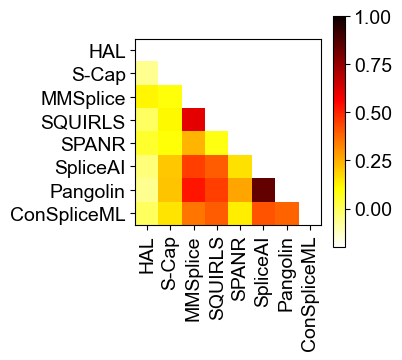

In [158]:
sp.correlation_heat_map( pear_abs_500k_ex,
                          color = 'hot_r',
                         hmin = -.2,
                         hmax = 1,
                         ytick_labels = [ col.split( '_' )[ 0 ] for col in pred_cols ],
                          xtick_labels = [ col.split( '_' )[ 0 ] for col in pred_cols ],
                          savefile = '../plots/predict_heat_map_500k_ex.pdf' 
                        )

In [159]:
def scatter_truth_pred( datasets,
                        measured_col,
                        pred_cols,
                        sdv_col,
                        xlim_l,
                        cmap,
                        back_data,
                        figsize = ( 15, 20 ),
                        sharex = 'row',
                        sharey = 'col',
                        ylim_l = None,
                        savefile = False,
                        **kwargs ):
    
    data = { name: df.copy() for name, df in datasets.items() }
    
    back_df = back_data.copy()

    fig, ax = plt.subplots( len( pred_cols ), 
                            len( data.keys() ),
                            figsize = figsize,
                            sharex = sharex,
                            sharey = sharey )
    
    mid = int( len( data ) / 2 )
    
    for j, name_data in enumerate( data.items() ):
        
        name, df_j = name_data
        
        ax[ 0 ][ j ].set_title( name )
        
        for i, col in enumerate( pred_cols ):
            
            bcol_df = back_df.loc[ back_df[ col ].notnull() ].copy()
            
            bcol_n = len( bcol_df )
            
            colors = [ 'gray' if not c else cmap( i ) for c in df_j[ sdv_col ] ]
            
            ax[ i ][ j ].scatter( df_j[ col ],
                                  df_j[ measured_col ],
                                  c = colors,
                                  **kwargs )
            
            ax[ i ][ 0 ].set_ylabel( measured_col,
                                     fontsize = 16 )
            
            ax[ i ][ j ].set_xlim( xlim_l[ i ] )
            
            if ylim_l:
            
                ax[ i ][ j ].set_ylim( ylim_l[ j ] )
            
            ax[ i ][ j ].set_xlabel( col.split( '_' )[ 0 ],
                                     fontsize = 16 )
            
            ax[ i ] [ j ].tick_params( axis = 'both', which = 'major', labelsize = 12 )
            
    plt.tight_layout()
    
    if savefile:
        plt.savefig( savefile,
                     dpi = 300,
                     #bbox_inches = 'tight'
                   )

    plt.show()

In [160]:
ylim

[(-1, 91),
 (-0.1, 1.1),
 (-0.1, 7.2),
 (-0.1, 1.1),
 (-0.1, 5.1),
 (-0.1, 1.1),
 (-0.1, 1.1),
 (-0.1, 1.1)]

In [161]:
ylim_scatter = [ ( 0, 90 ), ( 0, 1 ), ( 0, 5 ), ( 0, 1 ), ( 0, 5 ), ( 0, 1 ), ( 0, 1 ), ( 0, 1 ) ]

In [162]:
{ name: ( data_dict[ name ].measured_abs.min(), data_dict[ name ].measured_abs.max() ) for name in data_dict if name != 'Transcriptome' and name != 'MLH1' }

{'BRCA1': (-1.00686242236853, 5.65079506276544),
 'FAS': (0.0, 6.715),
 'POU1F1': (0.2263844804648838, 376.0536512970425),
 'RON': (1.0411138080001323, 149.40884841490987),
 'WT1': (0.2698708950365868, 251.4665100867536)}

In [163]:
xlim = [ ( 0, 4 ), ( 0, 7 ), ( 0, 400 ), ( 0, 150 ), ( 0, 150  ) ]

/Users/kitzmanj/miniconda3/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1062: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.asanyarray(x)


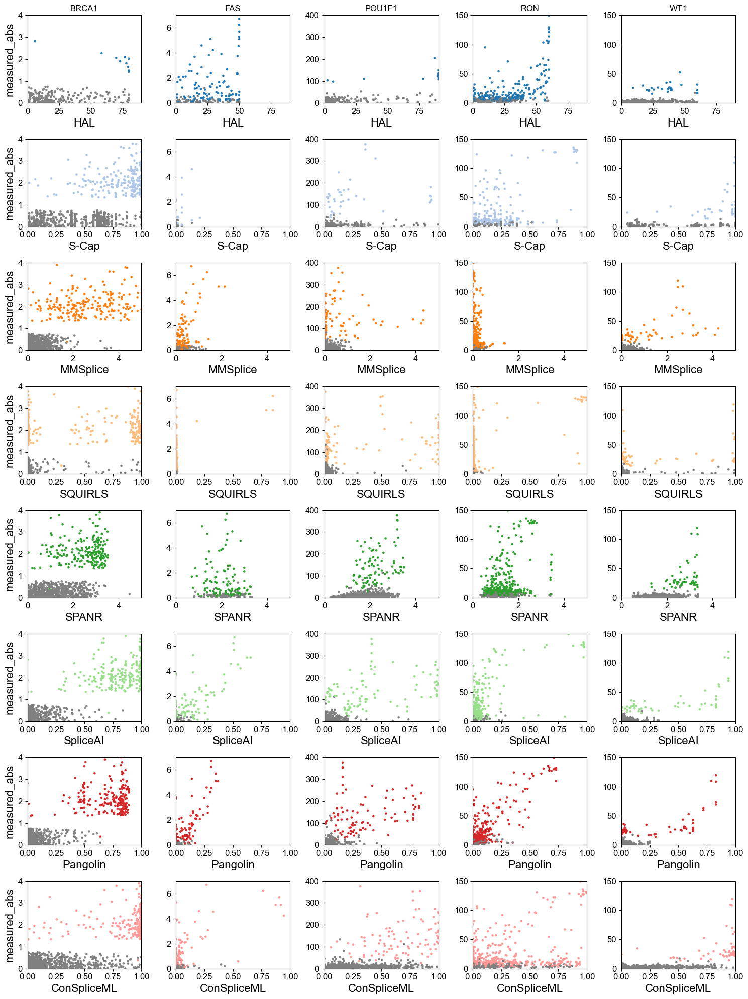

In [164]:
scatter_truth_pred( { name: data_dict[ name ] for name in data_dict.keys() if name != 'MLH1' and name != 'Transcriptome' },
                    'measured_abs',
                    pred_cols,
                    'sdv_fc2',
                    ylim_scatter,
                    plt.get_cmap( 'tab20' ),
                    back_df,
                    sharex = 'row',
                    sharey = 'col',
                    ylim_l = xlim,
                    savefile = '../plots/tool_by_data_scatg.pdf',
                    s = 5 )

In [165]:
def corr_tool_and_measured_fixed( datasets,
                                  measured_col,
                                  pred_cols ):
    
    abs_tools = [ 'S-Cap_sens_min_r_corr', 'SQUIRLS_score_not_corr', 'SpliceAI_DS_maxm_corr', 'ConSpliceML_corr' ]
        
    pearson_out = np.empty( ( len( datasets ), len( pred_cols ) ) )
    pearson_best = np.empty( ( len( datasets ), len( pred_cols ) ),
                             dtype = object )
    spearman_out = np.empty( ( len( datasets ), len( pred_cols ) ) )
    spearman_best = np.empty( ( len( datasets ), len( pred_cols ) ),
                             dtype = object )
    
    for i, name in enumerate( datasets ):
        
        for j, tool in enumerate( pred_cols ):
            
            tool_df = datasets[ name ].loc[ datasets[ name ][ tool ].notnull() ].copy()
            
            if name == 'FAS' and tool in abs_tools:
                
                pearson_out[ i, j ] = ss.pearsonr( tool_df[ measured_col ].abs(), tool_df[ tool ] )[ 0 ]
            
                spearman_out[ i, j ] = ss.spearmanr( tool_df[ measured_col ].abs(), tool_df[ tool ] )[ 0 ]
            
            else:    
            
                pearson_out[ i, j ] = ss.pearsonr( tool_df[ measured_col ], tool_df[ tool ] )[ 0 ]
            
                spearman_out[ i, j ] = ss.spearmanr( tool_df[ measured_col ], tool_df[ tool ] )[ 0 ]
            
    pear = pd.DataFrame( pearson_out, columns = pred_cols, index = list( datasets.keys() ) )
    spear = pd.DataFrame( spearman_out, columns = pred_cols, index = list( datasets.keys() ) )
    
    return ( pear, spear )

In [166]:
pear,spear = corr_tool_and_measured_fixed( { name: data for name, data in data_dict.items()
                                             if name != 'Transcriptome' and name != 'MLH1' },
                                           'measured',
                                           pred_cols_corr )

In [167]:
pear.stack().median()

0.5262792895584061

In [168]:
pear.min().min()

-0.055788662190698904

In [169]:
pear.max().max()

0.8466426586580086

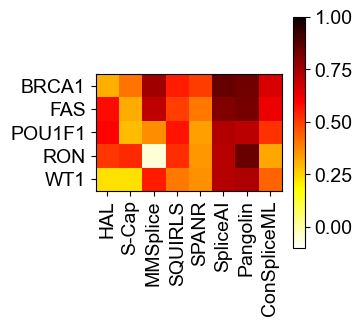

In [170]:
sp.correlation_heat_map( pear,
                          color = 'hot_r',
                         hmin = -.1,
                         hmax = 1,
                         ytick_labels = [ name for name in data_dict if name != 'Transcriptome' and name != 'MLH1' ],
                         xtick_labels = [ col.split( '_' )[ 0 ] for col in pred_cols ],
                         savefile = '../plots/tool_measured_corr.pdf' 
                        )

In [171]:
pou1f1_sat.loc[ ( pou1f1_sat.sdv_fc2.notnull() ) & ( pou1f1_sat.sdv_fc2 ) ].pos.min()

1098

In [172]:
pou1f1_sat.loc[ ( pou1f1_sat.sdv_fc2.notnull() ) & ( pou1f1_sat.sdv_fc2 ) ].pos.max()

1277

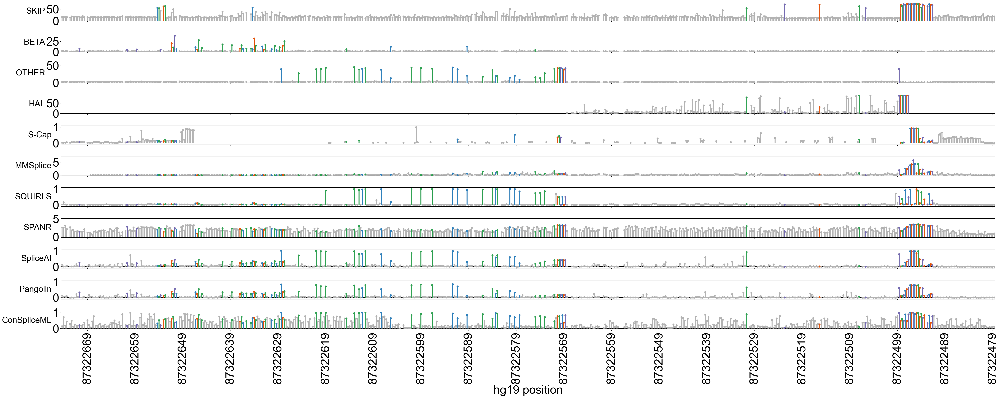

In [173]:
sp.sat_lollipop_subplots_wrapper( pou1f1_sat.rename( columns = { 'ref': 'ref_c',
                                                                  'alt': 'alt_c',
                                                                  'ref_c': 'ref',
                                                                  'alt_c': 'alt' } ),
                                [ 'wmean_SKIP', 'wmean_BETA', 'wmean_OTHER' ] + pred_cols,
                                'hg19_pos',
                                grays,
                                zoom = ( 1095, 1290 ),
                                fig_size = ( 50, 20 ),
                                linewidth = 3.5,
                                lollipop_size = 6,
                                share_y = False,
                                legend = False,
                                darken_bars = [ ( 'SKIP_sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ),
                                                  ( 'BETA_sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ),
                                                  ( 'OTHER_sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ] \
                                                + [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ]*len( ylim ),
                                y_ax_lim = [ ( -.1, 80 ), ( -.1, 45 ), ( -.1, 55 ) ] + ylim,
                                y_ax_title = [ 'SKIP', 'BETA', 'OTHER' ] + ylab,
                                y_label_fontsize = 30,
                                y_label_rotation = 0,
                                x_ax_title = 'hg19 position',
                                hlines = [ ( 0, 'black', 'solid' ) for i in range( len( pred_cols_raw ) + 3 ) ],
                                tick_spacing = 10,
                                savefile = '../plots/pou1f1_tracks_zoom.pdf'
                           )

In [344]:
def roc_curve_subplot( datasets,
                       truth_col,
                       pred_cols,
                       cmap,
                       figsize = ( 15, 15 ),
                       sharex = True,
                       sharey = True,
                       savefile = None,
                       print_auc = True,
                       **kwargs ):

    data = { name: datasets[ name ].loc[ datasets[ name ][ truth_col ].notnull() ].copy() for name in datasets.keys() }

    for name in data.keys():

        if len( data[ name ] ) != len( datasets[ name ] ):

            missing = len( datasets[ name ] ) - len( data[ name ] )

            print( '%i missing values in %s in dataset %s' % ( missing, truth_col, name ) )

    sub_size = int( np.ceil( np.sqrt( len( data ) ) ) )

    fig, ax = plt.subplots( sub_size,
                            sub_size,
                            figsize = figsize,
                            sharex = sharex,
                            sharey = sharey )

    youden_j = np.empty( ( len( pred_cols ), len( data.keys() ) ) )
    youden_j[:] = np.nan

    for d, name in enumerate( data.keys() ):

        i,j = ( d // sub_size, d % sub_size )

        ax[ i ][ j ].set_title( name,
                                 fontsize = 20 )

        df = data[ name ]

        if len( df[ truth_col ].unique() ) == 1:

            print( 'Unable to plot dataset %s' % ( name ) )
            ax[ i ][ j ].set_visible( False )
            continue

        if df[ truth_col ].sum() < 2 or ( ~( df[ truth_col ] ) ).sum() < 2:

            print( 'Unable to dataset %s' % ( name ) )
            ax[ i ][ j ].set_visible( False )
            continue

        for k, col in enumerate( pred_cols ):

            col_df = df.dropna( subset = [ col ] ).copy()

            if len( df ) != len( col_df ):

                missing = len( df ) - len( col_df )
                print( '%i missing values in %s column for dataset %s.' \
                           % ( missing, col, name, ) )

            if len( col_df ) == 0:

                print( 'No non-missing values in %s column for dataset %s - skipping...' \
                           % ( col, name, ) )
                continue

            if col_df[ truth_col ].sum() < 2 or ( ~( col_df[ truth_col ] ) ).sum() < 2:

                print( 'Only one event in %s column for dataset %s - skipping...' \
                           % ( col, name, ) )
                continue

            fpr, tpr, thresh = roc_curve( col_df[ truth_col ], col_df[ col ] )
            auc_val = auc( fpr, tpr )

            youden_j[ k ][ d ] = thresh[ np.argmax( tpr - fpr ) ]

            if print_auc:
                #label = col.split( '_' )[ 0 ] + " AUC = %0.3f" % ( auc_val )
                label = col + " AUC = %0.3f" % ( auc_val )
            else:
                #label = col.split( '_' )[ 0 ]
                label = col

            ax[ i ][ j ].plot( 100*fpr,
                               100*tpr,
                               color = cmap( k ),
                               label = label,
                               **kwargs )

        ax[ i ][ j ].step( np.arange( 0, 100 ),
                            np.arange( 0, 100 ),
                            color = 'black',
                            ls = 'dashed' )

        ax[ sub_size - 1 ][ j ].set_xlabel( 'False Positive Rate\n(%)', fontsize = 16 )

        ax[ i ][ j ].set_ylim( ( 0, 100 ) )
        ax[ i ][ j ].set_xlim( ( 0, 100 ) )
        
        ax[ i ][ 0 ].set_ylabel( 'True Positive Rate\n(%)', fontsize = 16 )

        ax[ i ][ j ].legend()

    if i < sub_size:

        for k in range( j + 1, sub_size ):

            ax[ i ][ k ].set_visible( False )
            ax[ i - 1 ][ k ].set_xlabel( 'False Positive Rate\n(%)', fontsize = 16 )
            ax[ i - 1 ][ k ].tick_params( labelbottom = True )

        for k in range( i + 1, sub_size ):

            for l in range( sub_size ):

                ax[ k ][ l ].set_visible( False )

                if l <= j:

                    ax[ k - 1 ][ l ].set_xlabel( 'False Positive Rate\n(%)', fontsize = 16 )
                    ax[ k - 1 ][ l ].tick_params( labelbottom = True )

    elif j < sub_size:

        for k in range( j + 1, sub_size ):

            ax[ i ][ k ].set_visible( False )
            ax[ i - 1 ][ k ].set_xlabel( 'False Positive Rate\n(%)', fontsize = 16 )
            ax[ i - 1 ][ k ].tick_params( labelbottom = True )

    plt.tight_layout()

    if savefile:
        plt.savefig( savefile,
                     dpi = 300,
                     #bbox_inches = 'tight'
                   )

    plt.show()

    youden_df = pd.DataFrame( youden_j,
                              index = [ col.split( '_' )[ 0 ] for col in pred_cols ],
                              columns = list( data.keys() ),
                            )

    return youden_df

923 missing values in HAL_chgPER_abs column for dataset BRCA1.
39 missing values in S-Cap_sens_min_r column for dataset BRCA1.
140 missing values in S-Cap_sens_min_r column for dataset FAS.
1 missing values in SQUIRLS_score_not column for dataset FAS.
126 missing values in HAL_chgPER_abs column for dataset MLH1.
158 missing values in S-Cap_sens_min_r column for dataset MLH1.
101 missing values in SQUIRLS_score_not column for dataset MLH1.
3 missing values in SPANR_chgZPER_abs column for dataset MLH1.
742 missing values in HAL_chgPER_abs column for dataset POU1F1.
570 missing values in S-Cap_sens_min_r column for dataset POU1F1.
162 missing values in MMSplice_chgPERlogit_abs column for dataset POU1F1.
1 missing values in SQUIRLS_score_not column for dataset POU1F1.
220 missing values in HAL_chgPER_abs column for dataset RON.
293 missing values in S-Cap_sens_min_r column for dataset RON.
231 missing values in HAL_chgPER_abs column for dataset WT1.
206 missing values in S-Cap_sens_min_r c

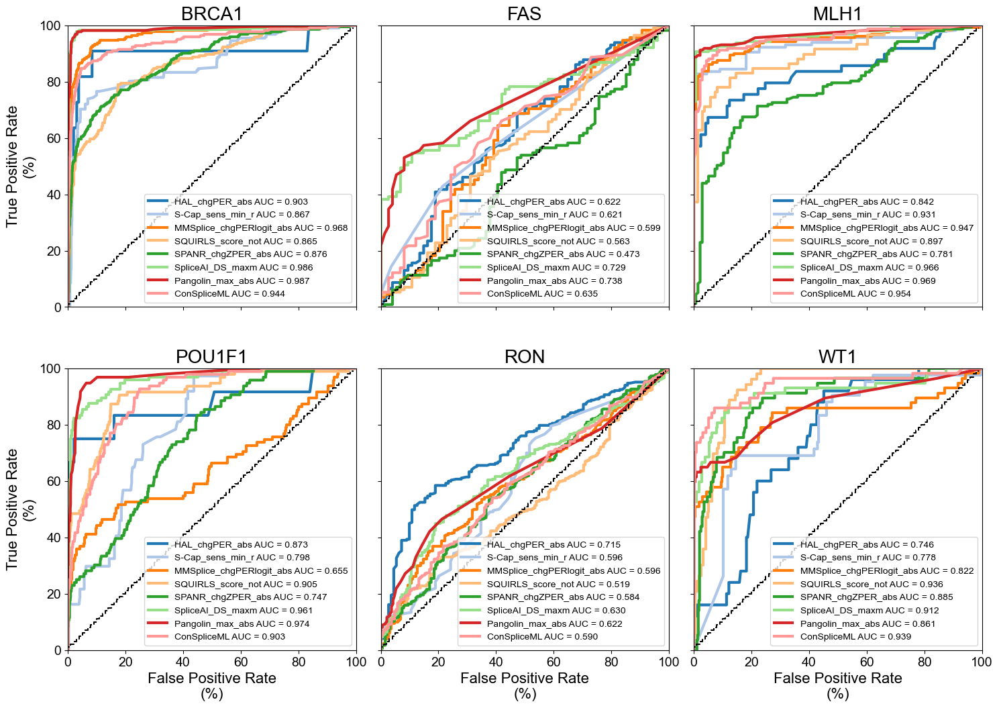

In [348]:
youden_all = roc_curve_subplot( { name: df for name,df in data_dict.items() if name != 'Transcriptome' },
                                'sdv_fc2',
                               pred_cols,
                               plt.get_cmap( 'tab20' ), 
                               linewidth = 3,
                               savefile = '../plots/ROC_youdenj_nocat.pdf' 
                             )

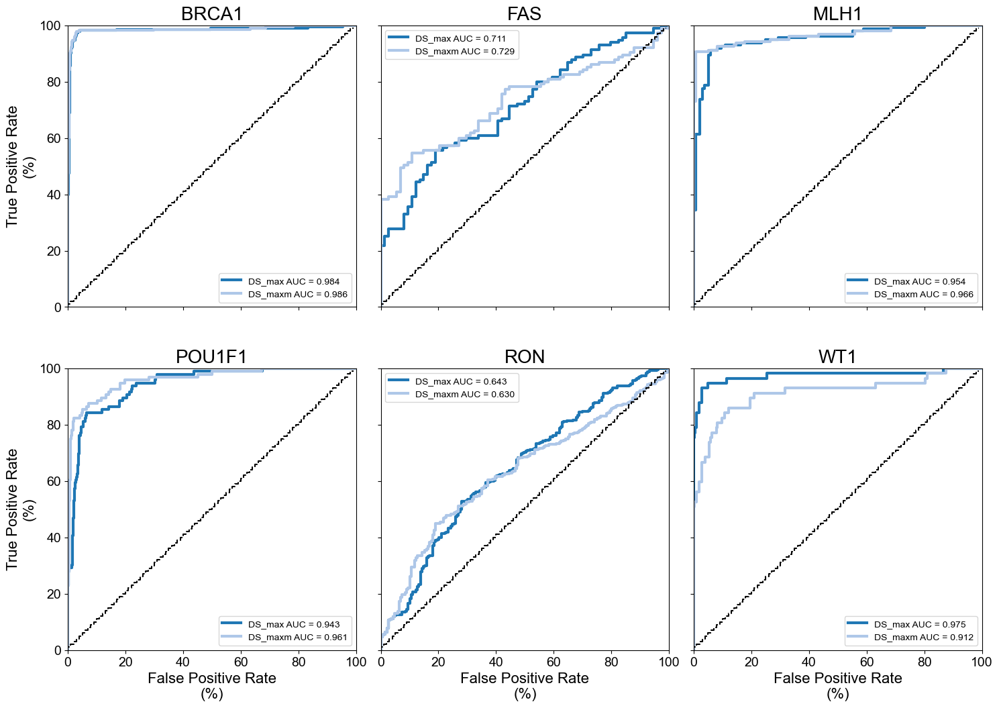

In [356]:
youden_all = roc_curve_subplot( { name: df for name,df in data_dict.items() if name != 'Transcriptome' },
                                'sdv_fc2',
                               [ 'DS_max','DS_maxm'],
                               plt.get_cmap( 'tab20' ), 
                               linewidth = 3,
                               savefile = '../plots/ROC_youdenj_masking.pdf' 
                             )

In [176]:
pou1f1_sat.loc[ ( pou1f1_sat.canon.notnull() ) & ( pou1f1_sat.canon ) ]

,hg19_pos,alt,ref,gene_name,chrom,gene_id,transcript_id_beta,transcript_id_alpha,varlist,gdna_pos_hg19,...,pangolin_per,conspliceml_per,HAL_chgPER_abs_corr,S-Cap_sens_min_r_corr,MMSplice_chgPERlogit_abs_corr,SQUIRLS_score_not_corr,SPANR_chgZPER_abs_corr,SpliceAI_DS_maxm_corr,Pangolin_max_abs_corr,ConSpliceML_corr
294,87322495,C,A,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322495:A:C,87322495.0,...,98.7275,99.360920,NaN,0.930796,4.337270,0.894211,3.496,0.983387,0.78,0.9950
295,87322495,G,A,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322495:A:G,87322495.0,...,98.4741,98.612419,NaN,0.922145,0.795416,0.995001,3.289,0.854624,0.73,0.9650
296,87322495,T,A,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322495:A:T,87322495.0,...,98.7275,98.239167,NaN,0.930796,4.350899,0.088564,3.453,0.983353,0.78,0.9330
297,87322496,A,C,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322496:C:A,87322496.0,...,98.7275,99.547704,NaN,0.928201,5.760628,NaN,3.449,0.983388,0.78,0.9980
298,87322496,G,C,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322496:C:G,87322496.0,...,98.7275,99.035704,NaN,0.936851,4.251443,0.017671,3.352,0.983392,0.78,0.9860
299,87322496,T,C,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322496:C:T,87322496.0,...,98.7275,99.852949,NaN,0.924740,3.891063,0.971426,3.376,0.983039,0.78,1.0000
516,87322569,A,C,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322569:C:A,87322569.0,...,94.6644,97.377145,NaN,NaN,0.783600,0.512088,3.200,0.414465,0.16,0.8380
517,87322569,G,C,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322569:C:G,87322569.0,...,94.6644,88.339107,NaN,NaN,0.444827,0.008177,3.130,0.412833,0.16,0.3760
518,87322569,T,C,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322569:C:T,87322569.0,...,94.6644,97.321541,NaN,NaN,0.461398,0.509372,3.240,0.413783,0.16,0.8330
519,87322570,A,T,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322570:T:A,87322570.0,...,94.6644,85.751675,NaN,0.359477,0.598292,0.007751,3.189,0.414496,0.16,0.3150


In [177]:
pou1f1_sat.loc[ ( pou1f1_sat.BETA_sdv_fc2.notnull() ) & ( pou1f1_sat.BETA_sdv_fc2 ) ]

,hg19_pos,alt,ref,gene_name,chrom,gene_id,transcript_id_beta,transcript_id_alpha,varlist,gdna_pos_hg19,...,pangolin_per,conspliceml_per,HAL_chgPER_abs_corr,S-Cap_sens_min_r_corr,MMSplice_chgPERlogit_abs_corr,SQUIRLS_score_not_corr,SPANR_chgZPER_abs_corr,SpliceAI_DS_maxm_corr,Pangolin_max_abs_corr,ConSpliceML_corr
535,87322575,C,T,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322575:T:C,87322575.0,...,91.8937,96.304374,NaN,NaN,1.346900,0.754176,1.416,0.174925,0.09,0.738000
578,87322589,T,A,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322589:A:T,87322589.0,...,93.4248,97.565295,NaN,NaN,0.679252,0.948576,1.715,0.289973,0.12,0.859000
626,87322605,T,A,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322605:A:T,87322605.0,...,94.4130,95.017911,NaN,NaN,0.234386,0.174614,1.714,0.367674,0.15,0.646000
654,87322615,C,A,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322615:A:C,87322615.0,...,96.0148,94.828289,NaN,0.080645,0.243759,0.017590,2.190,0.220620,0.24,0.634000
693,87322628,C,A,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322628:A:C,87322628.0,...,97.2166,93.696130,NaN,NaN,0.076582,0.024307,2.012,0.362518,0.40,0.570000
694,87322628,G,A,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322628:A:G,87322628.0,...,96.9970,95.715223,NaN,NaN,0.060685,0.032975,1.881,0.296255,0.36,0.692000
696,87322629,C,A,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322629:A:C,87322629.0,...,96.3303,94.127299,NaN,NaN,0.029497,0.018399,1.872,0.314319,0.27,0.592000
698,87322629,T,A,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322629:A:T,87322629.0,...,95.1055,85.215921,NaN,NaN,0.027354,0.019635,1.893,0.193412,0.18,0.304000
699,87322630,C,A,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322630:A:C,87322630.0,...,96.7391,93.764558,NaN,NaN,0.022001,0.018419,2.142,0.338331,0.32,0.573000
701,87322630,T,A,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322630:A:T,87322630.0,...,94.6644,92.605175,NaN,NaN,0.021308,0.018986,2.252,0.223027,0.16,0.519000


In [178]:
pou1f1_sat.loc[ ( pou1f1_sat.OTHER_sdv_fc2.notnull() ) & ( pou1f1_sat.OTHER_sdv_fc2 ) ]

,hg19_pos,alt,ref,gene_name,chrom,gene_id,transcript_id_beta,transcript_id_alpha,varlist,gdna_pos_hg19,...,pangolin_per,conspliceml_per,HAL_chgPER_abs_corr,S-Cap_sens_min_r_corr,MMSplice_chgPERlogit_abs_corr,SQUIRLS_score_not_corr,SPANR_chgZPER_abs_corr,SpliceAI_DS_maxm_corr,Pangolin_max_abs_corr,ConSpliceML_corr
306,87322499,A,G,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322499:G:A,87322499.0,...,97.9850,98.746332,86.9,NaN,1.939883,0.527728,2.591,0.790877,0.60,0.973
516,87322569,A,C,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322569:C:A,87322569.0,...,94.6644,97.377145,NaN,NaN,0.783600,0.512088,3.200,0.414465,0.16,0.838
517,87322569,G,C,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322569:C:G,87322569.0,...,94.6644,88.339107,NaN,NaN,0.444827,0.008177,3.130,0.412833,0.16,0.376
518,87322569,T,C,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322569:C:T,87322569.0,...,94.6644,97.321541,NaN,NaN,0.461398,0.509372,3.240,0.413783,0.16,0.833
519,87322570,A,T,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322570:T:A,87322570.0,...,94.6644,85.751675,NaN,0.359477,0.598292,0.007751,3.189,0.414496,0.16,0.315
520,87322570,C,T,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322570:T:C,87322570.0,...,94.6644,96.775275,NaN,0.448802,0.618061,0.492698,3.197,0.414052,0.16,0.778
521,87322570,G,T,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322570:T:G,87322570.0,...,94.6644,96.750994,NaN,0.359477,0.304272,0.492733,3.213,0.414706,0.16,0.776
523,87322571,C,G,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322571:G:C,87322571.0,...,95.2871,91.071594,NaN,NaN,1.668713,0.008403,3.075,0.405792,0.19,0.460
529,87322573,C,G,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322573:G:C,87322573.0,...,92.9996,96.093625,NaN,NaN,0.651870,0.859025,2.513,0.335929,0.11,0.721
532,87322574,C,T,POU1F1,3,ENSG00000064835,ENST00000344265,ENST00000350375,pou1f1:87322574:T:C,87322574.0,...,92.9996,96.871032,NaN,NaN,0.350639,0.763105,1.608,0.224474,0.11,0.787


In [179]:
pou1f1_regions = { 'BETA Acceptor': ( 1095, 1125 ),
                   'BETA ESS': ( 1126, 1142 ),
                   'Alternate SS': ( 1143, 1203 ),
                   'ALPHA exon': ( 1204, 1269 ),
                   'Donor': ( 1270, 1290 )
                   }

In [180]:
pou1f1_thresh = { tool: youden_all.loc[ tool ][ 'POU1F1' ] for tool in youden_all.index }

In [181]:
pou1f1_thresh

{'HAL': 78.1,
 'S-Cap': 0.03233256351,
 'MMSplice': 0.4105511473790229,
 'SQUIRLS': 0.0159113360665014,
 'SPANR': 1.707,
 'SpliceAI': 0.083894670009613,
 'Pangolin': 0.08,
 'ConSpliceML': 0.304}

In [182]:
pou1f1_right = pd.DataFrame( { region: [ ( ( ( data_dict[ 'POU1F1' ].pos >= bd[ 0 ] ) \
                                         & ( data_dict[ 'POU1F1' ].pos <= bd[ 1 ] ) \
                                         & ~( data_dict[ 'POU1F1' ].sdv_fc2 ) \
                                         & ( data_dict[ 'POU1F1' ][ tool_col ] < pou1f1_thresh[ tool_col.split( '_' )[ 0 ] ] ) ).sum() \
                                        + ( ( data_dict[ 'POU1F1' ].pos >= bd[ 0 ] ) \
                                         & ( data_dict[ 'POU1F1' ].pos <= bd[ 1 ] ) \
                                         & ( data_dict[ 'POU1F1' ].sdv_fc2 ) \
                                         & ( data_dict[ 'POU1F1' ][ tool_col ] >= pou1f1_thresh[ tool_col.split( '_' )[ 0 ] ] ) ).sum() ) \
                                        / ( ( data_dict[ 'POU1F1' ].pos >= bd[ 0 ] ) \
                                            & ( data_dict[ 'POU1F1' ].pos <= bd[ 1 ] ) \
                                            & ( data_dict[ 'POU1F1' ][ tool_col ].notnull() ) ).sum()
                                       if len( data_dict[ 'POU1F1' ].loc[ ( data_dict[ 'POU1F1' ].pos >= bd[ 0 ] ) & ( data_dict[ 'POU1F1' ].pos <= bd[ 1 ] ) & ( data_dict[ 'POU1F1' ][ tool_col ].notnull() ) ] ) > 10
                                       else np.nan
                                       for tool_col in pred_cols ]
                              for region,bd in pou1f1_regions.items() },
                            index = pred_cols )

In [183]:
pou1f1_right

,BETA Acceptor,BETA ESS,Alternate SS,ALPHA exon,Donor
HAL_chgPER_abs,NaN,NaN,NaN,0.961957,NaN
S-Cap_sens_min_r,0.354430,NaN,0.583333,0.279070,0.464286
MMSplice_chgPERlogit_abs,0.791667,0.555556,0.818713,0.858696,0.887097
SQUIRLS_score_not,0.568182,0.577778,0.818713,0.755435,0.918033
SPANR_chgZPER_abs,0.431818,0.466667,0.485380,0.315217,0.854839
SpliceAI_DS_maxm,0.806818,0.888889,0.918129,0.847826,0.903226
Pangolin_max_abs,0.806818,0.933333,0.935673,0.875000,1.000000
ConSpliceML,0.488636,0.533333,0.748538,0.663043,0.774194


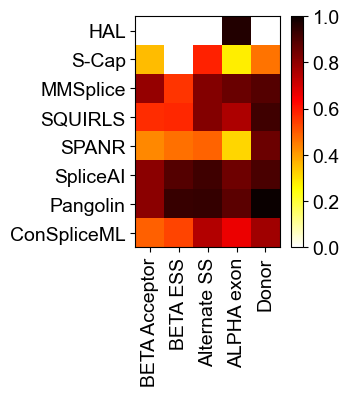

In [184]:
sp.correlation_heat_map( pou1f1_right,
                          color = 'hot_r',
                          hmin = 0,
                          hmax = 1,
                          ytick_labels = ylab,
                          xtick_labels = pou1f1_right.columns.tolist(),
                          savefile = '../plots/pou1f1_heat_corr_accur.pdf' 
                        )

In [185]:
sum( data_dict[ name ].sdv_fc2.sum()
     for name in data_dict if name != 'Transcriptome' )

1060

In [186]:
sum( len( data_dict[ name ] ) - data_dict[ name ].sdv_fc2.sum()
     for name in data_dict if name != 'Transcriptome' )

2852

In [187]:
per_sdv_var_type = pd.Series( 
                  [ 100*( pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].variant_cat == cat_translate[ cat ] ] 
                                     for name in ordered_data if name != 'Transcriptome' ] ).sdv_fc2.sum() / 
                          ( pd.concat( [ data_dict[ name ] for name in ordered_data if name != 'Transcriptome' ] ).variant_cat == cat_translate[ cat ] ).sum() )
                   for cat in cats ],
                    index = cats )

/var/folders/r6/x8gz8gvd109_mbz6dbq7d3zc0000gr/T/ipykernel_13455/2506028421.py:2: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  [ 100*( pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].variant_cat == cat_translate[ cat ] ]
/var/folders/r6/x8gz8gvd109_mbz6dbq7d3zc0000gr/T/ipykernel_13455/2506028421.py:2: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  [ 100*( pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].variant_cat == cat_translate[ cat ] ]
/var/folders/r6/x8gz8gvd109_mbz6dbq7d3zc0000gr/T/ipykernel_13455/2506028421.py:2: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  [ 100*( pd.concat( [ data_dic

/var/folders/r6/x8gz8gvd109_mbz6dbq7d3zc0000gr/T/ipykernel_13455/4089830589.py:7: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  str( int( pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].variant_cat == cat_translate[ cat ] ]
/var/folders/r6/x8gz8gvd109_mbz6dbq7d3zc0000gr/T/ipykernel_13455/4089830589.py:7: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  str( int( pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].variant_cat == cat_translate[ cat ] ]
/var/folders/r6/x8gz8gvd109_mbz6dbq7d3zc0000gr/T/ipykernel_13455/4089830589.py:7: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  str( int( pd.concat( [ da

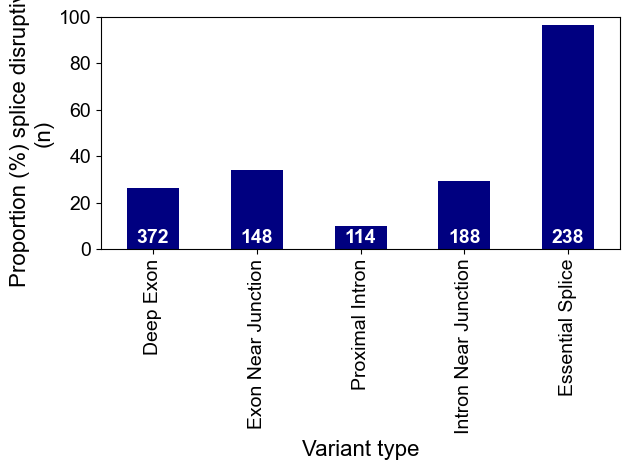

In [188]:
per_sdv_var_type.plot.bar( color = 'navy' )

for i,cat in enumerate( per_sdv_var_type.index ):

    plt.text( i, 
              2.5, 
              str( int( pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].variant_cat == cat_translate[ cat ] ] 
                                     for name in ordered_data if name != 'Transcriptome' ] ).sdv_fc2.sum() ) ),
              fontsize = 14,
              fontweight = 'heavy',
              color = 'white', 
              ha = 'center' 
        )

plt.ylim( ( 0, 100 ) )

plt.ylabel( 'Proportion (%) splice disruptive\n(n)' )

plt.xlabel( 'Variant type' )

plt.tight_layout()

plt.savefig( '../plots/prop_sdv_var_type.pdf' )

plt.show()

In [370]:
def pr_curves_nocat( datasets,
                           truth_col,
                           pred_cols,
                           cmap,
                           bootstraps = None,
                           seed = 1124,
                           figsize = ( 15, 30 ),
                           sharex = True,
                           sharey = True,
                           grid = False,
                           legend = True,
                           bbox = None,
                           add_point = False,
                           savefile = None,
                           **kwargs
                         ):

    data = { name: datasets[ name ].loc[ datasets[ name ][ truth_col ].notnull() ].copy() for name in datasets.keys() }

    for name in data.keys():

        if len( data[ name ] ) != len( datasets[ name ] ):

            missing = len( datasets[ name ] ) - len( data[ name ] )

            print( '%i missing values in %s in dataset %s' % ( missing, truth_col, name ) )

    fig, ax = plt.subplots( 1,
                            len( data.keys() ),
                            figsize = figsize,
                            sharex = sharex,
                            sharey = sharey )

    auc_d = { name + '_pr_auc': []  for name in data.keys() }
    
    if bootstraps:
        
        auc_d.update( { name + '_pr_auc_lb': [] for name in data.keys() } )
        auc_d.update( { name + '_pr_auc_ub': [] for name in data.keys() } )

    for i, name in enumerate( data.keys() ):

        ax[ 0 ].set_ylabel( name,
                            fontsize = 20 )

        df = data[ name ].copy()

        for k, col in enumerate( pred_cols ):

            col_df = df.dropna( subset = [ col ] ).copy()

            if len( df ) != len( col_df ):

                missing = len( df ) - len( col_df )
                print( '%i missing values in %s column for dataset %s.' % ( missing, col, name, ) )

            if len( col_df ) < 25:

                print( 'Less than 25 non-missing values in %s column for dataset %s - skipping...' % ( col, name, ) )
                auc_d[ name + '_pr_auc' ].append( np.nan )
                    
                if bootstraps:
                        
                    auc_d[ name + '_pr_auc_lb' ].append( np.nan )
                    auc_d[ name + '_pr_auc_ub' ].append( np.nan )
                        
                continue

            if col_df[ truth_col ].sum() < 2 or ( ~( col_df[ truth_col ] ) ).sum() < 2:

                print( 'Only one event in %s column for dataset %s - skipping...' % ( col, name, ) )
                auc_d[ name + '_pr_auc' ].append( np.nan )
                    
                if bootstraps:
                        
                    auc_d[ name + '_pr_auc_lb' ].append( np.nan )
                    auc_d[ name + '_pr_auc_ub' ].append( np.nan )
                        
                continue

            precision, recall, _ = precision_recall_curve( col_df[ truth_col ],
                                                            col_df[ col ] )
            
            auc_d[ name + '_pr_auc' ].append( auc( recall, precision ) )
    
            leg_label = col
            
            # if col.split( '_' )[ 0 ] != 'DS':
            #     leg_label = col.split( '_' )[ 0 ]
            # else:
            #     leg_label = 'SpliceAI'

            if bootstraps:

                random.seed( seed )

                idx_l = [ c for c in range( len( col_df ) ) ]

                boot_dfs = [ col_df.iloc[ random.choices( idx_l, k = len( col_df ) ) ].copy() for b in range( bootstraps ) ]

                pr_vals = [ precision_recall_curve( boot_dfs[ b ][ truth_col ],
                                                    boot_dfs[ b ][ col ] )
                            for b in range( bootstraps ) ]

                auc_vals = np.array( [ auc( pr[ 1 ], pr[ 0 ] ) for pr in pr_vals ] )

                auc_mean = np.nanmean( auc_vals )
                auc_std = np.nanstd( auc_vals )

                #sometimes with smaller datasets we get missing values
                nonmissing = np.count_nonzero( ~np.isnan( auc_vals ) )

                auc_ci = ( auc_mean - 1.96*auc_std / np.sqrt( nonmissing ), auc_mean + 1.96*auc_std / np.sqrt( nonmissing ) )
                    
                auc_d[ name + '_pr_auc_lb' ].append( auc_ci[ 0 ] )
                auc_d[ name + '_pr_auc_ub' ].append( auc_ci[ 1 ] )

            ax[ i ].plot( 100*recall,
                            100*precision,
                            color = cmap( k ),
                            label = leg_label,
                            **kwargs )

        ax[ i ].set_xlabel( 'Recall\n(%)', fontsize = 20 )
        ax[ i ].set_title( name, fontsize = 20 )
            
        ax[ i ].tick_params( axis = 'both', labelsize = 16 )

        ax[ i ].set_ylim( ( 0, 100 ) )
        ax[ i ].set_xlim( ( 0, 100 ) )
        
        if legend:

            if bbox:

                ax[ i ].legend( loc = 'center left',
                                bbox_to_anchor = bbox )

            else:

                ax[ i ].legend()
                
    ax[ 0 ].set_ylabel( 'Precision\n(%)',
                        fontsize = 22 )

    plt.tight_layout()

    if savefile:
        plt.savefig( savefile,
                     dpi = 300,
                     #bbox_inches = 'tight'
                   )

    plt.show()

    auc_vals = pd.DataFrame( auc_d,
                             index = pred_cols  #[ col.split( '_' )[ 0 ] for col in pred_cols ]
                           )

    return auc_vals

923 missing values in HAL_chgPER_abs column for dataset BRCA1.
39 missing values in S-Cap_sens_min_r column for dataset BRCA1.
140 missing values in S-Cap_sens_min_r column for dataset FAS.
1 missing values in SQUIRLS_score_not column for dataset FAS.
126 missing values in HAL_chgPER_abs column for dataset MLH1.
158 missing values in S-Cap_sens_min_r column for dataset MLH1.
101 missing values in SQUIRLS_score_not column for dataset MLH1.
3 missing values in SPANR_chgZPER_abs column for dataset MLH1.
742 missing values in HAL_chgPER_abs column for dataset POU1F1.
570 missing values in S-Cap_sens_min_r column for dataset POU1F1.
162 missing values in MMSplice_chgPERlogit_abs column for dataset POU1F1.
1 missing values in SQUIRLS_score_not column for dataset POU1F1.
220 missing values in HAL_chgPER_abs column for dataset RON.
293 missing values in S-Cap_sens_min_r column for dataset RON.
231 missing values in HAL_chgPER_abs column for dataset WT1.
206 missing values in S-Cap_sens_min_r c

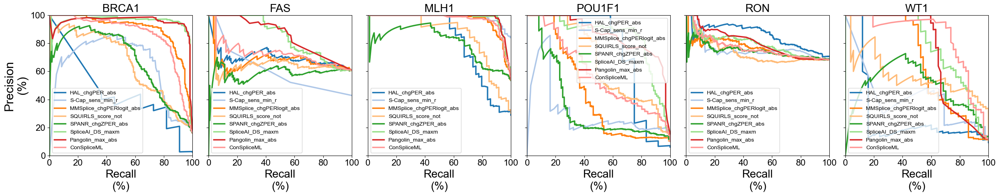

In [371]:
overall_auc = pr_curves_nocat( { name: data_dict[ name ] for name in data_dict if name != 'Transcriptome' },
                                   'sdv_fc2',
                                    pred_cols,
                                    plt.get_cmap( 'tab20' ),
                                    bootstraps = 1000,
                                    figsize = ( 25, 5 ), 
                                    lw = 2.5,
                                    savefile = '../plots/pr_curve_bydata.pdf'  )

In [372]:
overall_auc

,BRCA1_pr_auc,FAS_pr_auc,MLH1_pr_auc,POU1F1_pr_auc,RON_pr_auc,WT1_pr_auc,BRCA1_pr_auc_lb,FAS_pr_auc_lb,MLH1_pr_auc_lb,POU1F1_pr_auc_lb,RON_pr_auc_lb,WT1_pr_auc_lb,BRCA1_pr_auc_ub,FAS_pr_auc_ub,MLH1_pr_auc_ub,POU1F1_pr_auc_ub,RON_pr_auc_ub,WT1_pr_auc_ub
HAL_chgPER_abs,0.454831,0.696832,0.815820,0.747586,0.856861,0.284185,0.452914,0.696870,0.810101,0.735686,0.855390,0.283419,0.469361,0.702974,0.815997,0.750525,0.858187,0.293173
S-Cap_sens_min_r,0.635574,0.607572,0.987674,0.298793,0.764392,0.412937,0.634122,0.602113,0.987485,0.309630,0.762635,0.412028,0.638377,0.615497,0.988061,0.318922,0.766645,0.419416
MMSplice_chgPERlogit_abs,0.900424,0.674324,0.965934,0.442747,0.762856,0.666934,0.900073,0.674034,0.965689,0.441010,0.761060,0.660159,0.902187,0.680214,0.966682,0.447283,0.764046,0.667163
SQUIRLS_score_not,0.656898,0.652313,0.858304,0.664895,0.736524,0.570005,0.654621,0.651310,0.856464,0.664089,0.735116,0.564250,0.658809,0.657236,0.861064,0.669487,0.737934,0.573092
SPANR_chgZPER_abs,0.673635,0.586052,0.806012,0.346785,0.746294,0.479005,0.673625,0.588856,0.804979,0.348341,0.745032,0.478902,0.677979,0.595052,0.809380,0.354427,0.748083,0.486760
SpliceAI_DS_maxm,0.952055,0.846630,0.978410,0.844135,0.793010,0.783502,0.950766,0.843956,0.978370,0.842125,0.791224,0.777426,0.953131,0.847194,0.979136,0.846319,0.793855,0.783250
Pangolin_max_abs,0.951569,0.852601,0.981332,0.858112,0.804247,0.736488,0.950391,0.850071,0.981282,0.855476,0.802940,0.730546,0.952815,0.853357,0.981982,0.859316,0.805411,0.736929
ConSpliceML,0.862849,0.725276,0.968435,0.584544,0.767889,0.835897,0.860924,0.725381,0.967968,0.581743,0.766930,0.831176,0.863529,0.731039,0.969031,0.588017,0.769686,0.836813


In [373]:
overall_auc[ [ col for col in overall_auc if col.endswith( '_auc' ) ] ].median( axis = 1 )

HAL_chgPER_abs              0.722209
S-Cap_sens_min_r            0.621573
MMSplice_chgPERlogit_abs    0.718590
SQUIRLS_score_not           0.660896
SPANR_chgZPER_abs           0.629844
SpliceAI_DS_maxm            0.845382
Pangolin_max_abs            0.855357
ConSpliceML                 0.801893
dtype: float64

In [ ]:
# @CATHY - NEED P

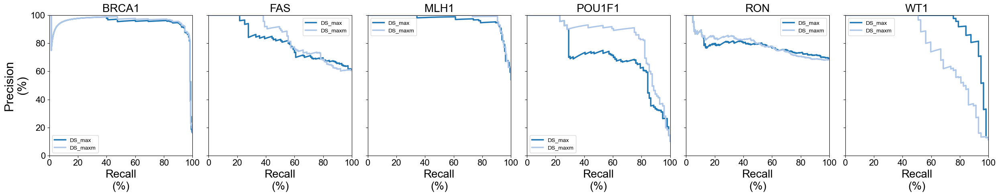

In [374]:
overall_auc_msk = pr_curves_nocat( { name: data_dict[ name ] for name in data_dict if name != 'Transcriptome' },
                                   'sdv_fc2',
                               [ 'DS_max','DS_maxm'],
                                    plt.get_cmap( 'tab20' ),
                                    bootstraps = 1000,
                                    figsize = ( 25, 5 ), 
                                    lw = 2.5,
                                    savefile = '../plots/pr_curve_bydata_nomask.pdf'  )

In [375]:
overall_auc_msk[
    [ col for col in overall_auc if col.endswith( '_auc' ) ]
]

,BRCA1_pr_auc,FAS_pr_auc,MLH1_pr_auc,POU1F1_pr_auc,RON_pr_auc,WT1_pr_auc
DS_max,0.945064,0.813848,0.964607,0.721277,0.78632,0.939149
DS_maxm,0.952055,0.846630,0.978410,0.844135,0.79301,0.783502


/var/folders/r6/x8gz8gvd109_mbz6dbq7d3zc0000gr/T/ipykernel_13455/3503481741.py:1: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  exint_auc = pr_curves_nocat( { 'exon': pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].exon ]


219 missing values in HAL_chgPER_abs column for dataset exon.
1164 missing values in S-Cap_sens_min_r column for dataset exon.
11 missing values in SQUIRLS_score_not column for dataset exon.
2023 missing values in HAL_chgPER_abs column for dataset intron.
Less than 25 non-missing values in HAL_chgPER_abs column for dataset intron - skipping...
242 missing values in S-Cap_sens_min_r column for dataset intron.
162 missing values in MMSplice_chgPERlogit_abs column for dataset intron.
96 missing values in SQUIRLS_score_not column for dataset intron.
3 missing values in SPANR_chgZPER_abs column for dataset intron.


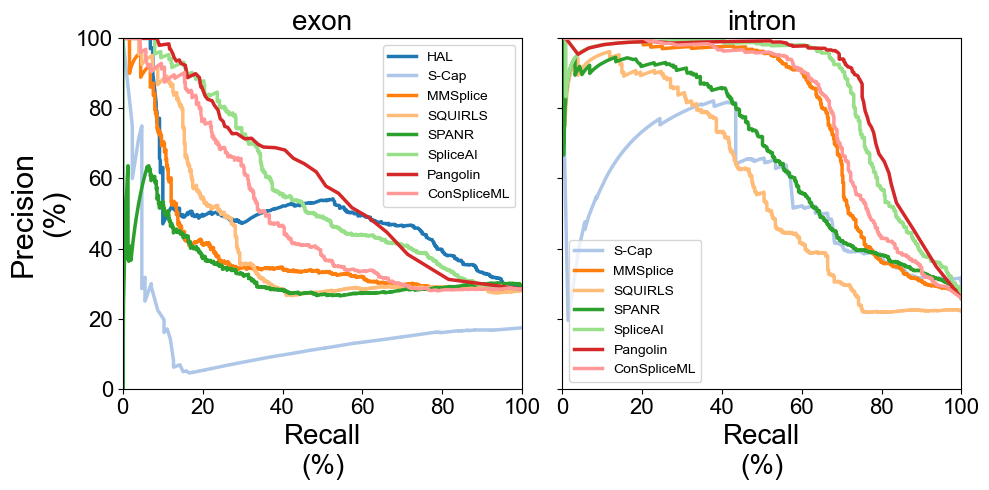

In [193]:
exint_auc = pr_curves_nocat( { 'exon': pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].exon ] 
                                                     for name in data_dict if name != 'Transcriptome' ] ),
                               'intron': pd.concat( [ data_dict[ name ].loc[ ~data_dict[ name ].exon ] 
                                                     for name in data_dict if name != 'Transcriptome' ] ) },
                                   'sdv_fc2',
                                    pred_cols,
                                    plt.get_cmap( 'tab20' ),
                                    bootstraps = 1000,
                                    figsize = ( 10, 5 ), 
                                    lw = 2.5,
                             savefile = '../plots/pr_curve_exint.pdf' )

In [194]:
exint_auc

,exon_pr_auc,intron_pr_auc,exon_pr_auc_lb,intron_pr_auc_lb,exon_pr_auc_ub,intron_pr_auc_ub
HAL,0.505789,NaN,0.505446,NaN,0.508173,NaN
S-Cap,0.159714,0.554792,0.160134,0.552795,0.163331,0.555659
MMSplice,0.392955,0.772757,0.391802,0.771747,0.394290,0.773638
SQUIRLS,0.418808,0.569047,0.418476,0.568321,0.420981,0.571307
SPANR,0.330293,0.661891,0.331109,0.659213,0.333409,0.661942
SpliceAI,0.574342,0.841213,0.574107,0.840500,0.576748,0.842351
Pangolin,0.599175,0.856837,0.598454,0.856181,0.601112,0.857868
ConSpliceML,0.497531,0.793606,0.497169,0.792381,0.499910,0.794266


In [195]:
exint_auc.loc[ [ idx for idx in exint_auc.index if idx != 'HAL' ] ][ [ col for col in exint_auc if col.endswith( '_auc' ) ] ].median()

exon_pr_auc      0.418808
intron_pr_auc    0.772757
dtype: float64

In [196]:
{ 'exon': pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].exon ] 
                                                     for name in data_dict if name != 'Transcriptome' ] ).sdv_fc2.sum() / len( pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].exon ] 
                                                                                                                                         for name in data_dict if name != 'Transcriptome' ] ) ),
 'intron': pd.concat( [ data_dict[ name ].loc[ ~data_dict[ name ].exon ] 
                                                     for name in data_dict if name != 'Transcriptome' ] ).sdv_fc2.sum() / len( pd.concat( [ data_dict[ name ].loc[ ~data_dict[ name ].exon ] 
                                                                                                                                         for name in data_dict if name != 'Transcriptome' ] ) ) }

/var/folders/r6/x8gz8gvd109_mbz6dbq7d3zc0000gr/T/ipykernel_13455/1783017000.py:1: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  { 'exon': pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].exon ]
/var/folders/r6/x8gz8gvd109_mbz6dbq7d3zc0000gr/T/ipykernel_13455/1783017000.py:2: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  for name in data_dict if name != 'Transcriptome' ] ).sdv_fc2.sum() / len( pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].exon ]


{'exon': 0.2842773954473266, 'intron': 0.25852694018783984}

/var/folders/r6/x8gz8gvd109_mbz6dbq7d3zc0000gr/T/ipykernel_13455/1892747933.py:1: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  exint_nc_auc = pr_curves_nocat( { 'exon': pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].exon ]
/var/folders/r6/x8gz8gvd109_mbz6dbq7d3zc0000gr/T/ipykernel_13455/1892747933.py:3: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  'intron': pd.concat( [ data_dict[ name ].loc[ ~( data_dict[ name ].exon ) & ( data_dict[ name ].variant_cat != 'Canonical' ) ]


219 missing values in HAL_chgPER_abs column for dataset exon.
1164 missing values in S-Cap_sens_min_r column for dataset exon.
11 missing values in SQUIRLS_score_not column for dataset exon.
1789 missing values in HAL_chgPER_abs column for dataset intron.
Less than 25 non-missing values in HAL_chgPER_abs column for dataset intron - skipping...
242 missing values in S-Cap_sens_min_r column for dataset intron.
162 missing values in MMSplice_chgPERlogit_abs column for dataset intron.
17 missing values in SQUIRLS_score_not column for dataset intron.


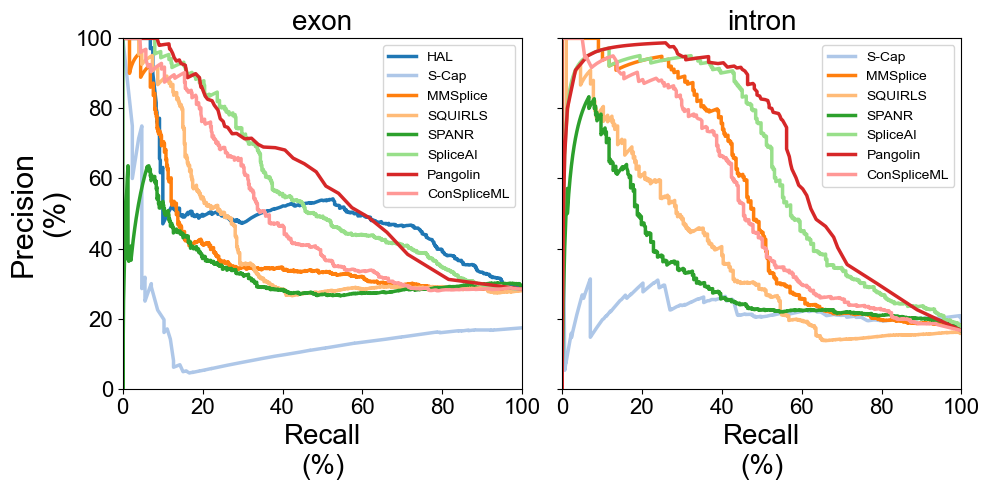

In [197]:
exint_nc_auc = pr_curves_nocat( { 'exon': pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].exon ] 
                                                     for name in data_dict if name != 'Transcriptome' ] ),
                               'intron': pd.concat( [ data_dict[ name ].loc[ ~( data_dict[ name ].exon ) & ( data_dict[ name ].variant_cat != 'Canonical' ) ] 
                                                     for name in data_dict if name != 'Transcriptome' ] ) },
                                   'sdv_fc2',
                                    pred_cols,
                                    plt.get_cmap( 'tab20' ),
                                    bootstraps = 1,
                                    figsize = ( 10, 5 ), 
                                    lw = 2.5,
                               savefile = '../plots/pr_curve_exint_nc.pdf' )

In [198]:
exint_nc_auc.loc[ [ idx for idx in exint_auc.index if idx != 'HAL' ] ][ [ col for col in exint_nc_auc if col.endswith( '_auc' ) ] ].median()

exon_pr_auc      0.418808
intron_pr_auc    0.527418
dtype: float64

In [199]:
{ 'exon': pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].exon ] 
                                                     for name in data_dict if name != 'Transcriptome' ] ).sdv_fc2.sum() / len( pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].exon ] 
                                                                                                                                         for name in data_dict if name != 'Transcriptome' ] ) ),
 'intron': pd.concat( [ data_dict[ name ].loc[ ~( data_dict[ name ].exon ) & ( data_dict[ name ].variant_cat != 'Canonical' ) ] 
                                                     for name in data_dict if name != 'Transcriptome' ] ).sdv_fc2.sum() / len( pd.concat( [ data_dict[ name ].loc[ ~( data_dict[ name ].exon ) & ( data_dict[ name ].variant_cat != 'Canonical' ) ] 
                                                                                                                                         for name in data_dict if name != 'Transcriptome' ] ) ) }

/var/folders/r6/x8gz8gvd109_mbz6dbq7d3zc0000gr/T/ipykernel_13455/2500848340.py:1: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  { 'exon': pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].exon ]
/var/folders/r6/x8gz8gvd109_mbz6dbq7d3zc0000gr/T/ipykernel_13455/2500848340.py:2: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  for name in data_dict if name != 'Transcriptome' ] ).sdv_fc2.sum() / len( pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].exon ]
/var/folders/r6/x8gz8gvd109_mbz6dbq7d3zc0000gr/T/ipykernel_13455/2500848340.py:4: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  'intron': pd.concat( [ 

{'exon': 0.2842773954473266, 'intron': 0.1660145332588038}

/var/folders/r6/x8gz8gvd109_mbz6dbq7d3zc0000gr/T/ipykernel_13455/1097503272.py:1: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  bycat_auc = pr_curves_nocat( { cat: pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].variant_cat == cat_translate[ cat ] ]
/var/folders/r6/x8gz8gvd109_mbz6dbq7d3zc0000gr/T/ipykernel_13455/1097503272.py:1: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  bycat_auc = pr_curves_nocat( { cat: pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].variant_cat == cat_translate[ cat ] ]
/var/folders/r6/x8gz8gvd109_mbz6dbq7d3zc0000gr/T/ipykernel_13455/1097503272.py:1: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cas

160 missing values in HAL_chgPER_abs column for dataset Deep Exon.
855 missing values in S-Cap_sens_min_r column for dataset Deep Exon.
29 missing values in HAL_chgPER_abs column for dataset Exon Near Junction.
283 missing values in S-Cap_sens_min_r column for dataset Exon Near Junction.
11 missing values in SQUIRLS_score_not column for dataset Exon Near Junction.
1170 missing values in HAL_chgPER_abs column for dataset Proximal Intron.
Less than 25 non-missing values in HAL_chgPER_abs column for dataset Proximal Intron - skipping...
240 missing values in S-Cap_sens_min_r column for dataset Proximal Intron.
162 missing values in MMSplice_chgPERlogit_abs column for dataset Proximal Intron.
1 missing values in SQUIRLS_score_not column for dataset Proximal Intron.
643 missing values in HAL_chgPER_abs column for dataset Intron Near Junction.
Less than 25 non-missing values in HAL_chgPER_abs column for dataset Intron Near Junction - skipping...
22 missing values in S-Cap_sens_min_r column f

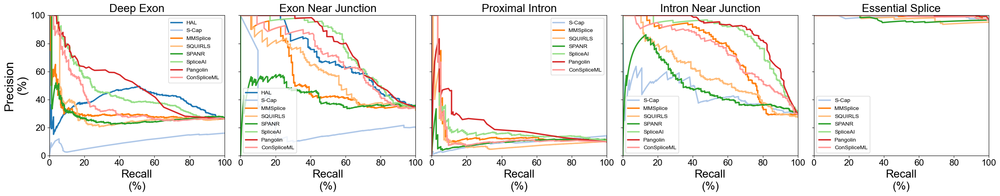

In [200]:
bycat_auc = pr_curves_nocat( { cat: pd.concat( [ data_dict[ name ].loc[ data_dict[ name ].variant_cat == cat_translate[ cat ] ] 
                                                     for name in data_dict if name != 'Transcriptome' ] )
                                   for cat in cats },
                                   'sdv_fc2',
                                    pred_cols,
                                    plt.get_cmap( 'tab20' ),
                                    bootstraps = 1000,
                                    figsize = ( 25, 5 ), 
                                    lw = 2.5,
                              savefile = '../plots/pr_curve_varcat.pdf' )

In [201]:
bycat_auc

,Deep Exon_pr_auc,Exon Near Junction_pr_auc,Proximal Intron_pr_auc,Intron Near Junction_pr_auc,Essential Splice_pr_auc,Deep Exon_pr_auc_lb,Exon Near Junction_pr_auc_lb,Proximal Intron_pr_auc_lb,Intron Near Junction_pr_auc_lb,Essential Splice_pr_auc_lb,Deep Exon_pr_auc_ub,Exon Near Junction_pr_auc_ub,Proximal Intron_pr_auc_ub,Intron Near Junction_pr_auc_ub,Essential Splice_pr_auc_ub
HAL,0.386975,0.703466,NaN,NaN,NaN,0.387545,0.702946,NaN,NaN,NaN,0.390339,0.707349,NaN,NaN,NaN
S-Cap,0.101240,0.247272,0.089938,0.439921,0.988565,0.102016,0.247168,0.090431,0.436420,0.988370,0.103456,0.255346,0.091467,0.440863,0.989344
MMSplice,0.302843,0.547705,0.162584,0.731499,0.995807,0.302816,0.544574,0.161895,0.728303,0.995659,0.305462,0.549537,0.165181,0.732051,0.996057
SQUIRLS,0.304525,0.595867,0.104468,0.590069,0.975056,0.303775,0.594525,0.105796,0.588132,0.974595,0.306179,0.599734,0.108616,0.592657,0.975950
SPANR,0.277800,0.417038,0.098179,0.490749,0.971360,0.277498,0.415577,0.098651,0.488038,0.970641,0.279880,0.420406,0.100116,0.492773,0.971971
SpliceAI,0.455320,0.775245,0.174531,0.855318,0.998903,0.453408,0.772973,0.177190,0.852832,0.998876,0.456541,0.776758,0.180860,0.855596,0.998967
Pangolin,0.502318,0.777986,0.214342,0.882351,0.996862,0.500186,0.775696,0.216473,0.880589,0.996756,0.503442,0.779290,0.221011,0.882855,0.997106
ConSpliceML,0.367959,0.698844,0.145358,0.744950,0.994480,0.367521,0.698446,0.144807,0.742962,0.994354,0.370388,0.703204,0.148051,0.746679,0.994762


In [202]:
overall_auc_td = { tool + '_pr_auc': [] for tool in overall_auc.index }
overall_auc_td.update( { tool + '_pr_auc_lb': [] for tool in overall_auc.index } )
overall_auc_td.update( { tool + '_pr_auc_ub': [] for tool in overall_auc.index } )

for name in data_dict:
    
    if name == 'Transcriptome':
        continue
        
    for tool in overall_auc.index:
        
        overall_auc_td[ tool + '_pr_auc' ].append( overall_auc.loc[ tool ][ name + '_pr_auc' ] )
        overall_auc_td[ tool + '_pr_auc_lb' ].append( overall_auc.loc[ tool ][ name + '_pr_auc_lb' ] )
        overall_auc_td[ tool + '_pr_auc_ub' ].append( overall_auc.loc[ tool ][ name + '_pr_auc_ub' ] )
        
overall_auc_t = pd.DataFrame( overall_auc_td,
                              index = [ name for name in data_dict if name != 'Transcriptome' ])

In [203]:
overall_auc_t

,HAL_pr_auc,S-Cap_pr_auc,MMSplice_pr_auc,SQUIRLS_pr_auc,SPANR_pr_auc,SpliceAI_pr_auc,Pangolin_pr_auc,ConSpliceML_pr_auc,HAL_pr_auc_lb,S-Cap_pr_auc_lb,...,Pangolin_pr_auc_lb,ConSpliceML_pr_auc_lb,HAL_pr_auc_ub,S-Cap_pr_auc_ub,MMSplice_pr_auc_ub,SQUIRLS_pr_auc_ub,SPANR_pr_auc_ub,SpliceAI_pr_auc_ub,Pangolin_pr_auc_ub,ConSpliceML_pr_auc_ub
BRCA1,0.454831,0.635574,0.900424,0.656898,0.673635,0.952055,0.951569,0.862849,0.452914,0.634122,...,0.950391,0.860924,0.469361,0.638377,0.902187,0.658809,0.677979,0.953131,0.952815,0.863529
FAS,0.696832,0.607572,0.674324,0.652313,0.586052,0.846630,0.852601,0.725276,0.696870,0.602113,...,0.850071,0.725381,0.702974,0.615497,0.680214,0.657236,0.595052,0.847194,0.853357,0.731039
MLH1,0.815820,0.987674,0.965934,0.858304,0.806012,0.978410,0.981332,0.968435,0.810101,0.987485,...,0.981282,0.967968,0.815997,0.988061,0.966682,0.861064,0.809380,0.979136,0.981982,0.969031
POU1F1,0.747586,0.298793,0.442747,0.664895,0.346785,0.844135,0.858112,0.584544,0.735686,0.309630,...,0.855476,0.581743,0.750525,0.318922,0.447283,0.669487,0.354427,0.846319,0.859316,0.588017
RON,0.856861,0.764392,0.762856,0.736524,0.746294,0.793010,0.804247,0.767889,0.855390,0.762635,...,0.802940,0.766930,0.858187,0.766645,0.764046,0.737934,0.748083,0.793855,0.805411,0.769686
WT1,0.284185,0.412937,0.666934,0.570005,0.479005,0.783502,0.736488,0.835897,0.283419,0.412028,...,0.730546,0.831176,0.293173,0.419416,0.667163,0.573092,0.486760,0.783250,0.736929,0.836813


In [204]:
bycat_auc_td = { tool + '_pr_auc': [] for tool in bycat_auc.index }
bycat_auc_td.update( { tool + '_pr_auc_lb': [] for tool in bycat_auc.index } )
bycat_auc_td.update( { tool + '_pr_auc_ub': [] for tool in bycat_auc.index } )

for cat in cats:
        
    for tool in bycat_auc.index:
        
        bycat_auc_td[ tool + '_pr_auc' ].append( bycat_auc.loc[ tool ][ cat + '_pr_auc' ] )
        bycat_auc_td[ tool + '_pr_auc_lb' ].append( bycat_auc.loc[ tool ][ cat + '_pr_auc_lb' ] )
        bycat_auc_td[ tool + '_pr_auc_ub' ].append( bycat_auc.loc[ tool ][ cat + '_pr_auc_ub' ] )
        
bycat_auc_t = pd.DataFrame( bycat_auc_td,
                              index = cats )

In [205]:
auc_t = pd.concat( [ overall_auc_t,
                     bycat_auc_t ] )

In [206]:
auc_t[ 'max_auc' ] = auc_t[ [ col for col in auc_t if col.endswith( '_auc' ) ] ].max( axis = 1 )

In [207]:
for col in [ col for col in auc_t if col.endswith( '_auc' ) ]:
    
    auc_t[ col + '_diff' ] = auc_t[ col ] - auc_t.max_auc

In [208]:
best_tools = { idx: tool.split( '_' )[ 0 ]
               for tool,idx in zip( auc_t[ [ col for col in auc_t if col.endswith( '_ub' ) ] ].idxmax( axis = 1 ).tolist(),
                                    auc_t.index )
               if str( tool ) != 'nan' }

In [209]:
best_tools

{'BRCA1': 'SpliceAI',
 'FAS': 'Pangolin',
 'MLH1': 'S-Cap',
 'POU1F1': 'Pangolin',
 'RON': 'HAL',
 'WT1': 'ConSpliceML',
 'Deep Exon': 'Pangolin',
 'Exon Near Junction': 'Pangolin',
 'Proximal Intron': 'Pangolin',
 'Intron Near Junction': 'Pangolin',
 'Essential Splice': 'SpliceAI'}

In [210]:
ties = { idx: [ tool.split( '_' )[ 0 ]
               for tool in [ col for col in auc_t if col.endswith( '_ub' ) ] 
               if float( auc_t.loc[ idx ][ tool ] ) >= float( auc_t.loc[ idx ][ best_tools[ idx ] + '_pr_auc_lb' ] )
               and tool.split( '_' )[ 0 ] != best_tools[ idx ] ]
         for idx in auc_t.index }

In [211]:
ties

{'BRCA1': ['Pangolin'],
 'FAS': [],
 'MLH1': [],
 'POU1F1': [],
 'RON': [],
 'WT1': [],
 'Deep Exon': [],
 'Exon Near Junction': ['SpliceAI'],
 'Proximal Intron': [],
 'Intron Near Junction': [],
 'Essential Splice': []}

In [212]:
best_counts = { tool: list( best_tools.values() ).count( tool ) + [ tie_tool 
                                                                    for tie in list( ties.values() )
                                                                    for tie_tool in tie ].count( tool ) 
                for tool in [ col.split( '_' )[ 0 ] for col in auc_t if '_diff' in col and not 'max' in col ] }

In [213]:
best_counts

{'HAL': 1,
 'S-Cap': 1,
 'MMSplice': 0,
 'SQUIRLS': 0,
 'SPANR': 0,
 'SpliceAI': 3,
 'Pangolin': 7,
 'ConSpliceML': 1}

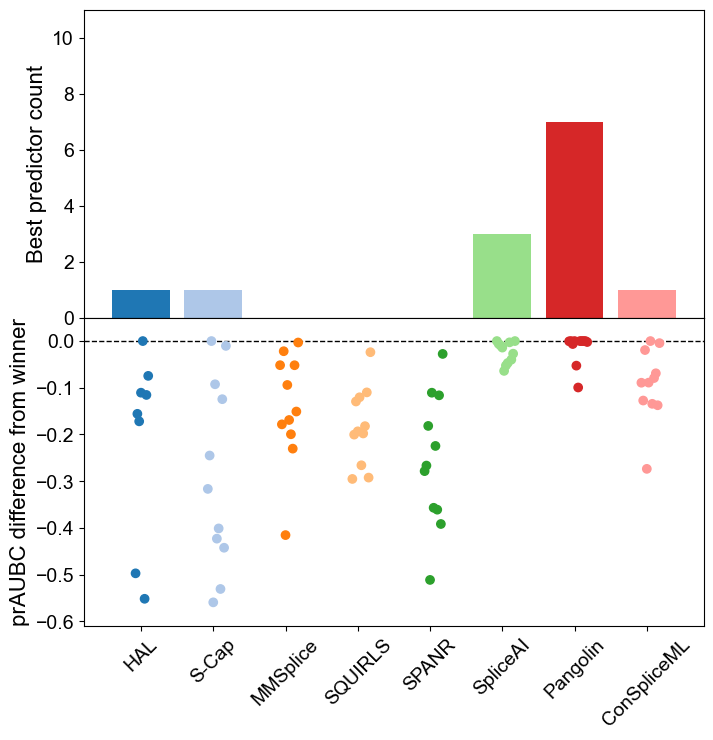

In [214]:
fig, ( ax1, ax2 ) = plt.subplots( 2, 
                                  1,
                                  figsize = ( 8 , 8 ),
                                  sharex = True, 
                                  gridspec_kw = { 'hspace': 0 } )

ax1.bar( [ col.split( '_' )[ 0 ] for col in auc_t if '_diff' in col and not 'max' in col ],
          list( best_counts.values() ),
         color = [ plt.get_cmap( 'tab20' )( i ) for i in range( len( pred_cols ) ) ] )



ax1.set_ylim( ( 0, len( auc_t ) ) )

ax1.set_ylabel( 'Best predictor count',
                 fontsize = 16 )

for j in range( len( auc_t ) ): 
    
    ax2.scatter( np.arange( 0, len( pred_cols ) ) + ( j - 3 )*.025,
                 auc_t.iloc[ j ][ [ col for col in auc_t if '_diff' in col and not 'max' in col ] ],
                 color = [ plt.get_cmap( 'tab20' )( i ) for i in range( len( pred_cols ) ) ],
                 zorder = 2 )

ax2.set_ylim( ( auc_t[ [ col for col in auc_t if '_diff' in col and not 'max' in col ] ].min().min() - .05, 
                0.05 ) )

ax2.set_ylabel( 'prAUBC difference from winner',
                 fontsize = 16 )

ax2.tick_params( axis = 'x', labelsize = 14, rotation = 45 )

ax2.axhline( 0,
             lw = 1,
             ls = '--',
             color = 'black', 
             zorder = 1 )

plt.savefig( '../plots/best_predict_bar.pdf' )

plt.show()

### Benchmarking in the context of genome-wide prediction

In [215]:
def compute_ecdf( data ):
    
    cdf = np.array( data )
    
    x = np.sort( cdf[ ~np.isnan( cdf ) ] )
    n = x.size
    y = np.arange( 1, n + 1 ) / n
    
    return x,y

0.06


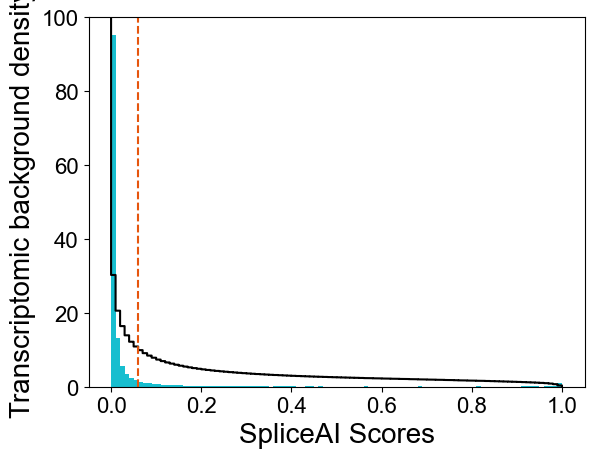

In [216]:
fig,ax = plt.subplots( 1, 1 )

ecdf_x,ecdf_y = compute_ecdf( back_df.SpliceAI_DS_maxm )

ax.step( ecdf_x, 100 - 100*ecdf_y, color = 'black' )

ax2 = ax.twinx()

containers = ax2.hist( back_df.SpliceAI_DS_maxm, 
          bins = 100,
          color = plt.get_cmap( 'tab10' )( 9 ),
          density = True, )

for bar in containers[ 2 ]:
    
    # get x midpoint of bar
    x = bar.get_x() + 0.5 * bar.get_width()

    # set bar color based on x
    if x < .06:
        bar.set( color = plt.get_cmap( 'tab10' )( 9 ),
                 facecolor = plt.get_cmap( 'tab10' )( 9 ),
                 lw = 0
               )
    else:
        bar.set( color = plt.get_cmap( 'tab10' )( 9 ),
                 facecolor = plt.get_cmap( 'tab10' )( 9 ),
                 lw = 0 
               )
    
ax.set_zorder( ax2.get_zorder()+1 )
ax.patch.set_visible(False)
    
ax2.axis( 'off' )
    
ax.set_ylim( ( 0, 100 ) )

print( ecdf_x[ ecdf_y >= .9 ][ 0 ] )

ax.axvline( ecdf_x[ ecdf_y >= .9 ][ 0 ], color = light_colors[ 4 ], ls = '--' )

ax.tick_params( axis = 'both', labelsize = 16 )

ax.set_ylabel( 'Transcriptomic background density', fontsize = 20 )
ax.set_xlabel( 'SpliceAI Scores', fontsize = 20 )

plt.savefig( '../plots/splai_10gSDV_hist.pdf' )

plt.show()

0.9820627802690582


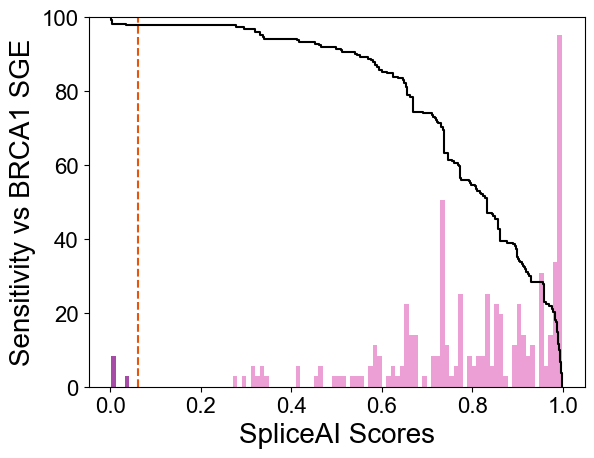

In [217]:
fig,ax = plt.subplots( 1, 1 )

ecdf_x,ecdf_y = compute_ecdf( data_dict[ 'BRCA1' ].loc[ data_dict[ 'BRCA1' ].sdv_fc2 ].SpliceAI_DS_maxm )

plt.step( ecdf_x, 100*( 1 - ecdf_y ), color = 'black' )

ax2 = ax.twinx()

containers = ax2.hist( data_dict[ 'BRCA1' ].loc[ data_dict[ 'BRCA1' ].sdv_fc2 ].SpliceAI_DS_maxm, 
                       bins = 100,
                      density = True,
                      alpha = .7,
                      label = 'Disruptive' )

for bar in containers[ 2 ]:
    
    # get x midpoint of bar
    x = bar.get_x() + 0.5 * bar.get_width()

    # set bar color based on x
    if x < .06:
        bar.set( color = 'purple',
                 facecolor = 'purple',
                 lw = 0 
                 #edgecolor = 'purple'
               )
    else:
        bar.set( color = plt.get_cmap( 'tab10' )( 6 ),
                 facecolor = plt.get_cmap( 'tab10' )( 6 ),
                 lw = 0
                 #edgecolor = plt.get_cmap( 'tab10' )( 6 ), 
               )
    
ax.set_zorder( ax2.get_zorder()+1 )
ax.patch.set_visible(False)
    
ax2.axis( 'off' )
    
ax.set_ylim( ( 0, 100 ) )

plt.axvline( .06, color = light_colors[ 4 ], ls = '--' )

print( ( data_dict[ 'BRCA1' ].loc[ data_dict[ 'BRCA1' ].sdv_fc2 ].SpliceAI_DS_maxm >= .06 ).sum() / data_dict[ 'BRCA1' ].sdv_fc2.sum() )

ax.tick_params( axis = 'both', labelsize = 16 )

ax.set_ylabel( 'Sensitivity vs BRCA1 SGE', fontsize = 20 )
ax.set_xlabel( 'SpliceAI Scores', fontsize = 20 )

plt.savefig( '../plots/BRCA1_splai_sens_hist.pdf' )

plt.show()

0.8065348237317282


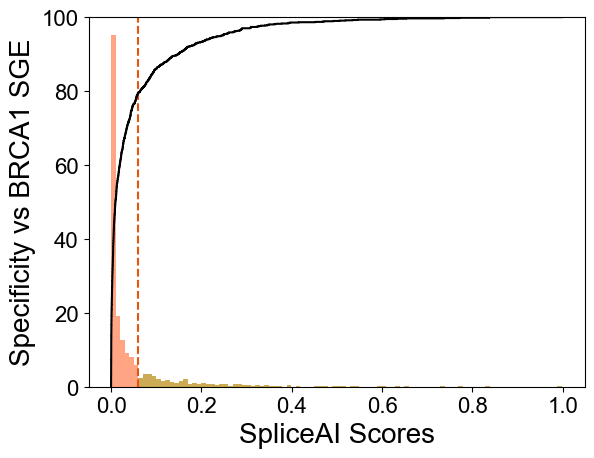

In [218]:
fig,ax = plt.subplots( 1, 1 )

ecdf_x,ecdf_y = compute_ecdf( data_dict[ 'BRCA1' ].loc[ data_dict[ 'BRCA1' ].sdv_fc2 == False ].SpliceAI_DS_maxm )

plt.step( ecdf_x, 100*ecdf_y, color = 'black' )

ax2 = ax.twinx()

containers = ax2.hist( data_dict[ 'BRCA1' ].loc[ data_dict[ 'BRCA1' ].sdv_fc2 == False ].SpliceAI_DS_maxm, 
                       bins = 100,
                      density = True,
                      alpha = .7,
                      label = 'Disruptive' )

for bar in containers[ 2 ]:
    
    # get x midpoint of bar
    x = bar.get_x() + 0.5 * bar.get_width()

    # set bar color based on x
    if x < .06:
        bar.set( color = 'coral',
                 facecolor = 'coral',
                 lw = 0 
                 #edgecolor = 'purple'
               )
    else:
        bar.set( color = 'darkgoldenrod',
                 facecolor = 'darkgoldenrod',
                 lw = 0
                 #edgecolor = plt.get_cmap( 'tab10' )( 6 ), 
               )
    
ax.set_zorder( ax2.get_zorder()+1 )
ax.patch.set_visible(False)
    
ax2.axis( 'off' )
    
ax.set_ylim( ( 0, 100 ) )

plt.axvline( .06, color = light_colors[ 4 ], ls = '--' )

print( ( data_dict[ 'BRCA1' ].loc[ data_dict[ 'BRCA1' ].sdv_fc2 == False ].SpliceAI_DS_maxm < .0684492737054824 ).sum() / ( data_dict[ 'BRCA1' ].sdv_fc2 == False ).sum() )

ax.tick_params( axis = 'both', labelsize = 16 )

ax.set_ylabel( 'Specificity vs BRCA1 SGE', fontsize = 20 )
ax.set_xlabel( 'SpliceAI Scores', fontsize = 20 )

plt.savefig( '../plots/BRCA1_splai_spec_hist.pdf' )

plt.show()

In [219]:
def define_transcriptome_thresholds( back_data,
                                     pred_cols, 
                                     thresholds ):
    
    back_df = back_data.copy()
    
    outd_t = { 'thresh_' + str( thresh ): [] for thresh in thresholds }
    outd_np = { 'n_' + str( thresh ): [] for thresh in thresholds }
    outd_np.update( { 'per_' + str( thresh ): [] for thresh in thresholds } )
    
    for col in pred_cols:
        
        bcol = back_df.loc[ back_df[ col ].notnull() ].sort_values( col,
                                                                    ascending = False ).copy()
        
        possible_vals = bcol[ col ].unique()
        
        for thresh in thresholds:
                        
            for t in possible_vals:
                    
                if 100*( ( bcol[ col ] >= t ).sum() / len( bcol ) ) >= thresh:

                    outd_t[ 'thresh_' + str( thresh ) ].append( t )
                    outd_np[ 'n_' + str( thresh ) ].append( ( bcol[ col ] >= t ).sum() )
                    outd_np[ 'per_' + str( thresh ) ].append( 100*( ( bcol[ col ] >= t ).sum() / len( bcol ) ) )
                    possible_vals = possible_vals[ possible_vals <= t ]
                    break
                        
    thresh_df = pd.DataFrame( outd_t,
                              index = [ col.split( '_' )[ 0 ] for col in pred_cols ] )
    nper_df = pd.DataFrame( outd_np,
                            index = [ col.split( '_' )[ 0 ] for col in pred_cols ] )
    
    return thresh_df, nper_df

In [432]:
%%time

threshold_df, nper = define_transcriptome_thresholds( back_df,
                                                    pred_cols, 
                                                    [ 5, 10, 15, 20 ] )

CPU times: user 1min 23s, sys: 1.44 s, total: 1min 24s
Wall time: 1min 24s


In [433]:
threshold_df

,thresh_5,thresh_10,thresh_15,thresh_20
HAL,52.900000,34.200000,23.600000,16.600000
S-Cap,0.645329,0.387097,0.325635,0.282258
MMSplice,0.720531,0.388854,0.271020,0.207837
SQUIRLS,0.030315,0.011225,0.008848,0.008380
SPANR,2.513000,2.027000,1.736000,1.523000
SpliceAI,0.190000,0.060000,0.030000,0.020000
Pangolin,0.170000,0.070000,0.040000,0.030000
ConSpliceML,0.645000,0.424000,0.300000,0.218000


In [434]:
nper

,n_5,n_10,n_15,n_20,per_5,per_10,per_15,per_20
HAL,10908,21804,32657,43663,5.014227,10.022938,15.011883,20.071159
S-Cap,9745,25109,29210,38981,5.004365,12.894264,15.000257,20.017974
MMSplice,25000,50000,75000,100000,5.000000,10.000000,15.000000,20.000000
SQUIRLS,22651,45301,67951,90602,5.000166,10.000110,15.000055,20.000221
SPANR,24694,49237,73877,98529,5.016781,10.002885,15.008695,20.016943
SpliceAI,24147,52202,78673,98658,5.035377,10.885690,16.405691,20.573166
Pangolin,26091,51402,80049,100027,5.218200,10.280400,16.009800,20.005400
ConSpliceML,23816,47660,71421,95284,5.006685,10.019256,15.014379,20.030945


In [435]:
def sens_subplot( datasets,
                  back_data,
                  truth_col,
                  pred_cols,
                  cmap,
                  back_thresh_d,
                  x_thresh,
                  y_thresh,
                  figsize = ( 12, 10 ),
                  sharex = False,
                  sharey = False,
                  xlim = None,
                  plot = True,
                  savefig = False ):
    
    data = { name: datasets[ name ].loc[ datasets[ name ][ truth_col ].notnull() ].copy()
             for name in datasets.keys() }
    
    outd = { tool.split( '_' )[ 0 ] + '_auc_sens': [] for tool in pred_cols }
    outd.update( { tool.split( '_' )[ 0 ] + '_pt_sens_x': [] for tool in pred_cols } )
    outd.update( { tool.split( '_' )[ 0 ] + '_pt_sens_y': [] for tool in pred_cols } )
    
    #the pre-canned SpliceAI scores are rounded to two decimal places - makes comparison tricky 
    for df in data.values():       
        df[ 'SpliceAI_DS_maxm' ] = df[ 'SpliceAI_DS_maxm' ].round( decimals = 2 ) 
    
    for name in data.keys():
    
        if len( datasets[ name ] ) != len( data[ name ] ):
            
            missing = len( datasets[ name ] ) - len( data[ name ] )
            
            print( '%i missing values in %s in measured dataset %s' % ( missing, truth_col ) )
    
    back_df = back_data.copy()
    
    fig, ax = plt.subplots( len( list( data.keys() ) ),
                            figsize = figsize,
                            sharex = sharex,
                            sharey = sharey )
    
    for i, name_df in enumerate( data.items() ):
        
        name,df = name_df
            
        if len( df ) == 0:
                
            print( 'No data to plot for %s %s' % ( name, cat ) )
                
            for col in pred_cols:

                outd[ col.split( '_' )[ 0 ] + '_auc_sens' ].append( np.nan )
                outd[ col.split( '_' )[ 0 ] + '_pt_sens_x' ].append( np.nan )
                outd[ col.split( '_' )[ 0 ] + '_pt_sens_y' ].append( np.nan )
                ax[ i ][ j ].set_visible( False )
                
            continue
        
        for p, col in enumerate( pred_cols ):
        
            col_df = df.loc[ df[ col ].notnull() ].copy()
    
            if len( df ) != len( col_df ):
            
                missing = len( df ) - len( col_df )
            
                print( '%i missing values in %s in measured dataset %s' % ( missing, col, name ) )
                
                if len( col_df ) == 0:
                        
                    print( 'No data to plot for %s for tool %s' % ( name, col ) )
                
                    outd[ col.split( '_' )[ 0 ] + '_auc_sens' ].append( np.nan )
                    outd[ col.split( '_' )[ 0 ] + '_pt_sens_x' ].append( np.nan )
                    outd[ col.split( '_' )[ 0 ] + '_pt_sens_y' ].append( np.nan )
                
                    continue
                        
            _, sens, thresh = roc_curve( col_df[ truth_col ], col_df[ col ] )
    
            bcol_df = back_df.loc[ back_df[ col ].notnull() ].copy()
        
            if thresh[ -1 ] > bcol_df[ col ].min():
                thresh = np.append( thresh, bcol_df[ col ].min() )
                sens = np.append( sens, ( ( col_df[ truth_col ] ) & ( col_df[ col ] >= thresh[ -1 ] ) ).sum() / col_df[ truth_col ].sum() )
    
            if len( bcol_df ) != len( back_df ):
            
                missing = len( back_df ) - len( bcol_df )
            
                print( '%i missing values in %s in background dataset' % ( missing, col, ) )
    
            back = np.array( [ 100*( ( bcol_df[ col ] >= t ).sum() / len( bcol_df ) ) for t in thresh ] )
    
            ax[ i ].step( back,
                          100*sens,
                          c = plt.get_cmap( cmap )( p ),
                          label = col.split( '_' )[ 0 ] )
        
            outd[ col.split( '_' )[ 0 ] + '_auc_sens' ].append( auc( back / 100, sens ) )
            outd[ col.split( '_' )[ 0 ] + '_pt_sens_x' ].append( ( ( col_df[ truth_col ] ) & ( col_df[ col ] >= back_thresh_d[ col.split( '_' )[ 0 ] ] ) ).sum() / col_df[ truth_col ].sum() )
            outd[ col.split( '_' )[ 0 ] + '_pt_sens_y' ].append( back[ sens >= y_thresh ][ 0 ] if sum( sens >= y_thresh ) > 0 else np.nan )
        
        ax[ len( data ) - 1 ].set_xlabel( '% SDV from transcriptomic background' )
            
        ax[ i ].set_ylabel( name )
        
        if xlim:
            
            ax[ i ].set_xlim( xlim )
        
    ax[ 2 ].legend()
            
    if i < len( list( data.keys() ) ):
        
        i += 1
        
        while i < len( list( data.keys() ) ):
            
            for j in range( len( cats ) ):
        
                ax[ i ].set_visible( False )
            
            i += 1
            
    plt.tight_layout()
    
    if savefig:
        
        plt.savefig( savefig )
    
    if plot:
        plt.show()
    
    outdf = pd.DataFrame( outd,
                          index = [ name for name in data ] )
    
    return outdf

923 missing values in HAL_chgPER_abs in measured dataset BRCA1
282459 missing values in HAL_chgPER_abs in background dataset
39 missing values in S-Cap_sens_min_r in measured dataset BRCA1
305270 missing values in S-Cap_sens_min_r in background dataset
46995 missing values in SQUIRLS_score_not in background dataset
7772 missing values in SPANR_chgZPER_abs in background dataset
20453 missing values in SpliceAI_DS_maxm in background dataset
24316 missing values in ConSpliceML in background dataset
282459 missing values in HAL_chgPER_abs in background dataset
140 missing values in S-Cap_sens_min_r in measured dataset FAS
305270 missing values in S-Cap_sens_min_r in background dataset
1 missing values in SQUIRLS_score_not in measured dataset FAS
46995 missing values in SQUIRLS_score_not in background dataset
7772 missing values in SPANR_chgZPER_abs in background dataset
20453 missing values in SpliceAI_DS_maxm in background dataset
24316 missing values in ConSpliceML in background dataset


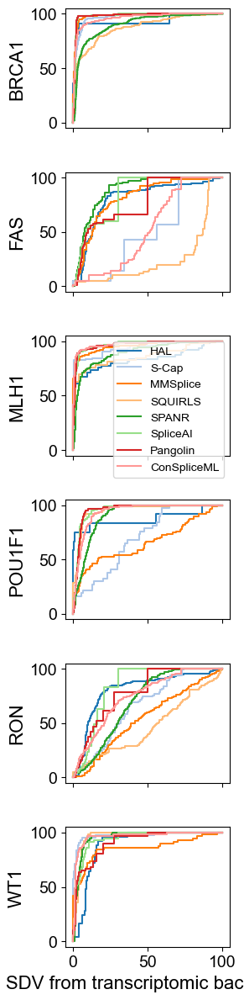

In [438]:
sens_10_df = sens_subplot( { name: df for name,df in data_dict.items() if name != 'Transcriptome' },
                              back_df,
                              'sdv_fc2',
                              pred_cols,
                              'tab20',
                              { idx: thresh for idx,thresh in zip( threshold_df.index, threshold_df[ 'thresh_10' ] ) },
                               10,
                               .8,
                               sharex = True,
                               sharey = True,
                               figsize = ( 3, 12 ),
                               #savefig = '/nfs/kitzman2/smithcat/proj/spliceAI/plots/sens_by_perSDV.pdf' 
                            )

In [225]:
sens_10_df

,HAL_auc_sens,S-Cap_auc_sens,MMSplice_auc_sens,SQUIRLS_auc_sens,SPANR_auc_sens,SpliceAI_auc_sens,Pangolin_auc_sens,ConSpliceML_auc_sens,HAL_pt_sens_x,S-Cap_pt_sens_x,...,Pangolin_pt_sens_x,ConSpliceML_pt_sens_x,HAL_pt_sens_y,S-Cap_pt_sens_y,MMSplice_pt_sens_y,SQUIRLS_pt_sens_y,SPANR_pt_sens_y,SpliceAI_pt_sens_y,Pangolin_pt_sens_y,ConSpliceML_pt_sens_y
BRCA1,0.927052,0.966687,0.979943,0.872277,0.899776,0.976008,0.980028,0.960616,0.909091,0.954955,...,0.982063,0.914798,2.409201,4.757356,2.2748,20.787850,15.607198,2.110533,2.3794,3.198552
FAS,0.797604,0.380208,0.803295,0.238529,0.878809,0.698131,0.680019,0.501431,0.373913,0.000000,...,0.486957,0.052174,22.928092,100.000000,32.5470,90.317105,19.760761,100.000000,100.0000,66.020720
MLH1,0.833895,0.923051,0.947405,0.854186,0.892543,0.956600,0.959534,0.972661,0.714286,0.836207,...,0.931250,0.931250,37.733117,7.793355,3.6666,24.014746,17.735887,3.673467,2.9158,1.615568
POU1F1,0.868980,0.694621,0.652345,0.946416,0.902782,0.948269,0.952217,0.936130,0.750000,0.216216,...,0.947917,0.802083,11.170308,54.316233,72.9776,6.265052,15.454424,5.236400,5.7210,9.196652
RON,0.804867,0.649040,0.540587,0.458583,0.692424,0.763037,0.705883,0.737262,0.483146,0.133333,...,0.330073,0.261614,22.830179,59.342680,76.2758,83.371707,45.533777,30.236035,100.0000,45.486079
WT1,0.889332,0.972295,0.849909,0.959936,0.952439,0.922242,0.888124,0.960824,0.600000,0.952381,...,0.666667,0.964912,14.890526,2.952293,15.3348,5.973003,6.219476,8.421281,20.0054,3.899858


In [226]:
sens_10_df[ [ col for col in sens_10_df if col.endswith( '_x' ) ] ]

,HAL_pt_sens_x,S-Cap_pt_sens_x,MMSplice_pt_sens_x,SQUIRLS_pt_sens_x,SPANR_pt_sens_x,SpliceAI_pt_sens_x,Pangolin_pt_sens_x,ConSpliceML_pt_sens_x
BRCA1,0.909091,0.954955,0.977578,0.654709,0.753363,0.982063,0.982063,0.914798
FAS,0.373913,0.000000,0.365217,0.052632,0.573913,0.539130,0.486957,0.052174
MLH1,0.714286,0.836207,0.875000,0.745763,0.751592,0.931250,0.931250,0.931250
POU1F1,0.750000,0.216216,0.410526,0.915789,0.583333,0.885417,0.947917,0.802083
RON,0.483146,0.133333,0.046455,0.114914,0.102689,0.237164,0.330073,0.261614
WT1,0.600000,0.952381,0.719298,0.962264,0.912281,0.859649,0.666667,0.964912


In [440]:
sens_10_df[ [ col for col in sens_10_df if col.endswith( '_x' ) ] ].median()

HAL_pt_sens_x            0.657143
S-Cap_pt_sens_x          0.526212
MMSplice_pt_sens_x       0.564912
SQUIRLS_pt_sens_x        0.700236
SPANR_pt_sens_x          0.667463
SpliceAI_pt_sens_x       0.872533
Pangolin_pt_sens_x       0.798958
ConSpliceML_pt_sens_x    0.858441
dtype: float64

In [441]:
def sens_by_cat_subplot( datasets,
                         back_data,
                         truth_col,
                         pred_cols,
                         cats,
                         cat_col,
                         cmap,
                         back_thresh_d,
                         x_thresh,
                         y_thresh,
                         plot = True,
                        cmap_baseline=0,
                          figsize = ( 12, 10 ),
                          sharex = False,
                          sharey = False,
                          xlim = None,
                          savefig = False ):
    
    data = { name: datasets[ name ].loc[ datasets[ name ][ truth_col ].notnull() ].copy()
             for name in datasets.keys() }
    
    outd = { cat + '_' + tool.split( '_' )[ 0 ] + '_auc_sens': [] for cat in cats for tool in pred_cols }
    outd.update( { cat + '_' + tool.split( '_' )[ 0 ] + '_pt_sens_x': [] for cat in cats for tool in pred_cols } )
    outd.update( { cat + '_' + tool.split( '_' )[ 0 ] + '_pt_sens_y': [] for cat in cats for tool in pred_cols } )
    
    #the pre-canned SpliceAI scores are rounded to two decimal places - makes comparison tricky 
    for df in data.values():       
        df[ 'SpliceAI_DS_maxm' ] = df[ 'SpliceAI_DS_maxm' ].round( decimals = 2 ) 
    
    for name in data.keys():
    
        if len( datasets[ name ] ) != len( data[ name ] ):
            
            missing = len( datasets[ name ] ) - len( data[ name ] )
            
            print( '%i missing values in %s in measured dataset %s' % ( missing, truth_col ) )
    
    back_df = back_data.copy()
    
    fig, ax = plt.subplots( len( list( data.keys() ) ), 
                            len( cats ),
                            figsize = figsize,
                            sharex = sharex,
                            sharey = sharey )
    
    for i, name_df in enumerate( data.items() ):
        
        name,df = name_df
        
        for j, cat in enumerate( cats ):
            
            cat_df = df.loc[ df[ cat_col ] == cat ].copy()
            
            if len( cat_df ) == 0:
                
                print( 'No data to plot for %s %s' % ( name, cat ) )
                
                for col in pred_cols:

                    outd[ cat + '_' + col.split( '_' )[ 0 ] + '_auc_sens' ].append( np.nan )
                    outd[ cat + '_' + col.split( '_' )[ 0 ] + '_pt_sens_x' ].append( np.nan )
                    outd[ cat + '_' + col.split( '_' )[ 0 ] + '_pt_sens_y' ].append( np.nan )
                    ax[ i ][ j ].set_visible( False )
                
                continue
        
            for p, col in enumerate( pred_cols ):
        
                col_df = cat_df.loc[ cat_df[ col ].notnull() ].copy()
    
                if len( cat_df ) != len( col_df ):
            
                    missing = len( cat_df ) - len( col_df )
            
                    print( '%i missing values in %s in measured dataset %s' % ( missing, col, name ) )
                
                    if len( col_df ) == 0:
                        
                        print( 'No data to plot for %s %s for tool %s' % ( name, cat, col ) )
                
                        outd[ cat + '_' + col.split( '_' )[ 0 ] + '_auc_sens' ].append( np.nan )
                        outd[ cat + '_' + col.split( '_' )[ 0 ] + '_pt_sens_x' ].append( np.nan )
                        outd[ cat + '_' + col.split( '_' )[ 0 ] + '_pt_sens_y' ].append( np.nan )
                
                        continue
                        
                _, sens, thresh = roc_curve( col_df[ truth_col ], col_df[ col ] )
    
                bcol_df = back_df.loc[ back_df[ col ].notnull() ].copy()
        
                if thresh[ -1 ] > bcol_df[ col ].min():
                    thresh = np.append( thresh, bcol_df[ col ].min() )
                    sens = np.append( sens, ( ( col_df[ truth_col ] ) & ( col_df[ col ] >= thresh[ -1 ] ) ).sum() / col_df[ truth_col ].sum() )
    
                if len( back_df ) != len( bcol_df ):
            
                    missing = len( back_df ) - len( bcol_df )
            
                    print( '%i missing values in %s in background dataset' % ( missing, col, ) )
    
                back = np.array( [ 100*( ( bcol_df[ col ] >= t ).sum() / len( bcol_df ) ) for t in thresh ] )
    
                ax[ i ][ j ].step( back,
                                  100*sens,
                                  c = plt.get_cmap( cmap )( p + cmap_baseline ),
                                  label = col.split( '_' )[ 0 ] )
        
                outd[ cat + '_' + col.split( '_' )[ 0 ] + '_auc_sens' ].append( auc( back / 100, sens ) )
                outd[ cat + '_' + col.split( '_' )[ 0 ] + '_pt_sens_x' ].append( ( ( col_df[ truth_col ] ) & ( col_df[ col ] >= back_thresh_d[ col.split( '_' )[ 0 ] ] ) ).sum() / col_df[ truth_col ].sum() )
                outd[ cat + '_' + col.split( '_' )[ 0 ] + '_pt_sens_y' ].append( back[ sens >= y_thresh ][ 0 ] if sum( sens >= y_thresh ) > 0 else np.nan )
        
            ax[ len( data ) - 1 ][ j ].set_xlabel( '% SDV from transcriptomic background' )
            
            ax[ 0 ][ j ].set_title( cat )
            
            if xlim:
            
                ax[ i ][ j ].set_xlim( xlim )
            
        ax[ i ][ 0 ].set_ylabel( name )
        
        ax[ 2 ][ j ].legend()
    
    if j < len( cats ):
        
        j += 1
        
        while j < len( cats ):
        
            ax[ 1 ][ j ].set_visible( False )
            j += 1
            
    if i < len( list( data.keys() ) ):
        
        i += 1
        
        while i < len( list( data.keys() ) ):
            
            for j in range( len( cats ) ):
        
                ax[ i ][ j ].set_visible( False )
            
            i += 1
            
    plt.tight_layout()
    
    if savefig:
        
        plt.savefig( savefig )
        
    if plot:
    
        plt.show()
    
    outdf = pd.DataFrame( outd,
                          index = [ name for name in data ] )
    
    return outdf

In [442]:
for df in data_dict.values():
    df[ 'exon_cat' ] = [ 'Exon' if exon else 'Intron' for exon in df.exon ]

In [443]:
back_df[ 'exon_cat' ] = [ 'Exon' if exon else 'Intron' for exon in back_df.exon ]

In [444]:
pred_cols[2:]

['MMSplice_chgPERlogit_abs',
 'SQUIRLS_score_not',
 'SPANR_chgZPER_abs',
 'SpliceAI_DS_maxm',
 'Pangolin_max_abs',
 'ConSpliceML']

38 missing values in S-Cap_sens_min_r in measured dataset BRCA1
305270 missing values in S-Cap_sens_min_r in background dataset
46995 missing values in SQUIRLS_score_not in background dataset
7772 missing values in SPANR_chgZPER_abs in background dataset
20453 missing values in SpliceAI_DS_maxm in background dataset
24316 missing values in ConSpliceML in background dataset
1 missing values in S-Cap_sens_min_r in measured dataset BRCA1
305270 missing values in S-Cap_sens_min_r in background dataset
46995 missing values in SQUIRLS_score_not in background dataset
7772 missing values in SPANR_chgZPER_abs in background dataset
20453 missing values in SpliceAI_DS_maxm in background dataset


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


24316 missing values in ConSpliceML in background dataset
140 missing values in S-Cap_sens_min_r in measured dataset FAS
305270 missing values in S-Cap_sens_min_r in background dataset
1 missing values in SQUIRLS_score_not in measured dataset FAS
46995 missing values in SQUIRLS_score_not in background dataset
7772 missing values in SPANR_chgZPER_abs in background dataset
20453 missing values in SpliceAI_DS_maxm in background dataset


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


24316 missing values in ConSpliceML in background dataset
No data to plot for FAS Intron
152 missing values in S-Cap_sens_min_r in measured dataset MLH1
305270 missing values in S-Cap_sens_min_r in background dataset
10 missing values in SQUIRLS_score_not in measured dataset MLH1
46995 missing values in SQUIRLS_score_not in background dataset
7772 missing values in SPANR_chgZPER_abs in background dataset
20453 missing values in SpliceAI_DS_maxm in background dataset
24316 missing values in ConSpliceML in background dataset
6 missing values in S-Cap_sens_min_r in measured dataset MLH1
305270 missing values in S-Cap_sens_min_r in background dataset
91 missing values in SQUIRLS_score_not in measured dataset MLH1
46995 missing values in SQUIRLS_score_not in background dataset
3 missing values in SPANR_chgZPER_abs in measured dataset MLH1
7772 missing values in SPANR_chgZPER_abs in background dataset
20453 missing values in SpliceAI_DS_maxm in background dataset
24316 missing values in ConS

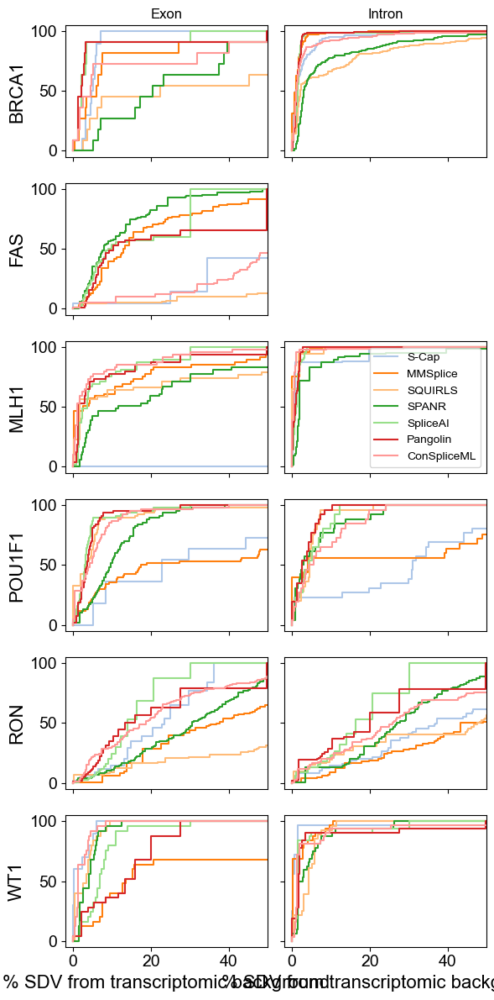

In [463]:
sens_2cat_10_df = sens_by_cat_subplot( { name: df for name,df in data_dict.items() if name != 'Transcriptome' },
                                           back_df,
                                           'sdv_fc2',
                                          [ pc for pc in pred_cols if not pc.startswith('HAL_') ],
                                          [ 'Exon', 'Intron' ],
                                          'exon_cat',
                                         'tab20',
                                          { idx: thresh for idx,thresh in zip( threshold_df.index, threshold_df[ 'thresh_10' ] ) },
                                          10,
                                          .8,
                                          sharex = True,
                                          sharey = True,
                                          xlim = ( -2, 50 ),
                                          figsize = ( 6, 12 ),
                                          savefig = '../plots/sens_by_perSDV_exint.pdf',
                                         cmap_baseline=1
                                     )

38 missing values in S-Cap_sens_min_r in measured dataset BRCA1
305270 missing values in S-Cap_sens_min_r in background dataset
1 missing values in S-Cap_sens_min_r in measured dataset BRCA1


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


305270 missing values in S-Cap_sens_min_r in background dataset
140 missing values in S-Cap_sens_min_r in measured dataset FAS
305270 missing values in S-Cap_sens_min_r in background dataset
No data to plot for FAS Intron
152 missing values in S-Cap_sens_min_r in measured dataset MLH1
305270 missing values in S-Cap_sens_min_r in background dataset
6 missing values in S-Cap_sens_min_r in measured dataset MLH1
305270 missing values in S-Cap_sens_min_r in background dataset
336 missing values in S-Cap_sens_min_r in measured dataset POU1F1
305270 missing values in S-Cap_sens_min_r in background dataset
234 missing values in S-Cap_sens_min_r in measured dataset POU1F1
305270 missing values in S-Cap_sens_min_r in background dataset
292 missing values in S-Cap_sens_min_r in measured dataset RON
305270 missing values in S-Cap_sens_min_r in background dataset
1 missing values in S-Cap_sens_min_r in measured dataset RON
305270 missing values in S-Cap_sens_min_r in background dataset
206 missing 

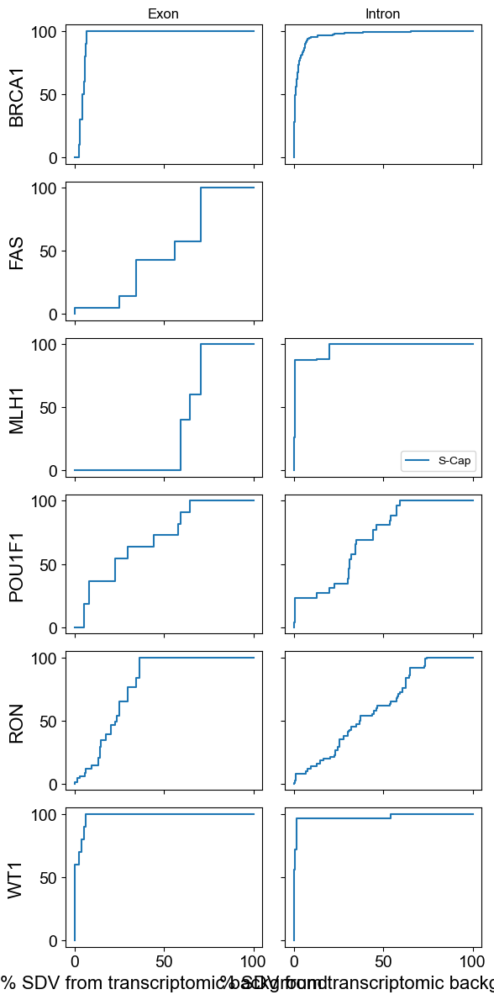

,Exon_S-Cap_auc_sens,Intron_S-Cap_auc_sens,Exon_S-Cap_pt_sens_x,Intron_S-Cap_pt_sens_x,Exon_S-Cap_pt_sens_y,Intron_S-Cap_pt_sens_y
BRCA1,0.951200,0.967503,1.000000,0.952830,6.088944,4.443075
FAS,0.380208,NaN,0.000000,NaN,100.000000,NaN
MLH1,0.327205,0.939979,0.000000,0.873874,74.433831,9.460792
POU1F1,0.690632,0.700672,0.181818,0.230769,58.579572,53.481744
RON,0.765812,0.596272,0.115942,0.141844,36.255328,64.271555
WT1,0.976022,0.967830,0.900000,0.968750,4.498536,8.690495


In [446]:
sens_by_cat_subplot( { name: df for name,df in data_dict.items() if name != 'Transcriptome' },
                                           back_df,
                                           'sdv_fc2',
                                          [ 'S-Cap_sens_min_r' ],
                                          [ 'Exon', 'Intron' ],
                                          'exon_cat',
                                         'tab20',
                                          { idx: thresh for idx,thresh in zip( threshold_df.index, threshold_df[ 'thresh_10' ] ) },
                                          10,
                                          .8,
                                          sharex = True,
                                          sharey = True,
                                          figsize = ( 6, 12 ), )

In [447]:
sens_2cat_10_df

,Exon_S-Cap_auc_sens,Exon_MMSplice_auc_sens,Exon_SQUIRLS_auc_sens,Exon_SPANR_auc_sens,Exon_SpliceAI_auc_sens,Exon_Pangolin_auc_sens,Exon_ConSpliceML_auc_sens,Intron_S-Cap_auc_sens,Intron_MMSplice_auc_sens,Intron_SQUIRLS_auc_sens,Intron_SPANR_auc_sens,Intron_SpliceAI_auc_sens,Intron_Pangolin_auc_sens,Intron_ConSpliceML_auc_sens,Exon_S-Cap_pt_sens_x,Exon_MMSplice_pt_sens_x,Exon_SQUIRLS_pt_sens_x,Exon_SPANR_pt_sens_x,Exon_SpliceAI_pt_sens_x,Exon_Pangolin_pt_sens_x,Exon_ConSpliceML_pt_sens_x,Intron_S-Cap_pt_sens_x,Intron_MMSplice_pt_sens_x,Intron_SQUIRLS_pt_sens_x,Intron_SPANR_pt_sens_x,Intron_SpliceAI_pt_sens_x,Intron_Pangolin_pt_sens_x,Intron_ConSpliceML_pt_sens_x,Exon_S-Cap_pt_sens_y,Exon_MMSplice_pt_sens_y,Exon_SQUIRLS_pt_sens_y,Exon_SPANR_pt_sens_y,Exon_SpliceAI_pt_sens_y,Exon_Pangolin_pt_sens_y,Exon_ConSpliceML_pt_sens_y,Intron_S-Cap_pt_sens_y,Intron_MMSplice_pt_sens_y,Intron_SQUIRLS_pt_sens_y,Intron_SPANR_pt_sens_y,Intron_SpliceAI_pt_sens_y,Intron_Pangolin_pt_sens_y,Intron_ConSpliceML_pt_sens_y
BRCA1,0.951200,0.880745,0.612363,0.719247,0.920249,0.912917,0.865948,0.967503,0.985213,0.885971,0.909157,0.979000,0.983593,0.965575,1.000000,0.818182,0.454545,0.272727,0.909091,0.909091,0.727273,0.952830,0.985849,0.665094,0.778302,0.985849,0.985849,0.924528,6.088944,7.6834,85.788016,39.019723,3.504349,3.0314,32.376536,4.443075,1.9660,16.880167,13.155895,2.051519,2.2756,2.920847
FAS,0.380208,0.803295,0.238529,0.878809,0.698131,0.680019,0.501431,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.365217,0.052632,0.573913,0.539130,0.486957,0.052174,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.000000,32.5470,90.317105,19.760761,100.000000,100.0000,66.020720,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MLH1,0.327205,0.865691,0.787527,0.781880,0.888018,0.891758,0.931828,0.939979,0.982541,0.983547,0.942579,0.987213,0.989667,0.991051,0.000000,0.612245,0.641026,0.469388,0.775510,0.775510,0.816327,0.873874,0.990991,0.950000,0.879630,1.000000,1.000000,0.981982,74.433831,20.5544,51.858368,37.685178,13.908751,20.0054,8.885100,9.460792,4.3262,2.950078,7.332984,1.935368,1.8152,0.889036
POU1F1,0.690632,0.621964,0.944672,0.890154,0.949405,0.949699,0.940669,0.700672,0.739049,0.952311,0.937577,0.946960,0.961100,0.924763,0.181818,0.357143,0.900000,0.514286,0.900000,0.942857,0.857143,0.230769,0.560000,0.960000,0.769231,0.846154,0.961538,0.653846,58.579572,76.9200,6.265052,15.526951,4.538658,5.4530,8.433119,53.481744,54.4760,5.916712,10.884387,9.082113,6.7736,12.622665
RON,0.765812,0.568081,0.375689,0.684896,0.785240,0.713964,0.774478,0.596272,0.491839,0.616514,0.706901,0.721299,0.689808,0.667871,0.115942,0.033708,0.082397,0.104869,0.239700,0.352060,0.292135,0.141844,0.070423,0.176056,0.098592,0.232394,0.288732,0.204225,36.255328,70.8892,89.931458,46.278554,30.236035,100.0000,39.564291,64.271555,81.7200,60.110153,43.059111,100.000000,100.0000,62.881871
WT1,0.976022,0.693365,0.965054,0.957252,0.906777,0.841019,0.975499,0.967830,0.972891,0.955942,0.949869,0.933845,0.924949,0.949732,0.900000,0.400000,1.000000,0.960000,0.800000,0.360000,1.000000,0.968750,0.968750,0.928571,0.875000,0.906250,0.906250,0.937500,4.498536,67.9020,4.758005,5.983609,9.899968,27.5010,3.899858,8.690495,3.5176,5.973003,6.764142,3.950603,3.4522,2.673413


In [448]:
sens_2cat_10_df[ [ col for col in sens_2cat_10_df if col.endswith( '_x' ) ] ]

,Exon_S-Cap_pt_sens_x,Exon_MMSplice_pt_sens_x,Exon_SQUIRLS_pt_sens_x,Exon_SPANR_pt_sens_x,Exon_SpliceAI_pt_sens_x,Exon_Pangolin_pt_sens_x,Exon_ConSpliceML_pt_sens_x,Intron_S-Cap_pt_sens_x,Intron_MMSplice_pt_sens_x,Intron_SQUIRLS_pt_sens_x,Intron_SPANR_pt_sens_x,Intron_SpliceAI_pt_sens_x,Intron_Pangolin_pt_sens_x,Intron_ConSpliceML_pt_sens_x
BRCA1,1.000000,0.818182,0.454545,0.272727,0.909091,0.909091,0.727273,0.952830,0.985849,0.665094,0.778302,0.985849,0.985849,0.924528
FAS,0.000000,0.365217,0.052632,0.573913,0.539130,0.486957,0.052174,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MLH1,0.000000,0.612245,0.641026,0.469388,0.775510,0.775510,0.816327,0.873874,0.990991,0.950000,0.879630,1.000000,1.000000,0.981982
POU1F1,0.181818,0.357143,0.900000,0.514286,0.900000,0.942857,0.857143,0.230769,0.560000,0.960000,0.769231,0.846154,0.961538,0.653846
RON,0.115942,0.033708,0.082397,0.104869,0.239700,0.352060,0.292135,0.141844,0.070423,0.176056,0.098592,0.232394,0.288732,0.204225
WT1,0.900000,0.400000,1.000000,0.960000,0.800000,0.360000,1.000000,0.968750,0.968750,0.928571,0.875000,0.906250,0.906250,0.937500


In [449]:
sens_2cat_10_df[ [ col for col in sens_2cat_10_df if col.startswith( 'Exon' ) and col.endswith( '_x' ) ] ].median()

Exon_S-Cap_pt_sens_x          0.148880
Exon_MMSplice_pt_sens_x       0.382609
Exon_SQUIRLS_pt_sens_x        0.547786
Exon_SPANR_pt_sens_x          0.491837
Exon_SpliceAI_pt_sens_x       0.787755
Exon_Pangolin_pt_sens_x       0.631233
Exon_ConSpliceML_pt_sens_x    0.771800
dtype: float64

In [450]:
sens_2cat_10_df[ [ col for col in sens_2cat_10_df if col.startswith( 'Intron' ) and col.endswith( '_x' ) ] ].median()

Intron_S-Cap_pt_sens_x          0.873874
Intron_MMSplice_pt_sens_x       0.968750
Intron_SQUIRLS_pt_sens_x        0.928571
Intron_SPANR_pt_sens_x          0.778302
Intron_SpliceAI_pt_sens_x       0.906250
Intron_Pangolin_pt_sens_x       0.961538
Intron_ConSpliceML_pt_sens_x    0.924528
dtype: float64

In [451]:
np.nanmean( sens_2cat_10_df[ [ col for col in sens_2cat_10_df if col.startswith( 'Intron' ) and col.endswith( '_x' ) ] ].median().values \
- sens_2cat_10_df[ [ col for col in sens_2cat_10_df if col.startswith( 'Exon' ) and col.endswith( '_x' ) ] ].median().values )

0.3685592536051259

276629 missing values in HAL_chgPER_abs in background dataset
38 missing values in S-Cap_sens_min_r in measured dataset BRCA1
305164 missing values in S-Cap_sens_min_r in background dataset
46455 missing values in SQUIRLS_score_not in background dataset
7707 missing values in SPANR_chgZPER_abs in background dataset
20225 missing values in SpliceAI_DS_maxm in background dataset
24022 missing values in ConSpliceML in background dataset
805 missing values in HAL_chgPER_abs in measured dataset BRCA1
No data to plot for BRCA1 Intron for tool HAL_chgPER_abs
1 missing values in S-Cap_sens_min_r in measured dataset BRCA1
305164 missing values in S-Cap_sens_min_r in background dataset
46455 missing values in SQUIRLS_score_not in background dataset
7707 missing values in SPANR_chgZPER_abs in background dataset
20225 missing values in SpliceAI_DS_maxm in background dataset


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


24022 missing values in ConSpliceML in background dataset
276629 missing values in HAL_chgPER_abs in background dataset
140 missing values in S-Cap_sens_min_r in measured dataset FAS
305164 missing values in S-Cap_sens_min_r in background dataset
1 missing values in SQUIRLS_score_not in measured dataset FAS
46455 missing values in SQUIRLS_score_not in background dataset
7707 missing values in SPANR_chgZPER_abs in background dataset
20225 missing values in SpliceAI_DS_maxm in background dataset


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


24022 missing values in ConSpliceML in background dataset
No data to plot for FAS Intron
276629 missing values in HAL_chgPER_abs in background dataset
152 missing values in S-Cap_sens_min_r in measured dataset MLH1
305164 missing values in S-Cap_sens_min_r in background dataset
10 missing values in SQUIRLS_score_not in measured dataset MLH1
46455 missing values in SQUIRLS_score_not in background dataset
7707 missing values in SPANR_chgZPER_abs in background dataset
20225 missing values in SpliceAI_DS_maxm in background dataset
24022 missing values in ConSpliceML in background dataset
44 missing values in HAL_chgPER_abs in measured dataset MLH1
No data to plot for MLH1 Intron for tool HAL_chgPER_abs
6 missing values in S-Cap_sens_min_r in measured dataset MLH1
305164 missing values in S-Cap_sens_min_r in background dataset
15 missing values in SQUIRLS_score_not in measured dataset MLH1
46455 missing values in SQUIRLS_score_not in background dataset
7707 missing values in SPANR_chgZPER_a

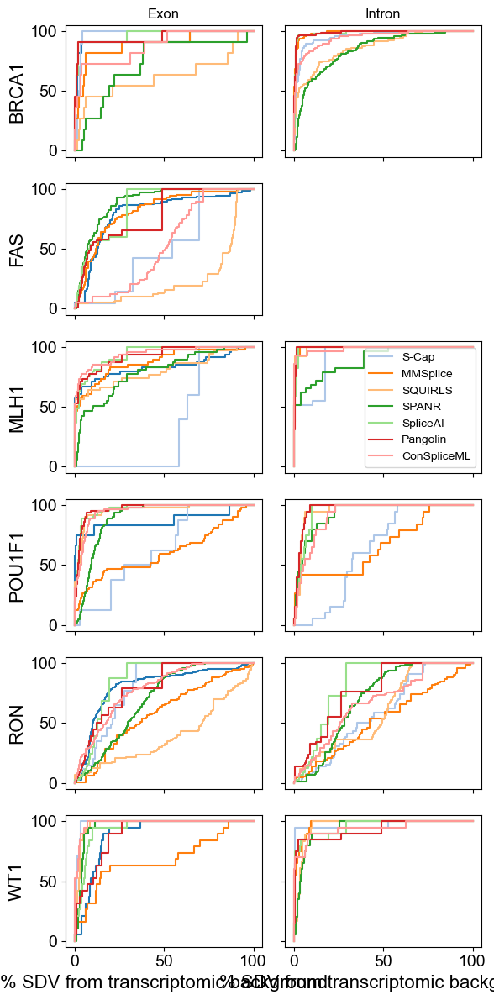

In [452]:
sens_2catnc_10_df = sens_by_cat_subplot( { name: df.loc[ df.variant_cat != 'Canonical' ] for name,df in data_dict.items() if name != 'Transcriptome' },
                                           back_df.loc[ back_df.variant_cat != 'Canonical' ],
                                           'sdv_fc2',
                                          pred_cols,
                                          [ 'Exon', 'Intron' ],
                                          'exon_cat',
                                         'tab20',
                                          { idx: thresh for idx,thresh in zip( threshold_df.index, threshold_df[ 'thresh_10' ] ) },
                                          10,
                                          .8,
                                          sharex = True,
                                          sharey = True,
                                          figsize = ( 6, 12 ) )

In [453]:
sens_2catnc_10_df[ [ col for col in sens_2catnc_10_df if col.startswith( 'Exon' ) and col.endswith( '_x' ) ] ].median()

Exon_HAL_pt_sens_x            0.620301
Exon_S-Cap_pt_sens_x          0.120471
Exon_MMSplice_pt_sens_x       0.340503
Exon_SQUIRLS_pt_sens_x        0.547786
Exon_SPANR_pt_sens_x          0.469069
Exon_SpliceAI_pt_sens_x       0.808808
Exon_Pangolin_pt_sens_x       0.631233
Exon_ConSpliceML_pt_sens_x    0.771800
dtype: float64

In [454]:
sens_2catnc_10_df[ [ col for col in sens_2catnc_10_df if col.startswith( 'Intron' ) and col.endswith( '_x' ) ] ].median()

Intron_HAL_pt_sens_x                 NaN
Intron_S-Cap_pt_sens_x          0.517241
Intron_MMSplice_pt_sens_x       0.950000
Intron_SQUIRLS_pt_sens_x        0.888889
Intron_SPANR_pt_sens_x          0.655172
Intron_SpliceAI_pt_sens_x       0.850000
Intron_Pangolin_pt_sens_x       0.950000
Intron_ConSpliceML_pt_sens_x    0.833333
dtype: float64

923 missing values in HAL_chgPER_abs in measured dataset BRCA1
282459 missing values in HAL_chgPER_abs in background dataset
39 missing values in S-Cap_sens_min_r in measured dataset BRCA1
305270 missing values in S-Cap_sens_min_r in background dataset
46995 missing values in SQUIRLS_score_not in background dataset
7772 missing values in SPANR_chgZPER_abs in background dataset
20453 missing values in SpliceAI_DS_maxm in background dataset
24316 missing values in ConSpliceML in background dataset
282459 missing values in HAL_chgPER_abs in background dataset
140 missing values in S-Cap_sens_min_r in measured dataset FAS
305270 missing values in S-Cap_sens_min_r in background dataset
1 missing values in SQUIRLS_score_not in measured dataset FAS
46995 missing values in SQUIRLS_score_not in background dataset
7772 missing values in SPANR_chgZPER_abs in background dataset
20453 missing values in SpliceAI_DS_maxm in background dataset
24316 missing values in ConSpliceML in background dataset


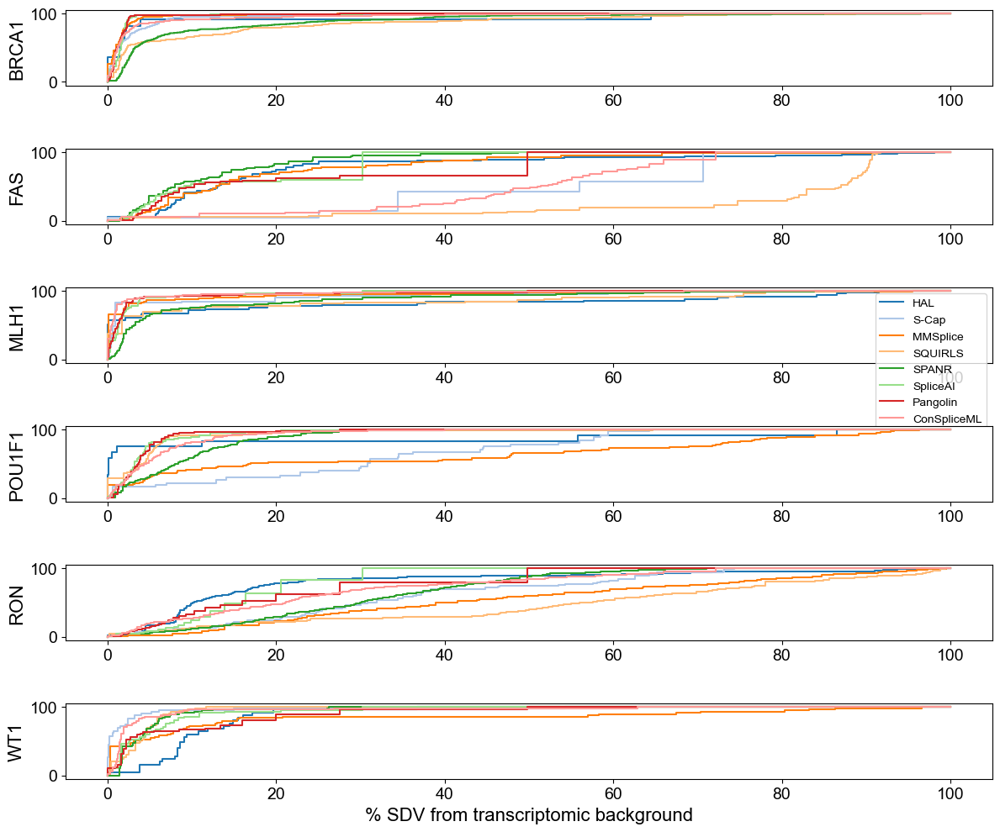

In [455]:
sens_5_df = sens_subplot( { name: df for name,df in data_dict.items() if name != 'Transcriptome' },
                              back_df,
                              'sdv_fc2',
                              pred_cols,
                              'tab20',
                               { idx: thresh for idx,thresh in zip( threshold_df.index, threshold_df[ 'thresh_5' ] ) },
                               5,
                               .8,
                            plot = False
                            )

923 missing values in HAL_chgPER_abs in measured dataset BRCA1
282459 missing values in HAL_chgPER_abs in background dataset
39 missing values in S-Cap_sens_min_r in measured dataset BRCA1
305270 missing values in S-Cap_sens_min_r in background dataset
46995 missing values in SQUIRLS_score_not in background dataset
7772 missing values in SPANR_chgZPER_abs in background dataset
20453 missing values in SpliceAI_DS_maxm in background dataset
24316 missing values in ConSpliceML in background dataset
282459 missing values in HAL_chgPER_abs in background dataset
140 missing values in S-Cap_sens_min_r in measured dataset FAS
305270 missing values in S-Cap_sens_min_r in background dataset
1 missing values in SQUIRLS_score_not in measured dataset FAS
46995 missing values in SQUIRLS_score_not in background dataset
7772 missing values in SPANR_chgZPER_abs in background dataset
20453 missing values in SpliceAI_DS_maxm in background dataset
24316 missing values in ConSpliceML in background dataset


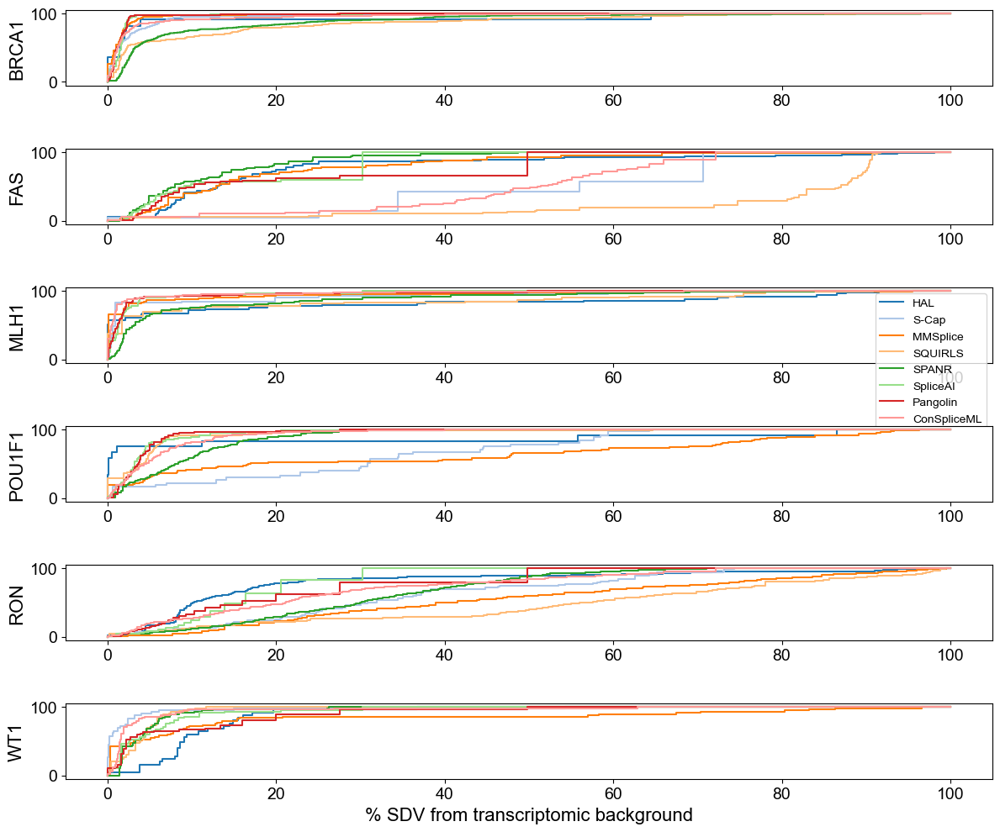

In [456]:
sens_20_df = sens_subplot( { name: df for name,df in data_dict.items() if name != 'Transcriptome' },
                              back_df,
                              'sdv_fc2',
                              pred_cols,
                              'tab20',
                              { idx: thresh for idx,thresh in zip( threshold_df.index, threshold_df[ 'thresh_20' ] ) },
                               20,
                               .8,
                            plot = False
                            )

In [457]:
sens_5_df[ [ col for col in sens_5_df if col.endswith( '_x' ) ] ].median()

HAL_pt_sens_x            0.416735
S-Cap_pt_sens_x          0.464702
MMSplice_pt_sens_x       0.410526
SQUIRLS_pt_sens_x        0.611766
SPANR_pt_sens_x          0.466391
SpliceAI_pt_sens_x       0.688871
Pangolin_pt_sens_x       0.664748
ConSpliceML_pt_sens_x    0.695450
dtype: float64

In [458]:
sens_20_df[ [ col for col in sens_20_df if col.endswith( '_x' ) ] ].median()

HAL_pt_sens_x            0.804307
S-Cap_pt_sens_x          0.575373
MMSplice_pt_sens_x       0.764531
SQUIRLS_pt_sens_x        0.786691
SPANR_pt_sens_x          0.830111
SpliceAI_pt_sens_x       0.946162
Pangolin_pt_sens_x       0.881634
ConSpliceML_pt_sens_x    0.945852
dtype: float64

282459 missing values in HAL_chgPER_abs in background dataset
38 missing values in S-Cap_sens_min_r in measured dataset BRCA1
305270 missing values in S-Cap_sens_min_r in background dataset
46995 missing values in SQUIRLS_score_not in background dataset
7772 missing values in SPANR_chgZPER_abs in background dataset
20453 missing values in SpliceAI_DS_maxm in background dataset
24316 missing values in ConSpliceML in background dataset
923 missing values in HAL_chgPER_abs in measured dataset BRCA1
No data to plot for BRCA1 Intron for tool HAL_chgPER_abs
1 missing values in S-Cap_sens_min_r in measured dataset BRCA1
305270 missing values in S-Cap_sens_min_r in background dataset
46995 missing values in SQUIRLS_score_not in background dataset
7772 missing values in SPANR_chgZPER_abs in background dataset
20453 missing values in SpliceAI_DS_maxm in background dataset


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


24316 missing values in ConSpliceML in background dataset
282459 missing values in HAL_chgPER_abs in background dataset
140 missing values in S-Cap_sens_min_r in measured dataset FAS
305270 missing values in S-Cap_sens_min_r in background dataset
1 missing values in SQUIRLS_score_not in measured dataset FAS
46995 missing values in SQUIRLS_score_not in background dataset
7772 missing values in SPANR_chgZPER_abs in background dataset
20453 missing values in SpliceAI_DS_maxm in background dataset


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


24316 missing values in ConSpliceML in background dataset
No data to plot for FAS Intron
282459 missing values in HAL_chgPER_abs in background dataset
152 missing values in S-Cap_sens_min_r in measured dataset MLH1
305270 missing values in S-Cap_sens_min_r in background dataset
10 missing values in SQUIRLS_score_not in measured dataset MLH1
46995 missing values in SQUIRLS_score_not in background dataset
7772 missing values in SPANR_chgZPER_abs in background dataset
20453 missing values in SpliceAI_DS_maxm in background dataset
24316 missing values in ConSpliceML in background dataset
126 missing values in HAL_chgPER_abs in measured dataset MLH1
No data to plot for MLH1 Intron for tool HAL_chgPER_abs
6 missing values in S-Cap_sens_min_r in measured dataset MLH1
305270 missing values in S-Cap_sens_min_r in background dataset
91 missing values in SQUIRLS_score_not in measured dataset MLH1
46995 missing values in SQUIRLS_score_not in background dataset
3 missing values in SPANR_chgZPER_abs

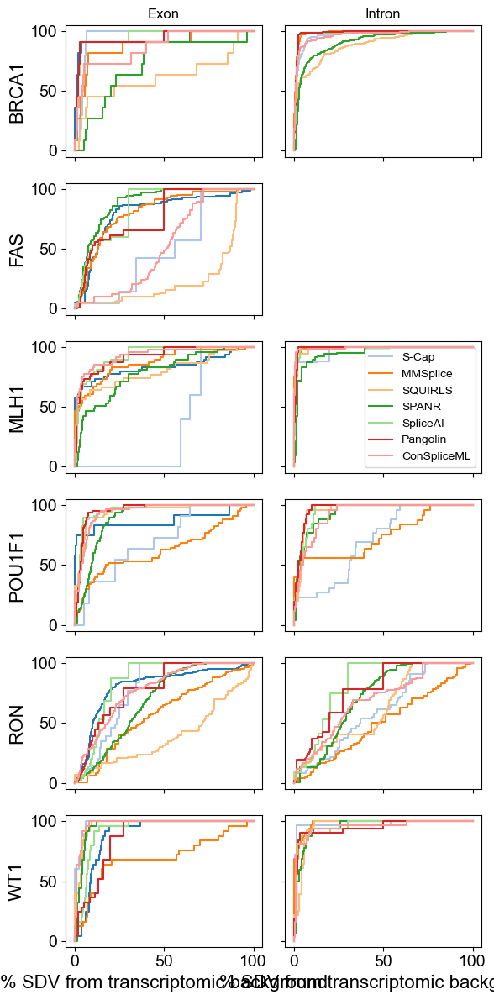

In [459]:
sens_2cat_5_df = sens_by_cat_subplot( { name: df for name,df in data_dict.items() if name != 'Transcriptome' },
                                           back_df,
                                           'sdv_fc2',
                                          pred_cols,
                                          [ 'Exon', 'Intron' ],
                                          'exon_cat',
                                         'tab20',
                                          { idx: thresh for idx,thresh in zip( threshold_df.index, threshold_df[ 'thresh_5' ] ) },
                                          5,
                                          .8,
                                          sharex = True,
                                          sharey = True,
                                          figsize = ( 6, 12 ) )

282459 missing values in HAL_chgPER_abs in background dataset
38 missing values in S-Cap_sens_min_r in measured dataset BRCA1
305270 missing values in S-Cap_sens_min_r in background dataset
46995 missing values in SQUIRLS_score_not in background dataset
7772 missing values in SPANR_chgZPER_abs in background dataset
20453 missing values in SpliceAI_DS_maxm in background dataset
24316 missing values in ConSpliceML in background dataset
923 missing values in HAL_chgPER_abs in measured dataset BRCA1
No data to plot for BRCA1 Intron for tool HAL_chgPER_abs
1 missing values in S-Cap_sens_min_r in measured dataset BRCA1
305270 missing values in S-Cap_sens_min_r in background dataset
46995 missing values in SQUIRLS_score_not in background dataset
7772 missing values in SPANR_chgZPER_abs in background dataset
20453 missing values in SpliceAI_DS_maxm in background dataset


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


24316 missing values in ConSpliceML in background dataset
282459 missing values in HAL_chgPER_abs in background dataset
140 missing values in S-Cap_sens_min_r in measured dataset FAS
305270 missing values in S-Cap_sens_min_r in background dataset
1 missing values in SQUIRLS_score_not in measured dataset FAS
46995 missing values in SQUIRLS_score_not in background dataset
7772 missing values in SPANR_chgZPER_abs in background dataset
20453 missing values in SpliceAI_DS_maxm in background dataset


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


24316 missing values in ConSpliceML in background dataset
No data to plot for FAS Intron
282459 missing values in HAL_chgPER_abs in background dataset
152 missing values in S-Cap_sens_min_r in measured dataset MLH1
305270 missing values in S-Cap_sens_min_r in background dataset
10 missing values in SQUIRLS_score_not in measured dataset MLH1
46995 missing values in SQUIRLS_score_not in background dataset
7772 missing values in SPANR_chgZPER_abs in background dataset
20453 missing values in SpliceAI_DS_maxm in background dataset
24316 missing values in ConSpliceML in background dataset
126 missing values in HAL_chgPER_abs in measured dataset MLH1
No data to plot for MLH1 Intron for tool HAL_chgPER_abs
6 missing values in S-Cap_sens_min_r in measured dataset MLH1
305270 missing values in S-Cap_sens_min_r in background dataset
91 missing values in SQUIRLS_score_not in measured dataset MLH1
46995 missing values in SQUIRLS_score_not in background dataset
3 missing values in SPANR_chgZPER_abs

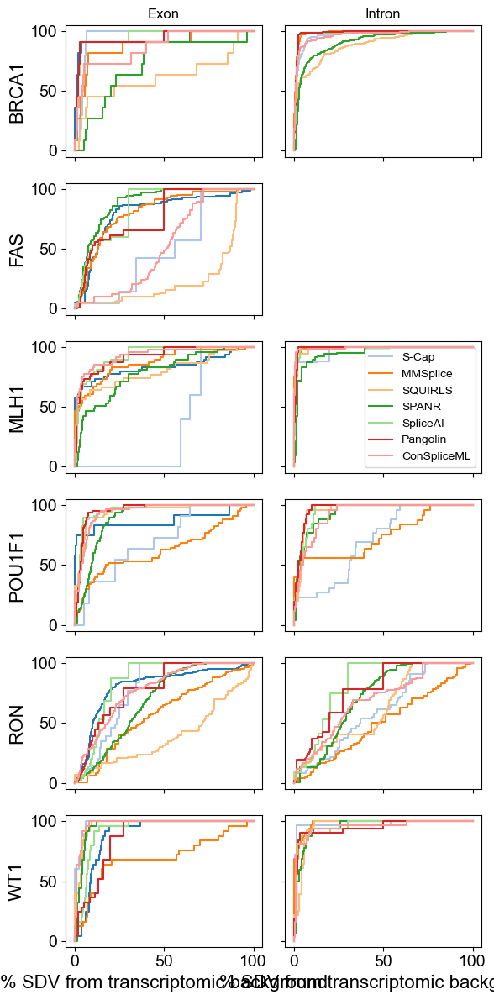

In [460]:
sens_2cat_20_df = sens_by_cat_subplot( { name: df for name,df in data_dict.items() if name != 'Transcriptome' },
                                           back_df,
                                           'sdv_fc2',
                                          pred_cols,
                                          [ 'Exon', 'Intron' ],
                                          'exon_cat',
                                         'tab20',
                                          { idx: thresh for idx,thresh in zip( threshold_df.index, threshold_df[ 'thresh_20' ] ) },
                                          20,
                                          .8,
                                          sharex = True,
                                          sharey = True,
                                          figsize = ( 6, 12 ) )

In [461]:
sens_2cat_5_df[ [ col for col in sens_2cat_10_df if col.startswith( 'Exon' ) and col.endswith( '_x' ) ] ].median()

Exon_S-Cap_pt_sens_x          0.021739
Exon_MMSplice_pt_sens_x       0.172360
Exon_SQUIRLS_pt_sens_x        0.367133
Exon_SPANR_pt_sens_x          0.241925
Exon_SpliceAI_pt_sens_x       0.458474
Exon_Pangolin_pt_sens_x       0.490000
Exon_ConSpliceML_pt_sens_x    0.589610
dtype: float64

In [462]:
sens_2cat_5_df[ [ col for col in sens_2cat_10_df if col.startswith( 'Intron' ) and col.endswith( '_x' ) ] ].median()

Intron_S-Cap_pt_sens_x          0.801802
Intron_MMSplice_pt_sens_x       0.843750
Intron_SQUIRLS_pt_sens_x        0.613208
Intron_SPANR_pt_sens_x          0.641509
Intron_SpliceAI_pt_sens_x       0.875000
Intron_Pangolin_pt_sens_x       0.906250
Intron_ConSpliceML_pt_sens_x    0.812500
dtype: float64

In [249]:
sens_2cat_20_df[ [ col for col in sens_2cat_10_df if col.startswith( 'Exon' ) and col.endswith( '_x' ) ] ].median()

Exon_HAL_pt_sens_x            0.804307
Exon_S-Cap_pt_sens_x          0.355731
Exon_MMSplice_pt_sens_x       0.663478
Exon_SQUIRLS_pt_sens_x        0.560606
Exon_SPANR_pt_sens_x          0.679858
Exon_SpliceAI_pt_sens_x       0.893321
Exon_Pangolin_pt_sens_x       0.768571
Exon_ConSpliceML_pt_sens_x    0.792208
dtype: float64

In [250]:
sens_2cat_20_df[ [ col for col in sens_2cat_10_df if col.startswith( 'Intron' ) and col.endswith( '_x' ) ] ].median()

Intron_HAL_pt_sens_x                 NaN
Intron_S-Cap_pt_sens_x          0.891892
Intron_MMSplice_pt_sens_x       0.990991
Intron_SQUIRLS_pt_sens_x        0.960000
Intron_SPANR_pt_sens_x          0.884615
Intron_SpliceAI_pt_sens_x       0.990566
Intron_Pangolin_pt_sens_x       0.995283
Intron_ConSpliceML_pt_sens_x    0.937500
dtype: float64

276629 missing values in HAL_chgPER_abs in background dataset
38 missing values in S-Cap_sens_min_r in measured dataset BRCA1
305164 missing values in S-Cap_sens_min_r in background dataset
46455 missing values in SQUIRLS_score_not in background dataset
7707 missing values in SPANR_chgZPER_abs in background dataset
20225 missing values in SpliceAI_DS_maxm in background dataset
24022 missing values in ConSpliceML in background dataset
805 missing values in HAL_chgPER_abs in measured dataset BRCA1
No data to plot for BRCA1 Intron for tool HAL_chgPER_abs
1 missing values in S-Cap_sens_min_r in measured dataset BRCA1
305164 missing values in S-Cap_sens_min_r in background dataset
46455 missing values in SQUIRLS_score_not in background dataset
7707 missing values in SPANR_chgZPER_abs in background dataset
20225 missing values in SpliceAI_DS_maxm in background dataset


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


24022 missing values in ConSpliceML in background dataset
276629 missing values in HAL_chgPER_abs in background dataset
140 missing values in S-Cap_sens_min_r in measured dataset FAS
305164 missing values in S-Cap_sens_min_r in background dataset
1 missing values in SQUIRLS_score_not in measured dataset FAS
46455 missing values in SQUIRLS_score_not in background dataset
7707 missing values in SPANR_chgZPER_abs in background dataset
20225 missing values in SpliceAI_DS_maxm in background dataset


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


24022 missing values in ConSpliceML in background dataset
No data to plot for FAS Intron
276629 missing values in HAL_chgPER_abs in background dataset
152 missing values in S-Cap_sens_min_r in measured dataset MLH1
305164 missing values in S-Cap_sens_min_r in background dataset
10 missing values in SQUIRLS_score_not in measured dataset MLH1
46455 missing values in SQUIRLS_score_not in background dataset
7707 missing values in SPANR_chgZPER_abs in background dataset
20225 missing values in SpliceAI_DS_maxm in background dataset
24022 missing values in ConSpliceML in background dataset
44 missing values in HAL_chgPER_abs in measured dataset MLH1
No data to plot for MLH1 Intron for tool HAL_chgPER_abs
6 missing values in S-Cap_sens_min_r in measured dataset MLH1
305164 missing values in S-Cap_sens_min_r in background dataset
15 missing values in SQUIRLS_score_not in measured dataset MLH1
46455 missing values in SQUIRLS_score_not in background dataset
7707 missing values in SPANR_chgZPER_a

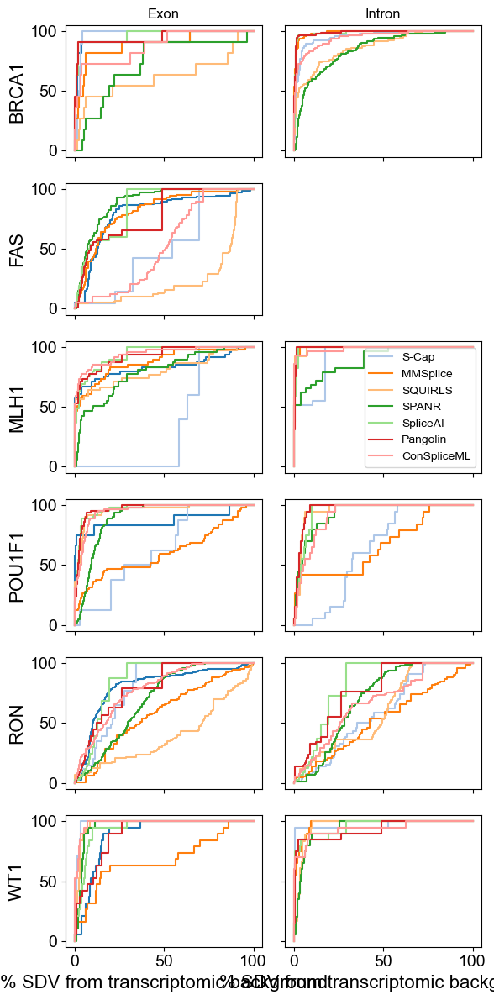

In [251]:
sens_2catnc_5_df = sens_by_cat_subplot( { name: df.loc[ df.variant_cat != 'Canonical' ] for name,df in data_dict.items() if name != 'Transcriptome' },
                                           back_df.loc[ back_df.variant_cat != 'Canonical' ],
                                           'sdv_fc2',
                                          pred_cols,
                                          [ 'Exon', 'Intron' ],
                                          'exon_cat',
                                         'tab20',
                                          { idx: thresh for idx,thresh in zip( threshold_df.index, threshold_df[ 'thresh_5' ] ) },
                                          5,
                                          .8,
                                          sharex = True,
                                          sharey = True,
                                          figsize = ( 6, 12 ) )

276629 missing values in HAL_chgPER_abs in background dataset
38 missing values in S-Cap_sens_min_r in measured dataset BRCA1
305164 missing values in S-Cap_sens_min_r in background dataset
46455 missing values in SQUIRLS_score_not in background dataset
7707 missing values in SPANR_chgZPER_abs in background dataset
20225 missing values in SpliceAI_DS_maxm in background dataset
24022 missing values in ConSpliceML in background dataset
805 missing values in HAL_chgPER_abs in measured dataset BRCA1
No data to plot for BRCA1 Intron for tool HAL_chgPER_abs
1 missing values in S-Cap_sens_min_r in measured dataset BRCA1
305164 missing values in S-Cap_sens_min_r in background dataset
46455 missing values in SQUIRLS_score_not in background dataset
7707 missing values in SPANR_chgZPER_abs in background dataset
20225 missing values in SpliceAI_DS_maxm in background dataset


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


24022 missing values in ConSpliceML in background dataset
276629 missing values in HAL_chgPER_abs in background dataset
140 missing values in S-Cap_sens_min_r in measured dataset FAS
305164 missing values in S-Cap_sens_min_r in background dataset
1 missing values in SQUIRLS_score_not in measured dataset FAS
46455 missing values in SQUIRLS_score_not in background dataset
7707 missing values in SPANR_chgZPER_abs in background dataset
20225 missing values in SpliceAI_DS_maxm in background dataset


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


24022 missing values in ConSpliceML in background dataset
No data to plot for FAS Intron
276629 missing values in HAL_chgPER_abs in background dataset
152 missing values in S-Cap_sens_min_r in measured dataset MLH1
305164 missing values in S-Cap_sens_min_r in background dataset
10 missing values in SQUIRLS_score_not in measured dataset MLH1
46455 missing values in SQUIRLS_score_not in background dataset
7707 missing values in SPANR_chgZPER_abs in background dataset
20225 missing values in SpliceAI_DS_maxm in background dataset
24022 missing values in ConSpliceML in background dataset
44 missing values in HAL_chgPER_abs in measured dataset MLH1
No data to plot for MLH1 Intron for tool HAL_chgPER_abs
6 missing values in S-Cap_sens_min_r in measured dataset MLH1
305164 missing values in S-Cap_sens_min_r in background dataset
15 missing values in SQUIRLS_score_not in measured dataset MLH1
46455 missing values in SQUIRLS_score_not in background dataset
7707 missing values in SPANR_chgZPER_a

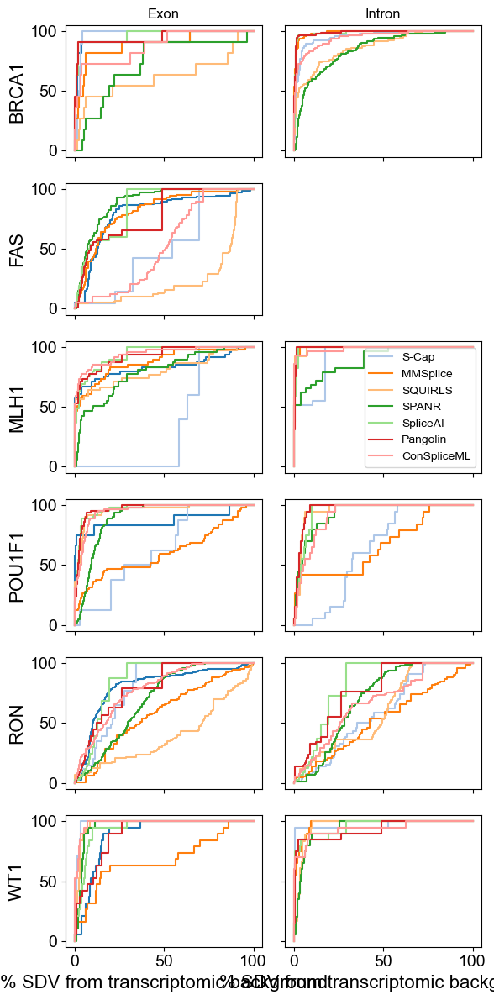

In [252]:
sens_2catnc_20_df = sens_by_cat_subplot( { name: df.loc[ df.variant_cat != 'Canonical' ] for name,df in data_dict.items() if name != 'Transcriptome' },
                                           back_df.loc[ back_df.variant_cat != 'Canonical' ],
                                           'sdv_fc2',
                                          pred_cols,
                                          [ 'Exon', 'Intron' ],
                                          'exon_cat',
                                         'tab20',
                                          { idx: thresh for idx,thresh in zip( threshold_df.index, threshold_df[ 'thresh_20' ] ) },
                                          20,
                                          .8,
                                          sharex = True,
                                          sharey = True,
                                          figsize = ( 6, 12 ) )

In [253]:
auc_sens = pd.concat( [ overall_auc_t, sens_10_df ],
                      axis = 1 )

In [254]:
auc_sens

,HAL_pr_auc,S-Cap_pr_auc,MMSplice_pr_auc,SQUIRLS_pr_auc,SPANR_pr_auc,SpliceAI_pr_auc,Pangolin_pr_auc,ConSpliceML_pr_auc,HAL_pr_auc_lb,S-Cap_pr_auc_lb,...,Pangolin_pt_sens_x,ConSpliceML_pt_sens_x,HAL_pt_sens_y,S-Cap_pt_sens_y,MMSplice_pt_sens_y,SQUIRLS_pt_sens_y,SPANR_pt_sens_y,SpliceAI_pt_sens_y,Pangolin_pt_sens_y,ConSpliceML_pt_sens_y
BRCA1,0.454831,0.635574,0.900424,0.656898,0.673635,0.952055,0.951569,0.862849,0.452914,0.634122,...,0.982063,0.914798,2.409201,4.757356,2.2748,20.787850,15.607198,2.110533,2.3794,3.198552
FAS,0.696832,0.607572,0.674324,0.652313,0.586052,0.846630,0.852601,0.725276,0.696870,0.602113,...,0.486957,0.052174,22.928092,100.000000,32.5470,90.317105,19.760761,100.000000,100.0000,66.020720
MLH1,0.815820,0.987674,0.965934,0.858304,0.806012,0.978410,0.981332,0.968435,0.810101,0.987485,...,0.931250,0.931250,37.733117,7.793355,3.6666,24.014746,17.735887,3.673467,2.9158,1.615568
POU1F1,0.747586,0.298793,0.442747,0.664895,0.346785,0.844135,0.858112,0.584544,0.735686,0.309630,...,0.947917,0.802083,11.170308,54.316233,72.9776,6.265052,15.454424,5.236400,5.7210,9.196652
RON,0.856861,0.764392,0.762856,0.736524,0.746294,0.793010,0.804247,0.767889,0.855390,0.762635,...,0.330073,0.261614,22.830179,59.342680,76.2758,83.371707,45.533777,30.236035,100.0000,45.486079
WT1,0.284185,0.412937,0.666934,0.570005,0.479005,0.783502,0.736488,0.835897,0.283419,0.412028,...,0.666667,0.964912,14.890526,2.952293,15.3348,5.973003,6.219476,8.421281,20.0054,3.899858


In [255]:
def pr_scatter( pr_data,
                pred_cols,
                plot_x,
                plot_y,
                figsize = ( 6, 12 ),
                sharex = True,
                sharey = True,
                color = plt.get_cmap( 'tab20' ),
                savefig = False,
                **kwargs ):
    
    df = pr_data.copy()

    fig, ax = plt.subplots( len( df ),
                            1,
                            figsize = figsize,
                          sharex = sharex,
                          sharey = sharey )

    for i,data in enumerate( df.index ):
        
        for k,tool in enumerate( pred_cols ):
        
            plot_df = df.loc[ data ].copy()
    
            ax[ i ].scatter( plot_df[ tool.split( '_' )[ 0 ] + plot_x ],
                             100*plot_df[ tool.split( '_' )[ 0 ] + plot_y ],
                             color = color( k ),
                             label = tool.split( '_' )[ 0 ],
                             **kwargs )
    
        ax[ i ].set_xlim( ( 0, 1 ) )
        ax[ len( df ) - 1 ].set_xlabel( 'prAUC' )
    
        ax[ i ].set_ylim( ( 0, 100 ) )
        ax[ i ].set_ylabel( data )
        
    ax[ i ].legend( loc = 'center left',
                    bbox_to_anchor = ( 1.2, 1.5 ) )
    
    if savefig:

        plt.savefig( savefig,
                     bbox_inches = 'tight' )
    
    plt.show()

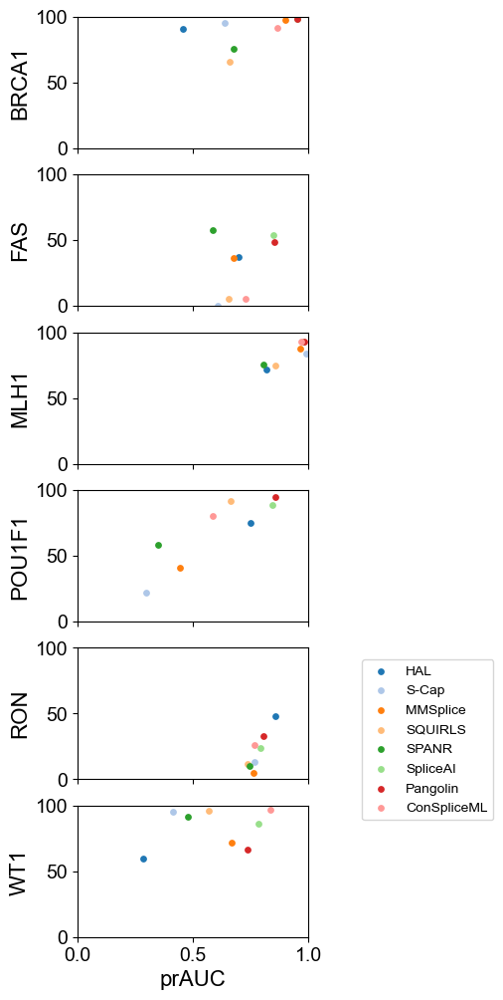

In [256]:
pr_scatter( auc_sens,
            pred_cols,
            '_pr_auc',
            '_pt_sens_x',
            figsize = ( 3, 12 ),
            savefig = '../plots/sensPT10_by_prAUC.pdf',
           s = 15,
          )

/var/folders/r6/x8gz8gvd109_mbz6dbq7d3zc0000gr/T/ipykernel_13455/372000901.py:1: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  youden_cat = roc_curve_subplot( { cat: pd.concat( [ df.loc[ df.variant_cat == cat_translate[ cat ] ] for name,df in data_dict.items() if name != 'Transcriptome' ] )
/var/folders/r6/x8gz8gvd109_mbz6dbq7d3zc0000gr/T/ipykernel_13455/372000901.py:1: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  youden_cat = roc_curve_subplot( { cat: pd.concat( [ df.loc[ df.variant_cat == cat_translate[ cat ] ] for name,df in data_dict.items() if name != 'Transcriptome' ] )
/var/folders/r6/x8gz8gvd109_mbz6dbq7d3zc0000gr/T/ipykernel_13455/372000901.py:1: FutureWarning: In a future version, object-dtype columns with all-bool values

160 missing values in HAL_chgPER_abs column for dataset Deep Exon.
855 missing values in S-Cap_sens_min_r column for dataset Deep Exon.
29 missing values in HAL_chgPER_abs column for dataset Exon Near Junction.
283 missing values in S-Cap_sens_min_r column for dataset Exon Near Junction.
11 missing values in SQUIRLS_score_not column for dataset Exon Near Junction.
1170 missing values in HAL_chgPER_abs column for dataset Proximal Intron.
No non-missing values in HAL_chgPER_abs column for dataset Proximal Intron - skipping...
240 missing values in S-Cap_sens_min_r column for dataset Proximal Intron.
162 missing values in MMSplice_chgPERlogit_abs column for dataset Proximal Intron.
1 missing values in SQUIRLS_score_not column for dataset Proximal Intron.
643 missing values in HAL_chgPER_abs column for dataset Intron Near Junction.
No non-missing values in HAL_chgPER_abs column for dataset Intron Near Junction - skipping...
22 missing values in S-Cap_sens_min_r column for dataset Intron Ne

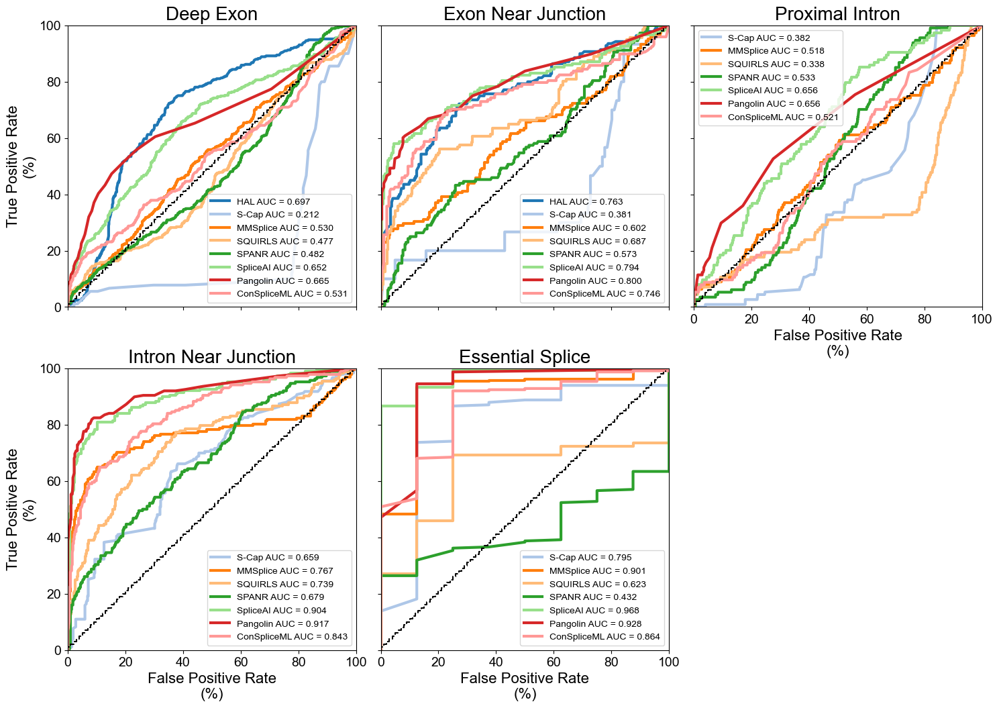

In [257]:
youden_cat = roc_curve_subplot( { cat: pd.concat( [ df.loc[ df.variant_cat == cat_translate[ cat ] ] for name,df in data_dict.items() if name != 'Transcriptome' ] )
                                  for cat in cats },
                                'sdv_fc2',
                               pred_cols,
                               plt.get_cmap( 'tab20' ), 
                               linewidth = 3,
                               savefile = '../plots/ROC_youdenj_varcat.pdf' 
                             )

In [258]:
youden_all

,BRCA1,FAS,MLH1,POU1F1,RON,WT1
HAL,58.600000,33.300000,56.500000,78.100000,33.100000,20.000000
S-Cap,0.713710,0.052632,0.471132,0.032333,0.064516,0.879032
MMSplice,0.965754,0.245527,0.665326,0.410551,0.140313,0.254595
SQUIRLS,0.008644,0.005630,0.008544,0.015911,0.006758,0.015061
SPANR,2.232000,2.233000,2.436000,1.707000,1.185000,2.205000
SpliceAI,0.295970,0.049549,0.174815,0.083895,0.028121,0.073181
Pangolin,0.310000,0.060000,0.170000,0.080000,0.040000,0.150000
ConSpliceML,0.726000,0.015000,0.809000,0.304000,0.322000,0.682000


In [259]:
youden_all = pd.concat( [ youden_all, youden_cat ],
                        axis = 1 )

In [260]:
youden_all[ 'Recommended' ] = [ 5, .05, 2, .011977, 2.5, .2, .2, .5 ]

In [261]:
youden_all[ 'Tubeuf, et al (2020)' ] = [ 5, np.nan, np.nan, np.nan, .449, np.nan, np.nan, np.nan ]

In [262]:
youden_all[ 'Riepe, et al (2021)' ] = [ np.nan, np.nan, 1.4, np.nan, 1.624, .16, np.nan, np.nan ]

In [263]:
youden_all[ 'Ha, et al (2021)' ] = [ np.nan, np.nan, np.nan, np.nan, np.nan, .22, np.nan, np.nan ]

In [264]:
youden_all[ 'Rowlands, et al (2021)' ] = [ np.nan, np.nan, .289276, np.nan, 1.849, .145, np.nan, np.nan ]

In [265]:
{ name: ( youden_all.loc[ name ][ [ 'BRCA1', 'FAS', 'POU1F1', 'MLH1', 'RON', 'WT1' ] ].min(),
          youden_all.loc[ name ][ [ 'BRCA1', 'FAS', 'POU1F1', 'MLH1', 'RON', 'WT1' ] ].max() )
  for name in youden_all.index }

{'HAL': (20.0, 78.1),
 'S-Cap': (0.03233256351, 0.879032258065),
 'MMSplice': (0.140312861722677, 0.9657540047566808),
 'SQUIRLS': (0.0056303919067672, 0.0159113360665014),
 'SPANR': (1.185, 2.436),
 'SpliceAI': (0.0281208157539367, 0.2959703207015991),
 'Pangolin': (0.04, 0.31),
 'ConSpliceML': (0.015, 0.809)}

In [266]:
{ name: ( youden_all.loc[ name ][ cats ].min(),
          youden_all.loc[ name ][ cats ].max() )
  for name in youden_all.index }

{'HAL': (20.2, 20.3),
 'S-Cap': (0.012096774194, inf),
 'MMSplice': (0.0789371395595918, 1.1926745398347618),
 'SQUIRLS': (0.0115654462247569, 0.0688977288093994),
 'SPANR': (0.542, 3.289),
 'SpliceAI': (0.0035179257392883, 0.7371101379394531),
 'Pangolin': (0.02, 0.46),
 'ConSpliceML': (0.002, 0.909)}

In [267]:
def youden_subplot( youdens_df,
                    measured_cols,
                    cat_cols,
                    lit_cols,
                    rec_col,
                    measured_cmap,
                    cat_cmap,
                    lit_cmap,
                    rec_color,
                    ylim,
                    figsize = ( 15, 5 ),
                    sharex = False,
                    sharey = False,
                    savefile = None,
                    **kwargs ):

    youden = youdens_df.copy()

    sub_size = int( np.ceil( np.sqrt( len( youden ) ) ) )

    fig, ax = plt.subplots( 1,
                            len( youden.index ),
                            figsize = figsize,
                            sharex = sharex,
                            sharey = sharey )

    for t,tool in enumerate( youden.index ):

        tool_df = youden.loc[ tool ].copy()

        ax[ t ].set_title( tool,
                                fontsize = 16 )

        for m,mcol in enumerate( measured_cols ):

            ax[ t ].scatter( ( m - 2 )*.06,
                             tool_df[ mcol ],
                             color = measured_cmap( ( m + 2 )*35 ),
                             label = mcol,
                             **kwargs
                                )

        ax[ t ].scatter( 0,
                         tool_df[ measured_cols ].median(),
                         marker = '_',
                         s = 500,
                         color = 'dodgerblue',
                         label = 'Median' )
        
        for c,ccol in enumerate( cat_cols ):

            ax[ t ].scatter( 1 + ( c - 2 )*.06,
                                  tool_df[ ccol ],
                                  color = cat_cmap( ( c + 2 )*35 ),
                                  label = ccol,
                                  **kwargs
                                )
            
        ax[ t ].scatter( 1,
                         tool_df[ cat_cols ].median(),
                         marker = '_',
                         s = 500,
                         color = 'red',
                         label = 'Median' )


        for l,lcol in enumerate( lit_cols ):

            ax[ t ].scatter(  2 + ( l - 2 )*.06,
                                   tool_df[ lcol ],
                                   color = lit_cmap( ( l + 3 )*25 ),
                                   label = lcol,
                                    **kwargs
                                )

        ax[ t ].axhline( tool_df[ rec_col ],
                              color = rec_color,
                              ls = '--',
                              label = rec_col )

        start, end = ax[ t ].get_xlim()
        ax[ t ].xaxis.set_ticks( [ 0, 1, 2 ] )


        ax[ 0 ].set_ylabel( "Youden's J Treshold",
                                 fontsize = 16 )
        ax[ t ].set_ylim( ylim[ t ] )
        ax[ t ].tick_params( axis = 'y', labelsize = 14 )
        ax[ t ].set_xticklabels( [ 'Current Benchmark', 'Variant type', 'Previous Benchmark' ],
                                 rotation = 90,
                                 fontsize = 14 )

        ax[ t ].set_xlim( ( -.3, 2.3 ) )

    ax[ int( np.floor( len( youden.index ) / 2 ) ) ].set_xlabel( 'Optimal Threshold Results',
                                                             fontsize = 16 )

    ax[ len( youden.index ) - 1 ].legend( loc = 'center left',
                                          bbox_to_anchor = ( 1.1, .5 ) )

    plt.tight_layout()

    if savefile:
        plt.savefig( savefile,
                     dpi = 300,
                     #bbox_inches = 'tight'
                   )

    plt.show()

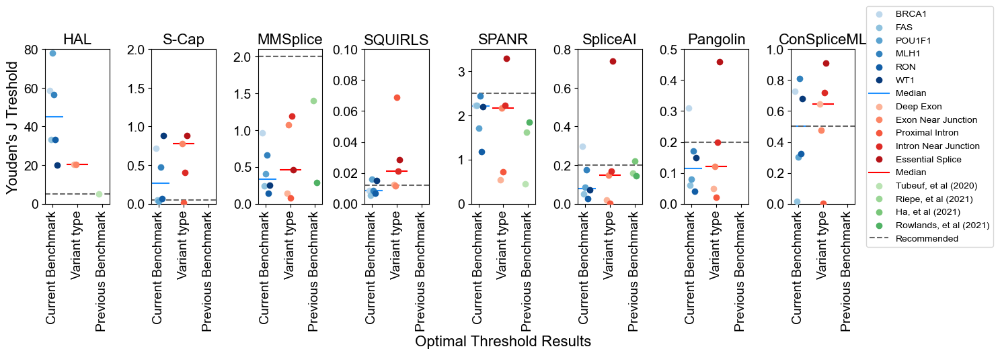

In [268]:
youden_subplot( youden_all,
                 [ 'BRCA1', 'FAS', 'POU1F1', 'MLH1', 'RON', 'WT1' ],
                cats,
                 [ 'Tubeuf, et al (2020)', 'Riepe, et al (2021)', 'Ha, et al (2021)', 'Rowlands, et al (2021)' ],
                 'Recommended',
                 plt.get_cmap( 'Blues' ),
                 plt.get_cmap( 'Reds' ),
                 plt.get_cmap( 'Greens' ),
                 '.4',
                 [ ( 0, 80 ), ( 0, 2 ), ( 0, 2.1 ), ( 0, .1 ), ( 0, 3.5 ), ( 0, .8 ), ( 0, .5 ), ( 0, 1 ) ],
                 sharex = True,
                 savefile = '../plots/youdenj.pdf',
                 zorder = 1000
               )

In [269]:
( youden_all.loc[ 'SpliceAI' ][ [ 'BRCA1', 'FAS', 'POU1F1', 'MLH1', 'RON', 'WT1' ] ] < .2 ).sum()

5

In [270]:
( youden_all.loc[ 'Pangolin' ][ [ 'BRCA1', 'FAS', 'POU1F1', 'MLH1', 'RON', 'WT1' ] ] < .2 ).sum()

5

In [271]:
( youden_all.loc[ 'ConSpliceML' ][ [ 'BRCA1', 'FAS', 'POU1F1', 'MLH1', 'RON', 'WT1' ] ] < .5 ).sum()

3

In [272]:
100*( 13 / 18 )

72.22222222222221

# annotation effects

In [273]:
lit_marker_d = { True: ( '^', 'black', 'face', 1.5, 250 ) }

Your labels might not show up in the notebook! Check saved pdf before butchering code!


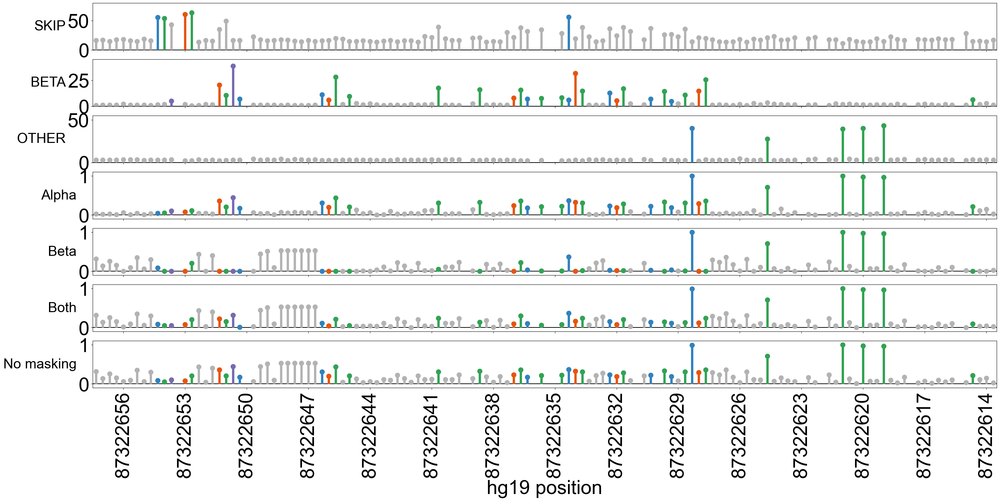

In [379]:
sp.sat_lollipop_subplots_wrapper( pou1f1_sat.rename( columns = { 'ref': 'ref_c',
                                                                  'alt': 'alt_c',
                                                                  'ref_c': 'ref',
                                                                  'alt_c': 'alt' } ),
                                [ 'wmean_SKIP', 'wmean_BETA', 'wmean_OTHER', 'DS_maxm', 'DS_maxm_noalpha', 'DS_maxm_both', 'DS_max', ],
                                'hg19_pos',
                                grays,
                                zoom = ( 1112, 1155 ),
                                fig_size = ( 35, 15 ),
                                share_y = False,
                                legend = False,
                                darken_bars = [ ( 'SKIP_sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ),
                                                  ( 'BETA_sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ),
                                                  ( 'OTHER_sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ] \
                                                + [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ]*4,
                                y_ax_lim = [ ( -.1, 80 ), ( -.1, 45 ), ( -.1, 55 ), ] + [ ( -.1, 1.1 ) ]*4,
                                y_ax_title = [ 'SKIP', 'BETA', 'OTHER', 'Alpha', 'Beta', 'Both', 'No masking' ],
                                y_label_fontsize = 30,
                                y_label_rotation = 0,
                                x_ax_title = 'hg19 position',
                                hlines = [ ( 0, 'black', 'solid' ) for i in range( 7 ) ],
                                bar_labels = [ ( 'patient_var', lit_marker_d, 88 ) ],
                                tight = False,
                                save_margin = 1,
                                tick_spacing = 3,
                                savefile = '../plots/pou1f1_splai_zoom.pdf'
                           )

In [275]:
youden_all

,BRCA1,FAS,MLH1,POU1F1,RON,WT1,Deep Exon,Exon Near Junction,Proximal Intron,Intron Near Junction,Essential Splice,Recommended,"Tubeuf, et al (2020)","Riepe, et al (2021)","Ha, et al (2021)","Rowlands, et al (2021)"
HAL,58.600000,33.300000,56.500000,78.100000,33.100000,20.000000,20.200000,20.300000,NaN,NaN,NaN,5.000000,5.000,NaN,NaN,NaN
S-Cap,0.713710,0.052632,0.471132,0.032333,0.064516,0.879032,inf,0.775982,0.012097,0.407258,0.885621,0.050000,NaN,NaN,NaN,NaN
MMSplice,0.965754,0.245527,0.665326,0.410551,0.140313,0.254595,0.140313,1.068090,0.078937,1.192675,0.461398,2.000000,NaN,1.400,NaN,0.289276
SQUIRLS,0.008644,0.005630,0.008544,0.015911,0.006758,0.015061,0.012509,0.011565,0.068898,0.021205,0.028405,0.011977,NaN,NaN,NaN,NaN
SPANR,2.232000,2.233000,2.436000,1.707000,1.185000,2.205000,0.542000,2.173000,0.721000,2.232000,3.289000,2.500000,0.449,1.624,NaN,1.849000
SpliceAI,0.295970,0.049549,0.174815,0.083895,0.028121,0.073181,0.018306,0.146595,0.003518,0.170237,0.737110,0.200000,NaN,0.160,0.22,0.145000
Pangolin,0.310000,0.060000,0.170000,0.080000,0.040000,0.150000,0.050000,0.120000,0.020000,0.200000,0.460000,0.200000,NaN,NaN,NaN,NaN
ConSpliceML,0.726000,0.015000,0.809000,0.304000,0.322000,0.682000,0.644000,0.477000,0.002000,0.720000,0.909000,0.500000,NaN,NaN,NaN,NaN


In [276]:
( ( ( pou1f1_sat.DS_maxm <= 0.083895 ) & ( pou1f1_sat.DS_maxm_noalpha > 0.083895 ) ) \
| ( ( pou1f1_sat.DS_maxm > 0.083895 ) & ( pou1f1_sat.DS_maxm_noalpha <= 0.083895 ) ) ).sum() / len( data_dict[ 'POU1F1' ] )

0.1381509032943677

In [277]:
( ( ( pou1f1_sat.DS_maxm <= 0.083895 ) & ( pou1f1_sat.DS_maxm_noalpha > 0.083895 ) ) \
| ( ( pou1f1_sat.DS_maxm > 0.083895 ) & ( pou1f1_sat.DS_maxm_noalpha <= 0.083895 ) ) ).sum()

130

In [278]:
len( data_dict[ 'POU1F1' ] )

941

In [279]:
( ( ( pou1f1_sat.DS_maxm <= 0.083895 ) & ( pou1f1_sat.DS_maxm_both > 0.083895 ) ) \
| ( ( pou1f1_sat.DS_maxm > 0.083895 ) & ( pou1f1_sat.DS_maxm_both <= 0.083895 ) ) ).sum() / len( data_dict[ 'POU1F1' ] )

0.10520722635494155

In [280]:
( ( ( pou1f1_sat.DS_maxm <= 0.083895 ) & ( pou1f1_sat.DS_maxm_both > 0.083895 ) ) \
| ( ( pou1f1_sat.DS_maxm > 0.083895 ) & ( pou1f1_sat.DS_maxm_both <= 0.083895 ) ) ).sum()

99

In [281]:
data_dict[ 'POU1F1' ].loc[ data_dict[ 'POU1F1' ].patient_var ][ [ 'hgvs_pos', 'alt_c', 'DS_maxm', 'DS_maxm_noalpha', 'DS_maxm_both', 'DS_maxm_type', 'DS_maxm_type_noalpha', 'DS_maxm_type_both'] ]

,hgvs_pos,alt_c,DS_maxm,DS_maxm_noalpha,DS_maxm_both,DS_maxm_type,DS_maxm_type_noalpha,DS_maxm_type_both
212,c.143-5,G,0.209608,0.000946,0.159234,DS_AGm,DS_AGm,DS_ALm
242,c.148,G,0.311502,0.053037,0.245869,DS_AGm,DS_AGm,DS_ALm
247,c.150,G,0.328959,0.000940,0.138493,DS_AGm,DS_DLm,DS_ALm
253,c.152,G,0.360230,0.222809,0.301442,DS_AGm,DS_AGm,DS_ALm
254,c.153,A,0.178692,0.040508,0.103035,DS_AGm,DS_DLm,DS_ALm
259,c.155,G,0.311503,0.024461,0.239621,DS_AGm,DS_DLm,DS_ALm
265,c.157,G,0.284832,0.022089,0.208343,DS_AGm,DS_DLm,DS_ALm
439,c.219,G,0.414052,0.277853,0.414052,DS_ALm,DS_AGm,DS_ALm
645,c.292+1,T,0.983388,0.983388,0.983388,DS_DLm,DS_DLm,DS_DLm


In [282]:
wt1_regions = { 'Acceptor': ( 1227, 1269 ),
                   'Exon': ( 1270, 1347 ),
                   'KTS- donor': ( 1348, 1356 ),
                   'KTS+ donor': ( 1357, 1365 ),
                   'Downstream intron': ( 1366, 1399 ),
                   }

In [283]:
{ region: ( wt1_sat.loc[ wt1_sat.pos == bd[ 0 ] ].hg19_pos.min(),
            wt1_sat.loc[ wt1_sat.pos == bd[ 1 ] ].hg19_pos.max() )
  for region, bd in wt1_regions.items() }

{'Acceptor': (32413650, 32413608),
 'Exon': (32413607, 32413530),
 'KTS- donor': (32413529, 32413521),
 'KTS+ donor': (32413520, 32413512),
 'Downstream intron': (32413511, 32413478)}

In [284]:
lit_marker_d = { 'FS': ( '^', 'black', 'face', 1.5, 250 ),
                 'OTDSD': ( 'd', 'black', 'face', 1.5, 250 ),
                 '': ( None, 'black', 'face', 0, 0  )}

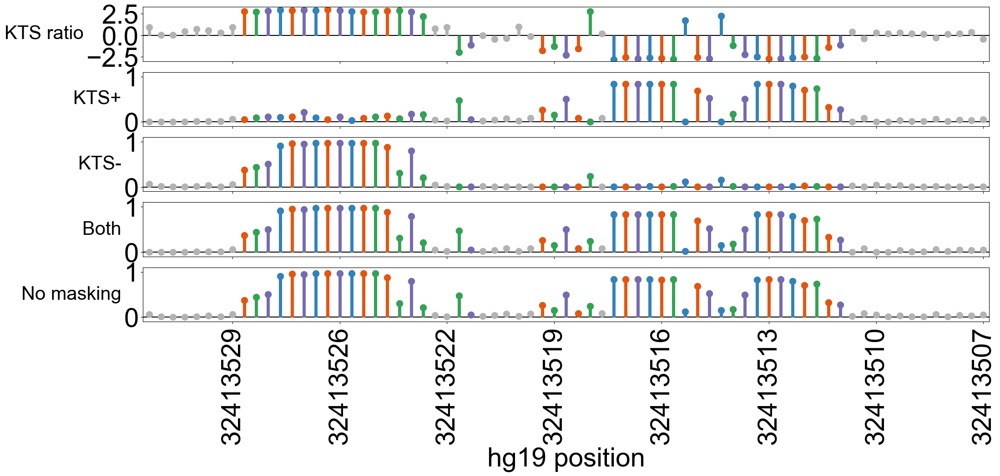

In [423]:
sp.sat_lollipop_subplots_wrapper( wt1_sat.rename( columns = { 'ref': 'ref_c',
                                                                  'alt': 'alt_c',
                                                                  'ref_c': 'ref',
                                                                  'alt_c': 'alt' } ),
                                [ 'wmean_KTS_+_ratio_log2' ] + [ 'DS_maxm', 'DS_maxm_nopos', 'DS_maxm_both', 'DS_max' ],
                                'hg19_pos',
                                grays,
                                zoom = ( 1345, 1370 ),
                                fig_size = ( 24, 9 ),
                                share_y = False,
                                legend = False,
                                darken_bars = [ ( 'KTS_+_ratio_log2_sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ), ] \
                                                + [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ]*4,
                                y_ax_lim = [ ( -3, 3.3 ), ] + [ ( -.1, 1.1 ) ]*4,
                                y_ax_title = [ 'KTS ratio', 'KTS+', 'KTS-', 'Both', 'No masking' ],
                                y_label_fontsize = 30,
                                y_label_rotation = 0,
                                x_ax_title = 'hg19 position',
                                hlines = [ ( 0, 'black', 'solid' ) for i in range( 5 ) ],
                                tick_spacing = 3,
                                tight = False,
                                save_margin = 1,
                                savefile = '../plots/wt1_splai_zoom.pdf'
                           )

In [286]:
youden_all

,BRCA1,FAS,MLH1,POU1F1,RON,WT1,Deep Exon,Exon Near Junction,Proximal Intron,Intron Near Junction,Essential Splice,Recommended,"Tubeuf, et al (2020)","Riepe, et al (2021)","Ha, et al (2021)","Rowlands, et al (2021)"
HAL,58.600000,33.300000,56.500000,78.100000,33.100000,20.000000,20.200000,20.300000,NaN,NaN,NaN,5.000000,5.000,NaN,NaN,NaN
S-Cap,0.713710,0.052632,0.471132,0.032333,0.064516,0.879032,inf,0.775982,0.012097,0.407258,0.885621,0.050000,NaN,NaN,NaN,NaN
MMSplice,0.965754,0.245527,0.665326,0.410551,0.140313,0.254595,0.140313,1.068090,0.078937,1.192675,0.461398,2.000000,NaN,1.400,NaN,0.289276
SQUIRLS,0.008644,0.005630,0.008544,0.015911,0.006758,0.015061,0.012509,0.011565,0.068898,0.021205,0.028405,0.011977,NaN,NaN,NaN,NaN
SPANR,2.232000,2.233000,2.436000,1.707000,1.185000,2.205000,0.542000,2.173000,0.721000,2.232000,3.289000,2.500000,0.449,1.624,NaN,1.849000
SpliceAI,0.295970,0.049549,0.174815,0.083895,0.028121,0.073181,0.018306,0.146595,0.003518,0.170237,0.737110,0.200000,NaN,0.160,0.22,0.145000
Pangolin,0.310000,0.060000,0.170000,0.080000,0.040000,0.150000,0.050000,0.120000,0.020000,0.200000,0.460000,0.200000,NaN,NaN,NaN,NaN
ConSpliceML,0.726000,0.015000,0.809000,0.304000,0.322000,0.682000,0.644000,0.477000,0.002000,0.720000,0.909000,0.500000,NaN,NaN,NaN,NaN


In [287]:
data_dict[ 'WT1' ].loc[ data_dict[ 'WT1' ].patient_var == 'OTDSD' ][ [ 'hgvs_var', 'lit_interp', 'KTS_+_ratio_log2', 'DS_maxm', 'DS_maxm_nopos', 'DS_maxm_both', 'DS_maxm_type', 'DS_maxm_type_nopos', 'DS_maxm_type_both'] ]

,hgvs_var,lit_interp,KTS_+_ratio_log2,DS_maxm,DS_maxm_nopos,DS_maxm_both,DS_maxm_type,DS_maxm_type_nopos,DS_maxm_type_both
107,c.1447+3:G>A,VUS/Conflicting (CV),1.698235,0.002206,0.118306,0.022863,DS_AGm,DS_DGm,DS_DLm
145,c.1437:A>G,VUS/Conflicting (CV),2.794571,0.086988,0.441423,0.441423,DS_ALm,DS_DLm,DS_DLm


In [288]:
data_dict[ 'WT1' ].loc[ data_dict[ 'WT1' ].patient_var == 'FS' ][ [ 'hgvs_var', 'lit_interp', 'KTS_+_ratio_log2', 'DS_maxm', 'DS_maxm_nopos', 'DS_maxm_both', 'DS_maxm_type', 'DS_maxm_type_nopos', 'DS_maxm_type_both'] ]

,hgvs_var,lit_interp,KTS_+_ratio_log2,DS_maxm,DS_maxm_nopos,DS_maxm_both,DS_maxm_type,DS_maxm_type_nopos,DS_maxm_type_both
98,c.1447+6:T>A,Pathogenic/Likely_pathogenic (CV),-2.638416,0.791262,0.013087,0.791262,DS_DLm,DS_ALm,DS_DLm
101,c.1447+5:G>A,Pathogenic/Likely_pathogenic (CV),-2.407885,0.830277,0.001880,0.830277,DS_DLm,DS_ALm,DS_DLm
103,c.1447+5:G>T,Pathogenic/Likely_pathogenic (ACMG),-2.702405,0.831351,0.000354,0.831351,DS_DLm,DS_AGm,DS_DLm
106,c.1447+4:C>T,Pathogenic/Likely_pathogenic (CV),-2.189693,0.498647,0.000284,0.498647,DS_DLm,DS_AGm,DS_DLm
109,c.1447+3:G>T,Pathogenic/Likely_pathogenic (ACMG),-2.611827,0.520600,0.000404,0.520600,DS_DLm,DS_AGm,DS_DLm
111,c.1447+2:T>C,Pathogenic/Likely_pathogenic (CV),-2.512295,0.830516,0.005382,0.830516,DS_DLm,DS_ALm,DS_DLm
113,c.1447+1:G>A,Pathogenic/Likely_pathogenic (ACMG),-2.743420,0.832216,0.000615,0.832216,DS_DLm,DS_AGm,DS_DLm
114,c.1447+1:G>C,Pathogenic/Likely_pathogenic (ACMG),-2.543528,0.832385,0.000801,0.832385,DS_DLm,DS_AGm,DS_DLm


In [289]:
wt1_thresh = { tool: youden_all.loc[ tool ][ 'WT1' ] for tool in youden_all.index }

In [290]:
wt1_thresh

{'HAL': 20.0,
 'S-Cap': 0.879032258065,
 'MMSplice': 0.2545954683782793,
 'SQUIRLS': 0.0150611702761736,
 'SPANR': 2.205,
 'SpliceAI': 0.0731809735298156,
 'Pangolin': 0.15,
 'ConSpliceML': 0.682}

In [291]:
wt1_right = pd.DataFrame( { region: [ ( ( ( data_dict[ 'WT1' ].pos >= bd[ 0 ] ) \
                                         & ( data_dict[ 'WT1' ].pos <= bd[ 1 ] ) \
                                         & ~( data_dict[ 'WT1' ].sdv_fc2 ) \
                                         & ( data_dict[ 'WT1' ][ tool_col ] < wt1_thresh[ tool_col.split( '_' )[ 0 ] ] ) ).sum() \
                                        + ( ( data_dict[ 'WT1' ].pos >= bd[ 0 ] ) \
                                         & ( data_dict[ 'WT1' ].pos <= bd[ 1 ] ) \
                                         & ( data_dict[ 'WT1' ].sdv_fc2 ) \
                                         & ( data_dict[ 'WT1' ][ tool_col ] >= wt1_thresh[ tool_col.split( '_' )[ 0 ] ] ) ).sum() ) \
                                        / ( ( data_dict[ 'WT1' ].pos >= bd[ 0 ] ) \
                                            & ( data_dict[ 'WT1' ].pos <= bd[ 1 ] ) \
                                            & ( data_dict[ 'WT1' ][ tool_col ].notnull() ) ).sum()
                                       if len( data_dict[ 'WT1' ].loc[ ( data_dict[ 'WT1' ].pos >= bd[ 0 ] ) & ( data_dict[ 'WT1' ].pos <= bd[ 1 ] ) & ( data_dict[ 'WT1' ][ tool_col ].notnull() ) ] ) > 10
                                       else np.nan
                                       for tool_col in pred_cols ]
                              for region,bd in wt1_regions.items() },
                            index = pred_cols )

In [292]:
wt1_right

,Acceptor,Exon,KTS- donor,KTS+ donor,Downstream intron
HAL_chgPER_abs,NaN,0.543478,0.916667,NaN,NaN
S-Cap_sens_min_r,0.983051,0.846154,NaN,0.666667,0.704082
MMSplice_chgPERlogit_abs,0.435484,0.808696,0.750000,0.807692,0.948980
SQUIRLS_score_not,0.701613,0.960870,0.708333,0.863636,0.846939
SPANR_chgZPER_abs,0.806452,0.769565,0.750000,0.846154,0.744898
SpliceAI_DS_maxm,0.870968,0.856522,0.791667,0.807692,0.969388
Pangolin_max_abs,0.975806,0.978261,0.250000,0.807692,1.000000
ConSpliceML,0.887097,0.934783,0.833333,0.807692,0.979592


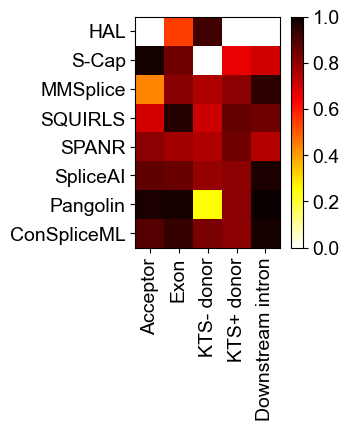

In [293]:
sp.correlation_heat_map( wt1_right,
                          color = 'hot_r',
                          hmin = 0,
                          hmax = 1,
                          ytick_labels = ylab,
                          xtick_labels = wt1_right.columns.tolist(),
                          savefile = '../plots/wt1_heat_corr_accur.pdf' 
                        )

# Discussion

In [294]:
len( pred_cols )

8

In [295]:
sum( len( data_dict[ name ].exon_num.unique() ) for name in data_dict if name != 'Transcriptome' and name != 'MLH1' )

15

In [296]:
data_dict[ 'MLH1' ][ 'pubmed_ref' ] = data_dict[ 'MLH1' ][ [ col for col in data_dict[ 'MLH1' ] if 'ref_' in col and col != 'ref_name' ] ].fillna('').astype(str).add(', ').sum(axis=1).str.rstrip(', ')

In [297]:
cat_translate_r = { value: key for key,value in cat_translate.items() }

In [298]:
for name in data_dict:
    
    data_dict[ name ][ 'variant_trans' ] = [ cat_translate_r[ cat ] for cat in data_dict[ name ].variant_cat ]

In [299]:
fas_out = data_dict[ 'FAS' ][ [ 'transcript_id', 'exon_num', 'chrom', 'hg19_pos', 'ref', 'alt', 'variant_trans', 'EnrichmentScore',  ] + pred_cols + [ 'sdv_fc2' ] ]

In [300]:
ron_out = data_dict[ 'RON' ][ [ 'transcript_id', 'exon_num', 'chrom', 'hg19_pos', 'ref', 'alt', 'variant_trans', 'AE skipping (%)', 'other (%)', 'full IR (%)', 'first IR (%)', 'second IR (%)',  ] + pred_cols + [ 'sdv_fc2' ] ]

In [301]:
pou1f1_out = data_dict[ 'POU1F1' ][ [ 'transcript_id_alpha', 'exon_num', 'chrom', 'hg19_pos', 'ref', 'alt', 'variant_trans', 'wmean_SKIP', 'wmean_BETA', 'wmean_OTHER'  ] + pred_cols + [ 'DS_maxm_noalpha', 'transcript_id_beta', 'DS_maxm_both', 'sdv_fc2', 'patient_var' ] ]

In [302]:
wt1_out = data_dict[ 'WT1' ][ [ 'transcript_id_KTS+', 'exon_num', 'chrom', 'hg19_pos', 'ref', 'alt', 'variant_trans', 'wmean_KTS_+_ratio_log2', 'wmean_SKIP_100', 'wmean_OTHER_100',  ] + pred_cols + [ 'DS_maxm_nopos', 'transcript_id_KTS-', 'DS_maxm_both', 'sdv_fc2', 'patient_var' ] ]

In [303]:
brca1_out = data_dict[ 'BRCA1' ][ [ 'transcript_id', 'exon_num', 'chrom', 'hg19_pos', 'ref', 'alt', 'variant_trans', 'function.score.mean', 'mean.rna.score'  ] + pred_cols + [ 'sdv_fc2' ] ]

In [304]:
mlh1_out = data_dict[ 'MLH1' ][ [ 'transcript_id', 'exon_num', 'chrom', 'Variant', 'hg19_pos', 'hg38_pos', 'ref', 'alt', 'variant_trans',   ] + pred_cols + [ 'sdv_fc2', 'pubmed_ref' ] ]

In [305]:
trans_out = data_dict[ 'Transcriptome' ][ [ 'transcript_id', 'gene_name', 'chrom', 'hg19_pos', 'ref', 'alt', 'variant_trans',   ] + pred_cols ]

In [306]:
fas_out = fas_out.rename( columns = { 'transcript_id' : 'Transcript ID',
                                      'exon_num': 'Exon', 
                                      'chrom' : 'Chrom',
                                       'hg19_pos': 'HG19 pos',
                                      'variant_trans': 'Variant class', 
                                      'EnrichmentScore': 'Enrichment score (measured)',
                                       'HAL_chgPER_abs': 'HAL',
                                       'S-Cap_sens_min_r': 'S-Cap',
                                      'MMSplice_chgPERlogit_abs': 'MMSplice',
                                      'SQUIRLS_score_not': 'SQUIRLS',
                                      'SPANR_chgZPER_abs': 'SPANR',
                                       'SpliceAI_DS_maxm': 'SpliceAI', 
                                       'Pangolin_max_abs': 'Pangolin',
                                       'sdv_fc2': 'SDV' } )

In [307]:
ron_out = ron_out.rename( columns = { 'transcript_id' : 'Transcript ID',
                                      'exon_num': 'Exon', 
                                      'chrom' : 'Chrom',
                                       'hg19_pos': 'HG19 pos',
                                      'variant_trans': 'Variant class', 
                                      'AE skipping (%)': 'SKIP (measured)',
                                      'other (%)': 'OTHER (measured)', 
                                      'full IR (%)': 'FULL IR (measured)', 
                                      'first IR (%)': 'FIRST IR (measured)', 
                                        'second IR (%)': 'SECOND IR (measured)',
                                       'HAL_chgPER_abs': 'HAL',
                                       'S-Cap_sens_min_r': 'S-Cap',
                                      'MMSplice_chgPERlogit_abs': 'MMSplice',
                                      'SQUIRLS_score_not': 'SQUIRLS',
                                      'SPANR_chgZPER_abs': 'SPANR',
                                       'SpliceAI_DS_maxm': 'SpliceAI', 
                                       'Pangolin_max_abs': 'Pangolin',
                                       'sdv_fc2': 'SDV' } )

In [308]:
pou1f1_out = pou1f1_out.rename( columns = { 'transcript_id_alpha' : 'Transcript ID (alpha)',
                                      'exon_num': 'Exon', 
                                      'chrom' : 'Chrom',
                                       'hg19_pos': 'HG19 pos',
                                      'variant_trans': 'Variant class', 
                                      'wmean_SKIP': 'SKIP (measured)', 
                                        'wmean_BETA': 'BETA (measured)',
                                        'wmean_OTHER': 'OTHER (measured)',
                                       'HAL_chgPER_abs': 'HAL',
                                       'S-Cap_sens_min_r': 'S-Cap',
                                      'MMSplice_chgPERlogit_abs': 'MMSplice',
                                      'SQUIRLS_score_not': 'SQUIRLS',
                                      'SPANR_chgZPER_abs': 'SPANR',
                                       'SpliceAI_DS_maxm': 'SpliceAI (alpha)', 
                                       'Pangolin_max_abs': 'Pangolin',
                                        'DS_maxm_noalpha': 'SpliceAI (beta)', 
                                        'transcript_id_beta': 'Transcript ID (beta)',
                                         'DS_max_both': 'SpliceAI (both)',
                                       'sdv_fc2': 'SDV',
                                          'patient_var': 'CPHD Patient' } )

In [309]:
wt1_out = wt1_out.rename( columns = { 'transcript_id_KTS+' : 'Transcript ID (KTS+)',
                                      'exon_num': 'Exon', 
                                      'chrom' : 'Chrom',
                                       'hg19_pos': 'HG19 pos',
                                      'variant_trans': 'Variant class', 
                                      'wmean_KTS_+_ratio_log2': 'KTS ratio (measured)', 
                                      'wmean_SKIP_100': 'SKIP (measured)', 
                                      'wmean_OTHER_100': 'OTHER (measured)',
                                       'HAL_chgPER_abs': 'HAL',
                                       'S-Cap_sens_min_r': 'S-Cap',
                                      'MMSplice_chgPERlogit_abs': 'MMSplice',
                                      'SQUIRLS_score_not': 'SQUIRLS',
                                      'SPANR_chgZPER_abs': 'SPANR',
                                       'SpliceAI_DS_maxm': 'SpliceAI (KTS+)', 
                                       'Pangolin_max_abs': 'Pangolin',
                                       'DS_max_nopos': 'SpliceAI (KTS-)',
                                       'transcript_id_KTS-': 'Transcript ID (KTS-)',
                                       'DS_maxm_both': 'SpliceAI (both)',
                                       'sdv_fc2': 'SDV',
                                       'patient_var': 'ClinVar/Literature Interpretation' } )

In [310]:
brca1_out = brca1_out.rename( columns = { 'transcript_id' : 'Transcript ID',
                                      'exon_num': 'Exon', 
                                      'chrom' : 'Chrom',
                                       'hg19_pos': 'HG19 pos',
                                      'variant_trans': 'Variant class', 
                                      'function.score.mean': 'LOF (measured)', 
                                        'mean.rna.score': 'RNA (measured)',
                                       'HAL_chgPER_abs': 'HAL',
                                       'S-Cap_sens_min_r': 'S-Cap',
                                      'MMSplice_chgPERlogit_abs': 'MMSplice',
                                      'SQUIRLS_score_not': 'SQUIRLS',
                                      'SPANR_chgZPER_abs': 'SPANR',
                                       'SpliceAI_DS_maxm': 'SpliceAI', 
                                       'Pangolin_max_abs': 'Pangolin',
                                       'sdv_fc2': 'SDV' } )

In [311]:
mlh1_out = mlh1_out.rename( columns = { 'transcript_id' : 'Transcript ID',
                                      'exon_num': 'Exon', 
                                      'chrom' : 'Chrom',
                                       'Variant': 'HGVS variant',
                                       'hg19_pos': 'HG19 pos',
                                       'hg38_pos': 'HG38 pos',
                                      'variant_trans': 'Variant class', 
                                       'HAL_chgPER_abs': 'HAL',
                                       'S-Cap_sens_min_r': 'S-Cap',
                                      'MMSplice_chgPERlogit_abs': 'MMSplice',
                                      'SQUIRLS_score_not': 'SQUIRLS',
                                      'SPANR_chgZPER_abs': 'SPANR',
                                       'SpliceAI_DS_maxm': 'SpliceAI', 
                                       'Pangolin_max_abs': 'Pangolin',
                                       'sdv_fc2': 'SDV',
                                       'pubmed_ref': 'Pubmed ID(s)'} )

In [312]:
trans_out = trans_out.rename( columns = { 'transcript_id' : 'Transcript ID',
                                      'gene_name': 'Gene', 
                                      'chrom' : 'Chrom',
                                       'hg19_pos': 'HG19 pos',
                                      'variant_trans': 'Variant class', 
                                       'HAL_chgPER_abs': 'HAL',
                                       'S-Cap_sens_min_r': 'S-Cap',
                                      'MMSplice_chgPERlogit_abs': 'MMSplice',
                                      'SQUIRLS_score_not': 'SQUIRLS',
                                      'SPANR_chgZPER_abs': 'SPANR',
                                       'SpliceAI_DS_maxm': 'SpliceAI', 
                                       'Pangolin_max_abs': 'Pangolin', } )

In [313]:
data_out = '../output/'

In [314]:
!mkdir {data_out}

mkdir: ../output/: File exists


In [315]:
fas_out.to_csv( data_out + 'FAS_supp.txt',
                sep = '\t',
                index = False )

In [316]:
ron_out.to_csv( data_out + 'RON_supp.txt',
                sep = '\t',
                index = False )

In [317]:
pou1f1_out.to_csv( data_out + 'POU1F1_supp.txt',
                sep = '\t',
                index = False )

In [318]:
wt1_out.to_csv( data_out + 'WT1_supp.txt',
                sep = '\t',
                index = False )

In [319]:
brca1_out.to_csv( data_out + 'BRCA1_supp.txt',
                sep = '\t',
                index = False )

In [320]:
mlh1_out.to_csv( data_out + 'MLH1_supp.txt',
                sep = '\t',
                index = False )

In [321]:
trans_out.to_csv( data_out + 'TRANS_supp.txt',
                sep = '\t',
                index = False )

In [322]:
threshold_df = threshold_df.rename( columns = { 'thresh_5': 'Threshold for 5% SDV',
                                                'thresh_10': 'Threshold for 10% SDV',
                                                'thresh_15': 'Threshold for 15% SDV',
                                                'thresh_20': 'Threshold for 20% SDV' } )

In [323]:
threshold_df.to_csv( data_out + 'trans_norm_thresh.txt',
                     sep = '\t',
                     index = True )

In [324]:
sens_10_out = pd.concat( [ sens_10_df[ [ col for col in sens_10_df if col.endswith( '_x' ) ] ].T.copy(),
                           sens_2cat_10_df[ [ col for col in sens_2cat_10_df if col.endswith( '_x' ) ] ].T.copy(),
                           sens_2catnc_10_df.rename( columns = { col: col.replace( 'Intron_', 'Intron_NonCanon_' )
                                                                 for col in sens_2catnc_10_df } )[ [ col.replace( 'Intron_', 'Intron_NonCanon_' ) for col in sens_2cat_10_df if col.endswith( '_x' ) and 'Intron' in col ] ].T ] )                          

In [325]:
sens_10_out.index = [ idx.replace( '_pt_sens_x', '' ) for idx in sens_10_out.index ]

In [326]:
sens_5_out = pd.concat( [ sens_5_df[ [ col for col in sens_5_df if col.endswith( '_x' ) ] ].T.copy(),
                           sens_2cat_5_df[ [ col for col in sens_2cat_5_df if col.endswith( '_x' ) ] ].T.copy(),
                           sens_2catnc_5_df.rename( columns = { col: col.replace( 'Intron_', 'Intron_NonCanon_' )
                                                                 for col in sens_2catnc_5_df } )[ [ col.replace( 'Intron_', 'Intron_NonCanon_' ) for col in sens_2cat_5_df if col.endswith( '_x' ) and 'Intron' in col ] ].T ] )                          

In [327]:
sens_5_out.index = [ idx.replace( '_pt_sens_x', '' ) for idx in sens_5_out.index ]

In [328]:
sens_20_out = pd.concat( [ sens_20_df[ [ col for col in sens_20_df if col.endswith( '_x' ) ] ].T.copy(),
                           sens_2cat_20_df[ [ col for col in sens_2cat_20_df if col.endswith( '_x' ) ] ].T.copy(),
                           sens_2catnc_20_df.rename( columns = { col: col.replace( 'Intron_', 'Intron_NonCanon_' )
                                                                 for col in sens_2catnc_20_df } )[ [ col.replace( 'Intron_', 'Intron_NonCanon_' ) for col in sens_2cat_20_df if col.endswith( '_x' ) and 'Intron' in col ] ].T ] )                          

In [329]:
auc_out = pd.concat( [ sens_10_df[ [ col for col in sens_10_df if col.endswith( '_sens' ) ] ].T.copy(),
                       sens_2cat_10_df[ [ col for col in sens_2cat_10_df if col.endswith( '_sens' ) ] ].T.copy(),
                       sens_2catnc_10_df.rename( columns = { col: col.replace( 'Intron_', 'Intron_NonCanon_' )
                                                             for col in sens_2catnc_10_df } )[ [ col.replace( 'Intron_', 'Intron_NonCanon_' ) for col in sens_2cat_10_df if col.endswith( '_sens' ) and 'Intron' in col ] ].T ] )                          

In [330]:
auc_out.index = [ idx.replace( '_auc_sens', '' ) for idx in auc_out.index ]

In [331]:
sens_20_out.index = [ idx.replace( '_pt_sens_x', '' ) for idx in sens_20_out.index ]

In [332]:
sens_10_out.to_csv( data_out + 'trans_norm_sens_10.txt',
                    sep = '\t', )

In [333]:
sens_5_out.to_csv( data_out + 'trans_norm_sens_5.txt',
                    sep = '\t', )

In [334]:
sens_20_out.to_csv( data_out + 'trans_norm_sens_20.txt',
                    sep = '\t', )

In [335]:
auc_out.to_csv( data_out + 'trans_norm_sens_auc.txt',
                    sep = '\t', )

In [336]:
youden_all[ [ 'BRCA1', 'FAS', 'MLH1', 'POU1F1', 'RON', 'WT1', 'Deep Exon',
       'Exon Near Junction', 'Proximal Intron', 'Intron Near Junction',
       'Essential Splice', ] ].to_csv( data_out + 'youden_thresh.txt',
                                       sep = '\t' )